<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Simulation_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Simulated Data - Fine-tuning Transfer Learning

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


from sklearn.datasets import make_classification
import random

from imblearn.datasets import make_imbalance


In [65]:
dataset_size = 50000
nfeatures = 20
ninformative = 20

k = 5


X, y = make_classification(n_samples=dataset_size, n_features=nfeatures, n_informative=ninformative,
                           n_redundant=nfeatures-ninformative, n_classes=2, random_state=42)

X, y = make_imbalance(X, y, sampling_strategy={0: int(dataset_size/2), 1:int(dataset_size/(2*k))},
                              random_state=42)

X = X.astype(int)

# X[:,:int(ninformative/2)] = X[:,:int(ninformative/2)].astype(int)

X = pd.DataFrame(X)
y = pd.DataFrame(y)

y

## Creating binary features:
X.iloc[:,0]= (X.iloc[:,0] >= -1.5).astype(int)
X.iloc[:,1]= (X.iloc[:,1] >= -1.).astype(int)
X.iloc[:,2:5]= (X.iloc[:,2:5] >= 0).astype(int)


## Creating categorical features:
bins1 = [-15, -5, 5, 15]
labels1 = [0, 1, 2]
X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
for i in range(2):
  X.iloc[:, i+6] = (pd.cut(X.iloc[:, i+6], bins=bins1, labels=labels1, right=False).astype(int) +int(10-2*i)).astype('category')

## Second group of categorical features:
bins2 = [-15, -3, 0, 3, 15]
labels2 = [0, 1, 2, 3]
for i in range(2):
  X.iloc[:, i+8] = (pd.cut(X.iloc[:, i+8], bins=bins2, labels=labels2, right=False).astype(int) +int(5+i)).astype('category')


data_total = X
data_total['Y'] = y
data_total = data_total.dropna().reset_index(drop=True)
data_total





##  -------------------- Creating source label y2 using related information and noise from y: ------------------------

weighting = [0.9, 0.1]

length1 = len(data_total[data_total['Y']==0])
length2 = len(data_total[data_total['Y']==1])

## Creating random noise around y to create similar information for y2:
random.seed(42)
range1 = random.choices([0, 1], weights = weighting, k=length1)
range2 = random.choices([0, -1], weights = weighting, k=length2)
range_total = range1+range2

## Converting the original y-feature to source label y2, and creating new y-feature with noise
data_total['Y2'] = data_total['Y']
data_total['Y'] = data_total['Y'] + range_total

data_total


<ipython-input-65-fdc592739d5b>:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        1
1        1
2        1
3        1
4        0
        ..
29995    1
29996    1
29997    1
29998    1
29999    1
Name: 5, Length: 30000, dtype: category
Categories (3, int64): [0, 1, 2]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
<ipython-input-65-fdc592739d5b>:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        11
1        11
2        11
3        11
4        11
         ..
29995    11
29996    11
29997    11
29998    11
29999    11
Name: 6, Length: 30000, dtype: category
Categories (3, int64): [10, 11, 12]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1,1,1,0,1,1,11,9,7,8,...,2,-1,-2,-3,1,1,0,2,0,0
1,1,1,1,1,0,1,11,9,7,7,...,1,-1,0,0,-1,2,2,0,0,0
2,0,1,1,0,1,1,11,9,7,8,...,-1,0,0,0,0,-1,-2,0,0,0
3,1,1,1,1,1,1,11,9,7,8,...,2,2,4,1,0,-3,-3,2,0,0
4,0,1,1,1,0,0,11,9,7,6,...,4,-4,-1,-1,-3,2,4,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1,1,1,0,1,1,11,9,8,8,...,0,3,0,4,3,3,-4,5,1,1
29996,0,1,1,1,0,1,11,9,7,8,...,-3,1,-4,0,0,3,0,-2,1,1
29997,1,1,0,1,1,1,11,9,7,7,...,6,-2,2,2,-2,3,-3,-1,1,1
29998,1,0,1,1,0,1,11,9,7,8,...,1,-2,-2,0,3,1,0,-3,1,1


In [66]:
data_total['Y'].value_counts()

,count
Y,
0,23016
1,6984


In [67]:
data_total['Y2'].value_counts()

,count
Y2,
0,25000
1,5000


In [68]:
X = data_total.iloc[:, :-2]
y = data_total.iloc[:,-2]
y2 = data_total.iloc[:,-1]
y

,Y
0,0
1,0
2,0
3,0
4,0
...,...
29995,1
29996,1
29997,1
29998,1


In [69]:
y.corr(y2)

np.float64(0.7075148912774233)

In [70]:
y.value_counts()

,count
Y,
0,23016
1,6984


In [71]:
y2.value_counts()

,count
Y2,
0,25000
1,5000


In [72]:
X.iloc[:,0].value_counts()

,count
0,
1,23310
0,6690


In [73]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [74]:
data2 = pd.concat([X_scaled, y, y2], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0,0
4,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1,1
29996,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1,1
29997,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1,1
29998,1.0,0.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.541667,0.428571,0.409091,0.523810,0.60,0.523810,0.541667,0.318182,1,1


In [75]:
y.corr(y2)

np.float64(0.7075148912774233)

In [76]:
y.value_counts()

,count
Y,
0,23016
1,6984


In [77]:
y2.value_counts()

,count
Y2,
0,25000
1,5000


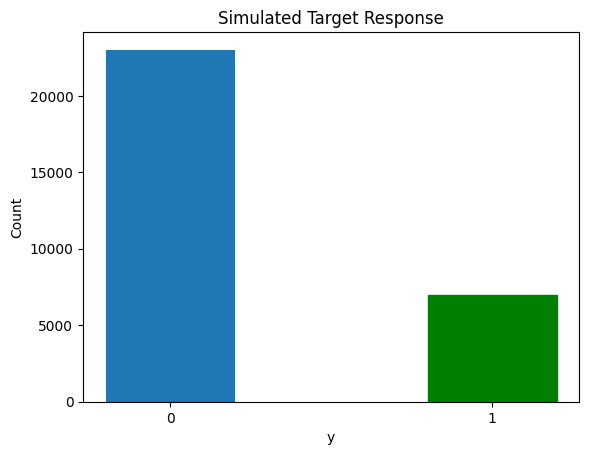

In [78]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Simulated Target Response")
plt.show()

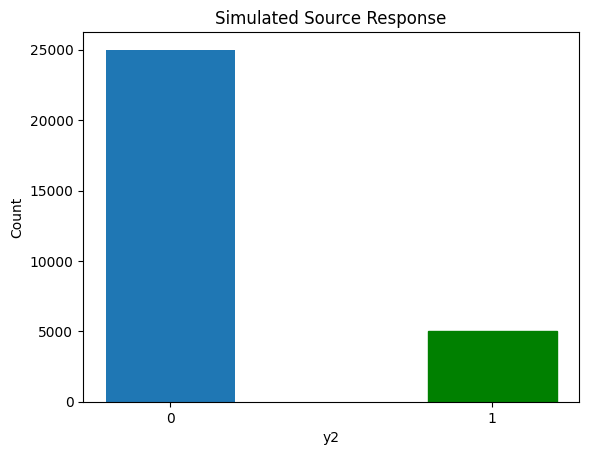

In [79]:
barlist = plt.bar([str(0),str(1)], y2.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Simulated Source Response")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:


In [80]:
data2.iloc[:,0].value_counts()

,count
0,
1.0,23310
0.0,6690


In [81]:
data_S = data2[data2[0] >= 0.5].reset_index(drop=True)  ## Source domain and classification - Men
data_S_X = data_S.iloc[:,:-2]
data_S_y = data_S.iloc[:, -1]

data_S_full = pd.concat([data_S_X, data_S_y], axis=1)

data_T = data2[data2[0] < 0.5].reset_index(drop=True) ## Target domain and classification - Women

data_T_X = data_T.iloc[:,:-2]
data_T_y = data_T.iloc[:, -2]    ## Response variable of interest in Default

data_T_full = pd.concat([data_T_X, data_T_y], axis=1)

In [82]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [83]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y
0,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.35,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0
1,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.15,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.75,0.583333,0.476190,0.454545,0.476190,0.70,0.571429,0.291667,0.727273,0
3,0.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.000000,...,0.35,0.625000,0.523810,0.454545,0.619048,0.45,0.523810,0.833333,0.500000,0
4,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.65,0.416667,0.666667,0.636364,0.619048,0.65,0.333333,0.541667,0.409091,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6685,0.0,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,1.000000,...,0.50,0.500000,0.571429,0.545455,0.619048,0.45,0.571429,0.375000,0.500000,1
6686,0.0,1.0,0.0,1.0,1.0,0.5,0.5,0.0,0.666667,1.000000,...,0.50,0.458333,0.523810,0.500000,0.476190,0.30,0.476190,0.333333,0.681818,1
6687,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.60,0.416667,0.523810,0.500000,0.619048,0.40,0.523810,0.458333,0.363636,1
6688,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1


## Source domain and task labels:

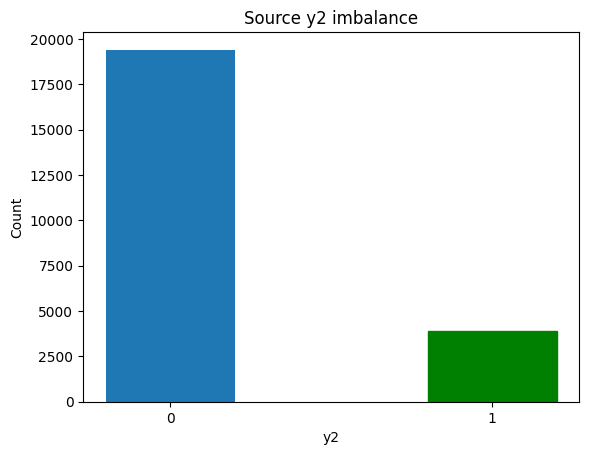

In [84]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Source y2 imbalance")
plt.show()

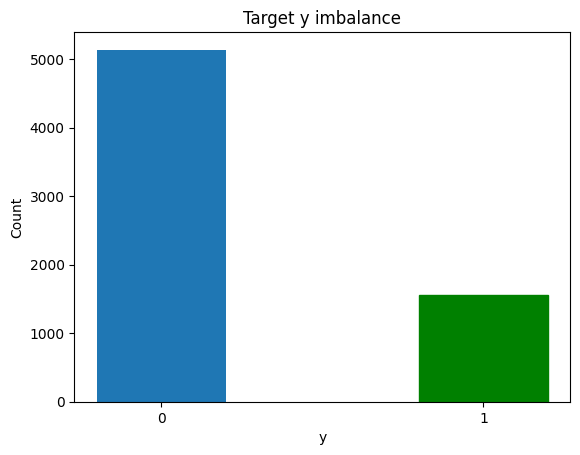

In [85]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target y imbalance")
plt.show()

## Updated Code (Modified from Shreya's code):

In [86]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [87]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [88]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [89]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [90]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy

## Oversampling functions:

In [91]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :-1]
    y_SRS = data_SRS_ROS.iloc[:, -1]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :-1]
    y_Sy = data_Sy_ROS.iloc[:, -1]

    return X_Sy, y_Sy



In [92]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

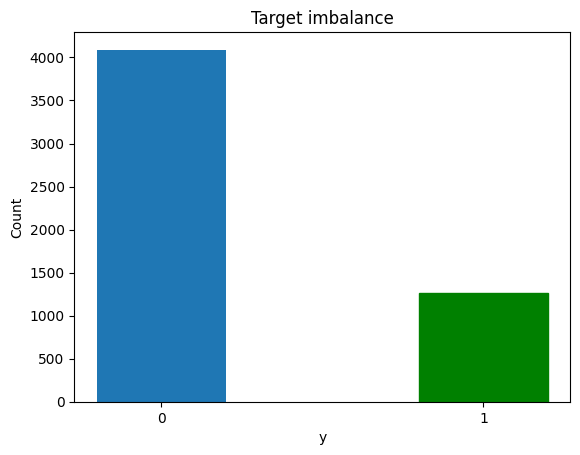

In [93]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target imbalance")
plt.show()

In [94]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (18648, 20)
y_S_train: (18648,)
X_S_test: (4662, 20)
y_S_test: (4662,)


# Original (Imbalanced) dataset:

## Standard Machine Learning:

In [33]:
model_source = create_dnn_model(X_S_train.shape[1])
train_and_evaluate_nosave(model_source, X_T_train, X_T_test, y_T_train, y_T_test, "Target")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - AUC: 0.4884 - loss: 0.5891 - val_AUC: 0.6266 - val_loss: 0.5492
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5867 - loss: 0.5502 - val_AUC: 0.7217 - val_loss: 0.5218
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7039 - loss: 0.5078 - val_AUC: 0.7490 - val_loss: 0.4614
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.4733 - val_AUC: 0.7514 - val_loss: 0.4668
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.4448 - val_AUC: 0.7586 - val_loss: 0.4381
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.4507 - val_AUC: 0.7617 - val_loss: 0.4459
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7673 - loss: 0.4368 - val_AUC: 0.7632 - val_loss: 0.4485
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4387 - val_AUC: 0.7684 - val_loss: 0.4420
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

(np.float64(0.027645376549094377), np.float64(0.6020761245674741))

## With Transfer Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - AUC: 0.6401 - loss: 0.4543 - val_AUC: 0.8646 - val_loss: 0.3200
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8708 - loss: 0.3019 - val_AUC: 0.9002 - val_loss: 0.2788
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9133 - loss: 0.2597 - val_AUC: 0.9217 - val_loss: 0.2494
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9224 - loss: 0.2409 - val_AUC: 0.9345 - val_loss: 0.2253
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9374 - loss: 0.2132 - val_AUC: 0.9516 - val_loss: 0.1947
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9485 - loss: 0.1975 - val_AUC: 0.9510 - val_loss: 0.1988
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9589 - loss: 0.1805 - val_AUC: 0.9591 - val_loss: 0.1796
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9611 - loss: 0.1730 - val_AUC: 0.9643 - val_loss: 0.1717
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

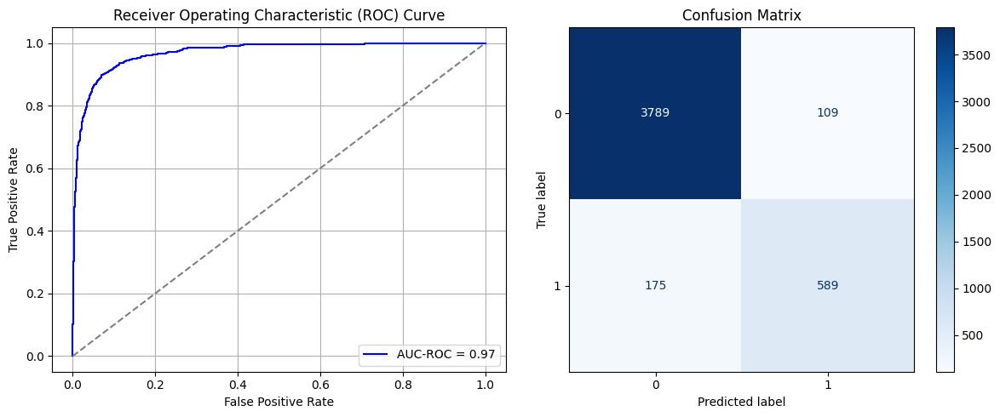

Best threshold based on F1-score: 0.36299803853034973
Time elapsed (performance): 26.18020414


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.7432 - loss: 0.5988 - val_AUC: 0.7311 - val_loss: 0.4903
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7513 - loss: 0.4628 - val_AUC: 0.7352 - val_loss: 0.4740
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.4627 - val_AUC: 0.7382 - val_loss: 0.4662
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.4551 - val_AUC: 0.7406 - val_loss: 0.4628
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7557 - loss: 0.4430 - val_AUC: 0.7441 - val_loss: 0.4580
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7499 - loss: 0.4552 - val_AUC: 0.7457 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7543 - loss: 0.4459 - val_AUC: 0.7463 - val_loss: 0.4585
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7702 - loss: 0.4353 - val_AUC: 0.7493 - val_loss: 0.4548
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7438 - loss: 0.5940 - val_AUC: 0.7302 - val_loss: 0.4904
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.4670 - val_AUC: 0.7359 - val_loss: 0.4722
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4483 - val_AUC: 0.7391 - val_loss: 0.4641
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7507 - loss: 0.4579 - val_AUC: 0.7421 - val_loss: 0.4609
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.4469 - val_AUC: 0.7451 - val_loss: 0.4577
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4483 - val_AUC: 0.7468 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7531 - loss: 0.4546 - val_AUC: 0.7468 - val_loss: 0.4663
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4538 - val_AUC: 0.7485 - val_loss: 0.4608
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7523 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7424 - loss: 0.5858 - val_AUC: 0.7300 - val_loss: 0.4920
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7318 - loss: 0.4764 - val_AUC: 0.7345 - val_loss: 0.4753
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.4659 - val_AUC: 0.7379 - val_loss: 0.4672
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7310 - loss: 0.4583 - val_AUC: 0.7414 - val_loss: 0.4626
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7600 - loss: 0.4392 - val_AUC: 0.7444 - val_loss: 0.4599
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7582 - loss: 0.4526 - val_AUC: 0.7454 - val_loss: 0.4566
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.4625 - val_AUC: 0.7463 - val_loss: 0.4550
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7620 - loss: 0.4328 - val_AUC: 0.7478 - val_loss: 0.4544
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7248 - loss: 0.6209 - val_AUC: 0.7309 - val_loss: 0.4912
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7363 - loss: 0.4794 - val_AUC: 0.7346 - val_loss: 0.4776
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7439 - loss: 0.4610 - val_AUC: 0.7382 - val_loss: 0.4681
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.4637 - val_AUC: 0.7399 - val_loss: 0.4629
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7674 - loss: 0.4493 - val_AUC: 0.7426 - val_loss: 0.4626
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.4544 - val_AUC: 0.7449 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7529 - loss: 0.4555 - val_AUC: 0.7457 - val_loss: 0.4553
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7685 - loss: 0.4453 - val_AUC: 0.7480 - val_loss: 0.4544
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7569 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7476 - loss: 0.5786 - val_AUC: 0.7310 - val_loss: 0.4903
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7354 - loss: 0.4757 - val_AUC: 0.7362 - val_loss: 0.4727
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7530 - loss: 0.4640 - val_AUC: 0.7385 - val_loss: 0.4652
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7440 - loss: 0.4496 - val_AUC: 0.7402 - val_loss: 0.4639
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7567 - loss: 0.4432 - val_AUC: 0.7433 - val_loss: 0.4573
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.4564 - val_AUC: 0.7446 - val_loss: 0.4582
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.4396 - val_AUC: 0.7467 - val_loss: 0.4539
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.4532 - val_AUC: 0.7469 - val_loss: 0.4599
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7448

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7292 - loss: 0.6048 - val_AUC: 0.7281 - val_loss: 0.5042
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7327 - loss: 0.4752 - val_AUC: 0.7327 - val_loss: 0.4769
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7559 - loss: 0.4608 - val_AUC: 0.7361 - val_loss: 0.4750
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7447 - loss: 0.4763 - val_AUC: 0.7398 - val_loss: 0.4631
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7658 - loss: 0.4442 - val_AUC: 0.7433 - val_loss: 0.4583
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7627 - loss: 0.4528 - val_AUC: 0.7451 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7605 - loss: 0.4368 - val_AUC: 0.7457 - val_loss: 0.4542
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.4449 - val_AUC: 0.7461 - val_loss: 0.4668
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7572 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7251 - loss: 0.6312 - val_AUC: 0.7307 - val_loss: 0.4925
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.4589 - val_AUC: 0.7335 - val_loss: 0.4781
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7493 - loss: 0.4684 - val_AUC: 0.7380 - val_loss: 0.4670
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.4629 - val_AUC: 0.7410 - val_loss: 0.4615
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7578 - loss: 0.4568 - val_AUC: 0.7425 - val_loss: 0.4624
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.4749 - val_AUC: 0.7422 - val_loss: 0.4768
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7477 - loss: 0.4526 - val_AUC: 0.7473 - val_loss: 0.4542
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7578 - loss: 0.4397 - val_AUC: 0.7472 - val_loss: 0.4532
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7568 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7373 - loss: 0.6232 - val_AUC: 0.7302 - val_loss: 0.4926
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 - loss: 0.4513 - val_AUC: 0.7342 - val_loss: 0.4758
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.4495 - val_AUC: 0.7394 - val_loss: 0.4668
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7393 - loss: 0.4628 - val_AUC: 0.7424 - val_loss: 0.4613
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7466 - loss: 0.4603 - val_AUC: 0.7442 - val_loss: 0.4589
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4497 - val_AUC: 0.7450 - val_loss: 0.4558
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.4618 - val_AUC: 0.7473 - val_loss: 0.4539
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7568 - loss: 0.4347 - val_AUC: 0.7522 - val_loss: 0.4574
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7728 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7311 - loss: 0.5980 - val_AUC: 0.7302 - val_loss: 0.4936
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7348 - loss: 0.4743 - val_AUC: 0.7323 - val_loss: 0.4805
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.4568 - val_AUC: 0.7363 - val_loss: 0.4715
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4525 - val_AUC: 0.7398 - val_loss: 0.4623
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7495 - loss: 0.4470 - val_AUC: 0.7420 - val_loss: 0.4592
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.4628 - val_AUC: 0.7429 - val_loss: 0.4656
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7510 - loss: 0.4587 - val_AUC: 0.7443 - val_loss: 0.4571
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.4542 - val_AUC: 0.7468 - val_loss: 0.4543
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7710 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7367 - loss: 0.6159 - val_AUC: 0.7303 - val_loss: 0.4924
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7386 - loss: 0.4786 - val_AUC: 0.7363 - val_loss: 0.4726
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.4505 - val_AUC: 0.7386 - val_loss: 0.4649
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.4646 - val_AUC: 0.7391 - val_loss: 0.4720
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.4417 - val_AUC: 0.7426 - val_loss: 0.4650
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7700 - loss: 0.4435 - val_AUC: 0.7461 - val_loss: 0.4554
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7559 - loss: 0.4461 - val_AUC: 0.7471 - val_loss: 0.4547
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7472 - loss: 0.4514 - val_AUC: 0.7469 - val_loss: 0.4562
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7629 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7448 - loss: 0.5997 - val_AUC: 0.7297 - val_loss: 0.4942
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.4766 - val_AUC: 0.7331 - val_loss: 0.4778
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7562 - loss: 0.4469 - val_AUC: 0.7380 - val_loss: 0.4676
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.4540 - val_AUC: 0.7406 - val_loss: 0.4621
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.4570 - val_AUC: 0.7427 - val_loss: 0.4595
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7542 - loss: 0.4464 - val_AUC: 0.7455 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7604 - loss: 0.4496 - val_AUC: 0.7463 - val_loss: 0.4552
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.4469 - val_AUC: 0.7476 - val_loss: 0.4531
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7343 - loss: 0.6059 - val_AUC: 0.7308 - val_loss: 0.4931
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7559 - loss: 0.4716 - val_AUC: 0.7334 - val_loss: 0.4806
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4613 - val_AUC: 0.7369 - val_loss: 0.4738
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7427 - loss: 0.4551 - val_AUC: 0.7399 - val_loss: 0.4667
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7528 - loss: 0.4472 - val_AUC: 0.7442 - val_loss: 0.4580
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.4586 - val_AUC: 0.7439 - val_loss: 0.4662
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7330 - loss: 0.4572 - val_AUC: 0.7462 - val_loss: 0.4543
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7512 - loss: 0.4416 - val_AUC: 0.7476 - val_loss: 0.4563
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7271 - loss: 0.6136 - val_AUC: 0.7306 - val_loss: 0.4922
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7486 - loss: 0.4616 - val_AUC: 0.7337 - val_loss: 0.4758
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7538 - loss: 0.4677 - val_AUC: 0.7371 - val_loss: 0.4680
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7533 - loss: 0.4460 - val_AUC: 0.7419 - val_loss: 0.4621
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7328 - loss: 0.4600 - val_AUC: 0.7429 - val_loss: 0.4588
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.4625 - val_AUC: 0.7430 - val_loss: 0.4650
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.4610 - val_AUC: 0.7469 - val_loss: 0.4561
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7573 - loss: 0.4471 - val_AUC: 0.7479 - val_loss: 0.4529
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7407 - loss: 0.6070 - val_AUC: 0.7305 - val_loss: 0.4929
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7539 - loss: 0.4614 - val_AUC: 0.7346 - val_loss: 0.4773
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7464 - loss: 0.4650 - val_AUC: 0.7359 - val_loss: 0.4717
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7437 - loss: 0.4662 - val_AUC: 0.7406 - val_loss: 0.4630
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4591 - val_AUC: 0.7435 - val_loss: 0.4586
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7383 - loss: 0.4577 - val_AUC: 0.7449 - val_loss: 0.4588
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.4599 - val_AUC: 0.7467 - val_loss: 0.4554
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.4586 - val_AUC: 0.7488 - val_loss: 0.4535
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.7289 - loss: 0.6258 - val_AUC: 0.7308 - val_loss: 0.4902
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7335 - loss: 0.4850 - val_AUC: 0.7346 - val_loss: 0.4740
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7350 - loss: 0.4747 - val_AUC: 0.7387 - val_loss: 0.4654
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.4508 - val_AUC: 0.7422 - val_loss: 0.4603
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7727 - loss: 0.4364 - val_AUC: 0.7428 - val_loss: 0.4620
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7476 - loss: 0.4495 - val_AUC: 0.7458 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 - loss: 0.4455 - val_AUC: 0.7472 - val_loss: 0.4533
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7699 - loss: 0.4440 - val_AUC: 0.7471 - val_loss: 0.4568
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7537 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - AUC: 0.7270 - loss: 0.6081 - val_AUC: 0.7304 - val_loss: 0.4919
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7435 - loss: 0.4649 - val_AUC: 0.7343 - val_loss: 0.4760
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7564 - loss: 0.4546 - val_AUC: 0.7381 - val_loss: 0.4683
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.4635 - val_AUC: 0.7395 - val_loss: 0.4638
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7443 - loss: 0.4642 - val_AUC: 0.7421 - val_loss: 0.4600
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7614 - loss: 0.4442 - val_AUC: 0.7450 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7613 - loss: 0.4482 - val_AUC: 0.7469 - val_loss: 0.4552
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7585 - loss: 0.4355 - val_AUC: 0.7474 - val_loss: 0.4533
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.7355 - loss: 0.6106 - val_AUC: 0.7304 - val_loss: 0.4935
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7422 - loss: 0.4681 - val_AUC: 0.7364 - val_loss: 0.4806
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7418 - loss: 0.4514 - val_AUC: 0.7387 - val_loss: 0.4664
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.4621 - val_AUC: 0.7410 - val_loss: 0.4640
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7565 - loss: 0.4473 - val_AUC: 0.7441 - val_loss: 0.4588
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7531 - loss: 0.4526 - val_AUC: 0.7454 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.4545 - val_AUC: 0.7456 - val_loss: 0.4617
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.4465 - val_AUC: 0.7475 - val_loss: 0.4597
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7588 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.7260 - loss: 0.5944 - val_AUC: 0.7300 - val_loss: 0.4928
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4731 - val_AUC: 0.7329 - val_loss: 0.4781
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7368 - loss: 0.4783 - val_AUC: 0.7371 - val_loss: 0.4675
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7322 - loss: 0.4669 - val_AUC: 0.7408 - val_loss: 0.4616
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7419 - loss: 0.4600 - val_AUC: 0.7425 - val_loss: 0.4592
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.4390 - val_AUC: 0.7448 - val_loss: 0.4603
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7710 - loss: 0.4373 - val_AUC: 0.7476 - val_loss: 0.4550
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7633 - loss: 0.4526 - val_AUC: 0.7470 - val_loss: 0.4535
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7306 - loss: 0.6117 - val_AUC: 0.7301 - val_loss: 0.4916
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.4897 - val_AUC: 0.7335 - val_loss: 0.4761
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7595 - loss: 0.4513 - val_AUC: 0.7380 - val_loss: 0.4669
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7389 - loss: 0.4733 - val_AUC: 0.7394 - val_loss: 0.4668
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7348 - loss: 0.4650 - val_AUC: 0.7419 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.4683 - val_AUC: 0.7448 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7521 - loss: 0.4493 - val_AUC: 0.7463 - val_loss: 0.4543
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.4425 - val_AUC: 0.7469 - val_loss: 0.4532
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7504 - loss: 0.5815 - val_AUC: 0.7295 - val_loss: 0.4934
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7389 - loss: 0.4625 - val_AUC: 0.7340 - val_loss: 0.4763
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.4706 - val_AUC: 0.7371 - val_loss: 0.4688
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.4458 - val_AUC: 0.7422 - val_loss: 0.4627
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.4500 - val_AUC: 0.7424 - val_loss: 0.4595
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.4476 - val_AUC: 0.7439 - val_loss: 0.4599
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4492 - val_AUC: 0.7456 - val_loss: 0.4578
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7698 - loss: 0.4352 - val_AUC: 0.7469 - val_loss: 0.4538
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7680 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.6813 - loss: 0.4177 - val_AUC: 0.8828 - val_loss: 0.3076
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8717 - loss: 0.3013 - val_AUC: 0.9095 - val_loss: 0.2847
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9217 - loss: 0.2458 - val_AUC: 0.9307 - val_loss: 0.2588
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9374 - loss: 0.2237 - val_AUC: 0.9413 - val_loss: 0.2153
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9475 - loss: 0.2016 - val_AUC: 0.9412 - val_loss: 0.2185
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9538 - loss: 0.1901 - val_AUC: 0.9624 - val_loss: 0.1773
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9615 - loss: 0.1769 - val_AUC: 0.9681 - val_loss: 0.1661
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9641 - loss: 0.1669 - val_AUC: 0.9637 - val_loss: 0.2083
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

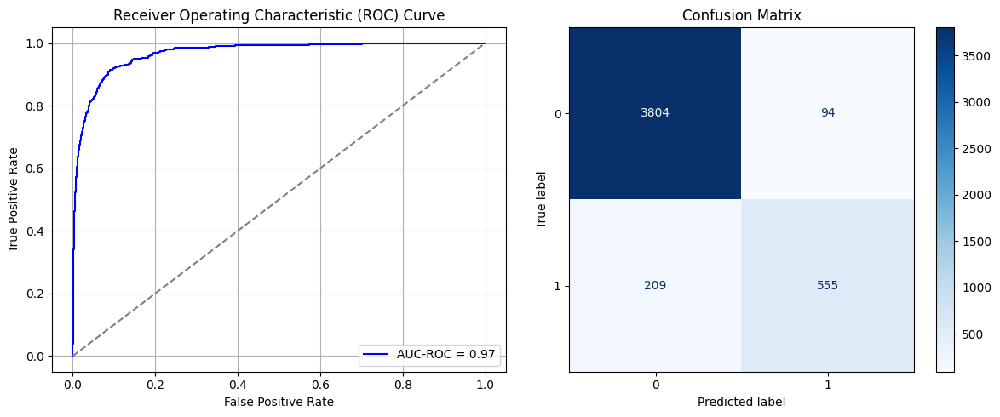

Best threshold based on F1-score: 0.32486692070961
Time elapsed (performance): 24.329600115000005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6937 - loss: 0.6520 - val_AUC: 0.7125 - val_loss: 0.4978
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.4842 - val_AUC: 0.7224 - val_loss: 0.4859
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.4691 - val_AUC: 0.7285 - val_loss: 0.4825
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.4812 - val_AUC: 0.7338 - val_loss: 0.4790
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 - loss: 0.4564 - val_AUC: 0.7432 - val_loss: 0.4729
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.4540 - val_AUC: 0.7460 - val_loss: 0.4708
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4589 - val_AUC: 0.7516 - val_loss: 0.4665
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7418 - loss: 0.4635 - val_AUC: 0.7567 - val_loss: 0.4653
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6975 - loss: 0.6721 - val_AUC: 0.7126 - val_loss: 0.4991
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7295 - loss: 0.4760 - val_AUC: 0.7231 - val_loss: 0.4858
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.4751 - val_AUC: 0.7289 - val_loss: 0.4834
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7354 - loss: 0.4726 - val_AUC: 0.7383 - val_loss: 0.4769
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7163 - loss: 0.4820 - val_AUC: 0.7441 - val_loss: 0.4733
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7339 - loss: 0.4736 - val_AUC: 0.7430 - val_loss: 0.4769
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7366 - loss: 0.4767 - val_AUC: 0.7511 - val_loss: 0.4674
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7685 - loss: 0.4494 - val_AUC: 0.7590 - val_loss: 0.4706
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7467 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6945 - loss: 0.6877 - val_AUC: 0.7127 - val_loss: 0.5010
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7165 - loss: 0.4861 - val_AUC: 0.7238 - val_loss: 0.4875
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.4813 - val_AUC: 0.7301 - val_loss: 0.4806
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.4851 - val_AUC: 0.7325 - val_loss: 0.4819
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7308 - loss: 0.4666 - val_AUC: 0.7406 - val_loss: 0.4732
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.4684 - val_AUC: 0.7445 - val_loss: 0.4716
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.4484 - val_AUC: 0.7456 - val_loss: 0.4768
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4628 - val_AUC: 0.7588 - val_loss: 0.4735
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6821 - loss: 0.7299 - val_AUC: 0.7120 - val_loss: 0.5027
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7097 - loss: 0.4928 - val_AUC: 0.7215 - val_loss: 0.4870
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.4699 - val_AUC: 0.7263 - val_loss: 0.4844
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.4885 - val_AUC: 0.7344 - val_loss: 0.4771
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.4777 - val_AUC: 0.7386 - val_loss: 0.4751
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.4711 - val_AUC: 0.7447 - val_loss: 0.4711
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7387 - loss: 0.4691 - val_AUC: 0.7458 - val_loss: 0.4728
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7279 - loss: 0.4741 - val_AUC: 0.7553 - val_loss: 0.4660
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7564 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6797 - loss: 0.7134 - val_AUC: 0.7114 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.4953 - val_AUC: 0.7196 - val_loss: 0.4898
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.4840 - val_AUC: 0.7298 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7323 - loss: 0.4765 - val_AUC: 0.7360 - val_loss: 0.4771
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7190 - loss: 0.4755 - val_AUC: 0.7378 - val_loss: 0.4782
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.4786 - val_AUC: 0.7429 - val_loss: 0.4733
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4544 - val_AUC: 0.7501 - val_loss: 0.4681
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7491 - loss: 0.4615 - val_AUC: 0.7565 - val_loss: 0.4674
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7392 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6918 - loss: 0.7097 - val_AUC: 0.7137 - val_loss: 0.5038
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7285 - loss: 0.4825 - val_AUC: 0.7206 - val_loss: 0.4885
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.4796 - val_AUC: 0.7276 - val_loss: 0.4823
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.4714 - val_AUC: 0.7365 - val_loss: 0.4780
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.4678 - val_AUC: 0.7429 - val_loss: 0.4757
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.4710 - val_AUC: 0.7481 - val_loss: 0.4741
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4634 - val_AUC: 0.7500 - val_loss: 0.4682
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.4555 - val_AUC: 0.7533 - val_loss: 0.4653
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7610 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6965 - loss: 0.6788 - val_AUC: 0.7114 - val_loss: 0.5024
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.4856 - val_AUC: 0.7224 - val_loss: 0.4863
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7273 - loss: 0.4732 - val_AUC: 0.7301 - val_loss: 0.4808
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.4690 - val_AUC: 0.7359 - val_loss: 0.4770
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.4545 - val_AUC: 0.7397 - val_loss: 0.4742
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.4582 - val_AUC: 0.7458 - val_loss: 0.4705
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4558 - val_AUC: 0.7491 - val_loss: 0.4684
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7492 - loss: 0.4601 - val_AUC: 0.7558 - val_loss: 0.4651
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7538 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6890 - loss: 0.6835 - val_AUC: 0.7115 - val_loss: 0.5021
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.4859 - val_AUC: 0.7220 - val_loss: 0.4869
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.4752 - val_AUC: 0.7307 - val_loss: 0.4809
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7267 - loss: 0.4734 - val_AUC: 0.7340 - val_loss: 0.4792
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.4612 - val_AUC: 0.7415 - val_loss: 0.4745
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.4848 - val_AUC: 0.7436 - val_loss: 0.4718
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4678 - val_AUC: 0.7493 - val_loss: 0.4690
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.4589 - val_AUC: 0.7541 - val_loss: 0.4656
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7540 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6706 - loss: 0.7190 - val_AUC: 0.7121 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7050 - loss: 0.4773 - val_AUC: 0.7194 - val_loss: 0.4903
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7404 - loss: 0.4600 - val_AUC: 0.7289 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7219 - loss: 0.4809 - val_AUC: 0.7368 - val_loss: 0.4769
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.4779 - val_AUC: 0.7399 - val_loss: 0.4756
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.4556 - val_AUC: 0.7503 - val_loss: 0.4735
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.4579 - val_AUC: 0.7519 - val_loss: 0.4671
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7477 - loss: 0.4613 - val_AUC: 0.7545 - val_loss: 0.4654
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6928 - loss: 0.6873 - val_AUC: 0.7132 - val_loss: 0.5000
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7172 - loss: 0.4776 - val_AUC: 0.7214 - val_loss: 0.4881
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7048 - loss: 0.4939 - val_AUC: 0.7309 - val_loss: 0.4804
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4705 - val_AUC: 0.7346 - val_loss: 0.4780
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.4681 - val_AUC: 0.7382 - val_loss: 0.4761
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.4460 - val_AUC: 0.7447 - val_loss: 0.4714
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7590 - loss: 0.4532 - val_AUC: 0.7521 - val_loss: 0.4676
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.4645 - val_AUC: 0.7553 - val_loss: 0.4648
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6770 - loss: 0.7220 - val_AUC: 0.7123 - val_loss: 0.5023
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7091 - loss: 0.4868 - val_AUC: 0.7212 - val_loss: 0.4874
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7311 - loss: 0.4737 - val_AUC: 0.7283 - val_loss: 0.4822
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.4649 - val_AUC: 0.7351 - val_loss: 0.4779
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7348 - loss: 0.4618 - val_AUC: 0.7436 - val_loss: 0.4793
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.4636 - val_AUC: 0.7418 - val_loss: 0.4740
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.4560 - val_AUC: 0.7508 - val_loss: 0.4683
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.4467 - val_AUC: 0.7497 - val_loss: 0.4700
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6693 - loss: 0.7217 - val_AUC: 0.7109 - val_loss: 0.5015
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7243 - loss: 0.4857 - val_AUC: 0.7194 - val_loss: 0.4885
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7241 - loss: 0.4796 - val_AUC: 0.7236 - val_loss: 0.4910
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.4913 - val_AUC: 0.7319 - val_loss: 0.4806
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.4758 - val_AUC: 0.7405 - val_loss: 0.4741
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7512 - loss: 0.4690 - val_AUC: 0.7441 - val_loss: 0.4749
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4730 - val_AUC: 0.7497 - val_loss: 0.4672
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.4650 - val_AUC: 0.7567 - val_loss: 0.4667
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7420 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6822 - loss: 0.7087 - val_AUC: 0.7124 - val_loss: 0.5010
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.4830 - val_AUC: 0.7215 - val_loss: 0.4869
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7222 - loss: 0.4831 - val_AUC: 0.7275 - val_loss: 0.4850
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7275 - loss: 0.4794 - val_AUC: 0.7374 - val_loss: 0.4772
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7322 - loss: 0.4655 - val_AUC: 0.7365 - val_loss: 0.4788
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.4609 - val_AUC: 0.7469 - val_loss: 0.4701
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7561 - loss: 0.4578 - val_AUC: 0.7496 - val_loss: 0.4709
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.4675 - val_AUC: 0.7545 - val_loss: 0.4645
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7546 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6761 - loss: 0.6976 - val_AUC: 0.7116 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7154 - loss: 0.4879 - val_AUC: 0.7235 - val_loss: 0.4867
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.4841 - val_AUC: 0.7272 - val_loss: 0.4854
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7461 - loss: 0.4646 - val_AUC: 0.7377 - val_loss: 0.4770
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7279 - loss: 0.4796 - val_AUC: 0.7375 - val_loss: 0.4805
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.4773 - val_AUC: 0.7453 - val_loss: 0.4709
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7694 - loss: 0.4486 - val_AUC: 0.7539 - val_loss: 0.4702
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7521 - loss: 0.4508 - val_AUC: 0.7511 - val_loss: 0.4651
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6863 - loss: 0.6897 - val_AUC: 0.7126 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.4770 - val_AUC: 0.7246 - val_loss: 0.4879
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7167 - loss: 0.4696 - val_AUC: 0.7309 - val_loss: 0.4806
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7326 - loss: 0.4699 - val_AUC: 0.7331 - val_loss: 0.4786
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.4552 - val_AUC: 0.7436 - val_loss: 0.4754
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7293 - loss: 0.4703 - val_AUC: 0.7438 - val_loss: 0.4757
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7368 - loss: 0.4710 - val_AUC: 0.7514 - val_loss: 0.4684
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4616 - val_AUC: 0.7479 - val_loss: 0.4797
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6656 - loss: 0.7649 - val_AUC: 0.7106 - val_loss: 0.5074
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7004 - loss: 0.5005 - val_AUC: 0.7222 - val_loss: 0.4870
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7247 - loss: 0.4685 - val_AUC: 0.7278 - val_loss: 0.4817
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.4624 - val_AUC: 0.7370 - val_loss: 0.4773
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.4618 - val_AUC: 0.7437 - val_loss: 0.4760
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7519 - loss: 0.4582 - val_AUC: 0.7436 - val_loss: 0.4752
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7411 - loss: 0.4688 - val_AUC: 0.7481 - val_loss: 0.4699
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7450 - loss: 0.4635 - val_AUC: 0.7534 - val_loss: 0.4647
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6979 - loss: 0.6616 - val_AUC: 0.7118 - val_loss: 0.4998
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7167 - loss: 0.4864 - val_AUC: 0.7196 - val_loss: 0.4899
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.4651 - val_AUC: 0.7306 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.4811 - val_AUC: 0.7370 - val_loss: 0.4768
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.4589 - val_AUC: 0.7427 - val_loss: 0.4737
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4671 - val_AUC: 0.7478 - val_loss: 0.4702
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.4686 - val_AUC: 0.7507 - val_loss: 0.4692
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.4422 - val_AUC: 0.7556 - val_loss: 0.4636
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6877 - loss: 0.7128 - val_AUC: 0.7115 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7282 - loss: 0.4711 - val_AUC: 0.7192 - val_loss: 0.4890
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.4709 - val_AUC: 0.7270 - val_loss: 0.4834
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.4673 - val_AUC: 0.7341 - val_loss: 0.4778
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.4672 - val_AUC: 0.7392 - val_loss: 0.4746
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4779 - val_AUC: 0.7454 - val_loss: 0.4718
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4649 - val_AUC: 0.7492 - val_loss: 0.4686
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7394 - loss: 0.4618 - val_AUC: 0.7550 - val_loss: 0.4660
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6949 - loss: 0.6941 - val_AUC: 0.7138 - val_loss: 0.5012
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6993 - loss: 0.5059 - val_AUC: 0.7214 - val_loss: 0.4868
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.4835 - val_AUC: 0.7265 - val_loss: 0.4877
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7064 - loss: 0.4878 - val_AUC: 0.7367 - val_loss: 0.4766
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7361 - loss: 0.4730 - val_AUC: 0.7421 - val_loss: 0.4732
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7576 - loss: 0.4525 - val_AUC: 0.7475 - val_loss: 0.4698
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7502 - loss: 0.4509 - val_AUC: 0.7527 - val_loss: 0.4690
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7391 - loss: 0.4658 - val_AUC: 0.7517 - val_loss: 0.4659
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6832 - loss: 0.7372 - val_AUC: 0.7115 - val_loss: 0.5032
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7155 - loss: 0.4917 - val_AUC: 0.7182 - val_loss: 0.4944
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.4719 - val_AUC: 0.7299 - val_loss: 0.4805
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.4724 - val_AUC: 0.7374 - val_loss: 0.4774
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7275 - loss: 0.4742 - val_AUC: 0.7427 - val_loss: 0.4730
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.4642 - val_AUC: 0.7504 - val_loss: 0.4721
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7585 - loss: 0.4613 - val_AUC: 0.7521 - val_loss: 0.4672
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7617 - loss: 0.4477 - val_AUC: 0.7539 - val_loss: 0.4646
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7576 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6478 - loss: 0.4420 - val_AUC: 0.8631 - val_loss: 0.3158
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8622 - loss: 0.3146 - val_AUC: 0.9002 - val_loss: 0.2942
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9015 - loss: 0.2701 - val_AUC: 0.9220 - val_loss: 0.2451
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9208 - loss: 0.2447 - val_AUC: 0.9373 - val_loss: 0.2233
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9398 - loss: 0.2198 - val_AUC: 0.9467 - val_loss: 0.2045
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9483 - loss: 0.1970 - val_AUC: 0.9545 - val_loss: 0.1881
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9431 - loss: 0.2091 - val_AUC: 0.9536 - val_loss: 0.2239
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9563 - loss: 0.1864 - val_AUC: 0.9590 - val_loss: 0.1779
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

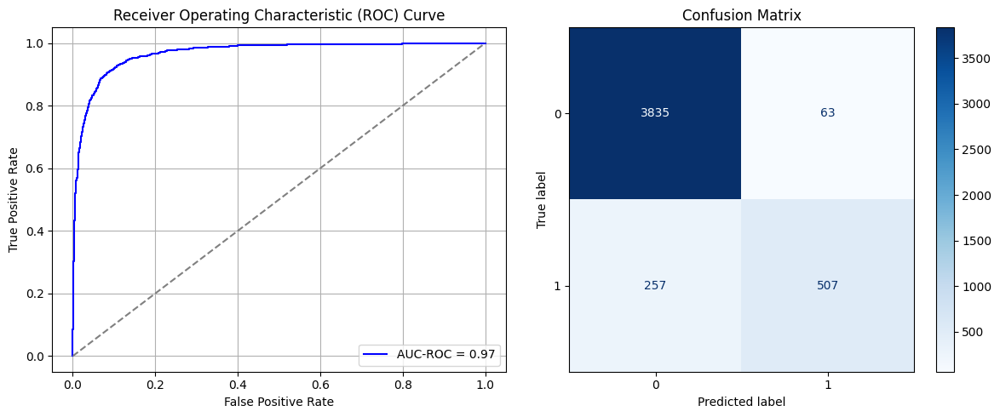

Best threshold based on F1-score: 0.2578410804271698
Time elapsed (performance): 26.840896804999943


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6642 - loss: 0.6154 - val_AUC: 0.6901 - val_loss: 0.5006
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6789 - loss: 0.4935 - val_AUC: 0.6964 - val_loss: 0.4953
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7051 - loss: 0.4754 - val_AUC: 0.7071 - val_loss: 0.4924
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6978 - loss: 0.4972 - val_AUC: 0.7098 - val_loss: 0.4920
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.4940 - val_AUC: 0.7176 - val_loss: 0.4869
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.4748 - val_AUC: 0.7239 - val_loss: 0.4872
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.4803 - val_AUC: 0.7309 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.4666 - val_AUC: 0.7329 - val_loss: 0.4830
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6625 - loss: 0.6069 - val_AUC: 0.6892 - val_loss: 0.5029
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6870 - loss: 0.4992 - val_AUC: 0.6966 - val_loss: 0.4954
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6894 - loss: 0.4955 - val_AUC: 0.7033 - val_loss: 0.4933
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 - loss: 0.4855 - val_AUC: 0.7127 - val_loss: 0.4894
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6934 - loss: 0.4973 - val_AUC: 0.7210 - val_loss: 0.4870
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 - loss: 0.4803 - val_AUC: 0.7262 - val_loss: 0.4860
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.4894 - val_AUC: 0.7321 - val_loss: 0.4860
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.4682 - val_AUC: 0.7329 - val_loss: 0.4807
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7192 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6705 - loss: 0.6105 - val_AUC: 0.6895 - val_loss: 0.5017
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6797 - loss: 0.4986 - val_AUC: 0.6995 - val_loss: 0.4937
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6813 - loss: 0.5013 - val_AUC: 0.7065 - val_loss: 0.4898
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.4869 - val_AUC: 0.7158 - val_loss: 0.4885
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6963 - loss: 0.4844 - val_AUC: 0.7200 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7104 - loss: 0.4818 - val_AUC: 0.7265 - val_loss: 0.4852
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.4875 - val_AUC: 0.7308 - val_loss: 0.4847
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7200 - loss: 0.4802 - val_AUC: 0.7370 - val_loss: 0.4828
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6840 - loss: 0.5881 - val_AUC: 0.6900 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6816 - loss: 0.4881 - val_AUC: 0.6987 - val_loss: 0.4940
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6965 - loss: 0.4913 - val_AUC: 0.7070 - val_loss: 0.4918
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.4949 - val_AUC: 0.7150 - val_loss: 0.4881
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6996 - loss: 0.4806 - val_AUC: 0.7223 - val_loss: 0.4864
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6992 - loss: 0.5033 - val_AUC: 0.7235 - val_loss: 0.4870
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7086 - loss: 0.4852 - val_AUC: 0.7285 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7253 - loss: 0.4820 - val_AUC: 0.7307 - val_loss: 0.4851
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7266 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6721 - loss: 0.6014 - val_AUC: 0.6896 - val_loss: 0.5017
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6780 - loss: 0.4976 - val_AUC: 0.6991 - val_loss: 0.4938
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6987 - loss: 0.4879 - val_AUC: 0.7075 - val_loss: 0.4899
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.4849 - val_AUC: 0.7138 - val_loss: 0.4899
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7044 - loss: 0.4958 - val_AUC: 0.7157 - val_loss: 0.4925
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7130 - loss: 0.4984 - val_AUC: 0.7244 - val_loss: 0.4873
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5013 - val_AUC: 0.7281 - val_loss: 0.4868
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7127 - loss: 0.4864 - val_AUC: 0.7379 - val_loss: 0.4831
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6695 - loss: 0.6192 - val_AUC: 0.6889 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6848 - loss: 0.4882 - val_AUC: 0.6951 - val_loss: 0.4956
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6802 - loss: 0.4843 - val_AUC: 0.7022 - val_loss: 0.4924
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6992 - loss: 0.4910 - val_AUC: 0.7091 - val_loss: 0.4906
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6875 - loss: 0.4914 - val_AUC: 0.7150 - val_loss: 0.4883
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6878 - loss: 0.4816 - val_AUC: 0.7233 - val_loss: 0.4852
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7062 - loss: 0.4929 - val_AUC: 0.7278 - val_loss: 0.4855
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.4912 - val_AUC: 0.7347 - val_loss: 0.4835
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7220 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6751 - loss: 0.5908 - val_AUC: 0.6888 - val_loss: 0.5031
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6798 - loss: 0.4935 - val_AUC: 0.6959 - val_loss: 0.4985
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6808 - loss: 0.5002 - val_AUC: 0.7032 - val_loss: 0.4920
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.4945 - val_AUC: 0.7112 - val_loss: 0.4902
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.4871 - val_AUC: 0.7203 - val_loss: 0.4866
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.4902 - val_AUC: 0.7301 - val_loss: 0.4848
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7305 - loss: 0.4772 - val_AUC: 0.7310 - val_loss: 0.4832
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7009 - loss: 0.4965 - val_AUC: 0.7323 - val_loss: 0.4814
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - AUC: 0.6657 - loss: 0.5981 - val_AUC: 0.6897 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6776 - loss: 0.5105 - val_AUC: 0.6961 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6915 - loss: 0.4891 - val_AUC: 0.7032 - val_loss: 0.4919
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.4769 - val_AUC: 0.7125 - val_loss: 0.4887
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.4948 - val_AUC: 0.7171 - val_loss: 0.4866
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6975 - loss: 0.4952 - val_AUC: 0.7238 - val_loss: 0.4845
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.4826 - val_AUC: 0.7312 - val_loss: 0.4829
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.4903 - val_AUC: 0.7289 - val_loss: 0.4895
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6654 - loss: 0.6001 - val_AUC: 0.6896 - val_loss: 0.5019
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6881 - loss: 0.4945 - val_AUC: 0.6981 - val_loss: 0.4986
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6943 - loss: 0.4952 - val_AUC: 0.7082 - val_loss: 0.4912
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7038 - loss: 0.4939 - val_AUC: 0.7167 - val_loss: 0.4890
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7000 - loss: 0.4948 - val_AUC: 0.7217 - val_loss: 0.4886
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.4813 - val_AUC: 0.7249 - val_loss: 0.4855
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7105 - loss: 0.4761 - val_AUC: 0.7321 - val_loss: 0.4849
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.4706 - val_AUC: 0.7354 - val_loss: 0.4819
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6712 - loss: 0.5985 - val_AUC: 0.6891 - val_loss: 0.5032
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7033 - loss: 0.4809 - val_AUC: 0.6960 - val_loss: 0.4961
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6817 - loss: 0.4881 - val_AUC: 0.7045 - val_loss: 0.4905
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6942 - loss: 0.4930 - val_AUC: 0.7129 - val_loss: 0.4887
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6981 - loss: 0.4866 - val_AUC: 0.7176 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7123 - loss: 0.4650 - val_AUC: 0.7290 - val_loss: 0.4882
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.4869 - val_AUC: 0.7285 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7224 - loss: 0.4865 - val_AUC: 0.7318 - val_loss: 0.4847
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7226 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6804 - loss: 0.5903 - val_AUC: 0.6894 - val_loss: 0.5029
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6762 - loss: 0.5074 - val_AUC: 0.6963 - val_loss: 0.4962
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7086 - loss: 0.4744 - val_AUC: 0.7042 - val_loss: 0.4931
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7167 - loss: 0.4725 - val_AUC: 0.7115 - val_loss: 0.4893
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7100 - loss: 0.4831 - val_AUC: 0.7224 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7199 - loss: 0.4747 - val_AUC: 0.7271 - val_loss: 0.4873
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.4952 - val_AUC: 0.7291 - val_loss: 0.4843
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.4665 - val_AUC: 0.7390 - val_loss: 0.4832
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6684 - loss: 0.6206 - val_AUC: 0.6887 - val_loss: 0.5031
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6881 - loss: 0.4941 - val_AUC: 0.6959 - val_loss: 0.4961
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.4965 - val_AUC: 0.7032 - val_loss: 0.4921
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6976 - loss: 0.4971 - val_AUC: 0.7099 - val_loss: 0.4894
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6986 - loss: 0.4735 - val_AUC: 0.7181 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6915 - loss: 0.4896 - val_AUC: 0.7245 - val_loss: 0.4850
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7027 - loss: 0.4963 - val_AUC: 0.7252 - val_loss: 0.4850
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.4970 - val_AUC: 0.7332 - val_loss: 0.4853
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6817 - loss: 0.5796 - val_AUC: 0.6889 - val_loss: 0.5033
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6765 - loss: 0.4915 - val_AUC: 0.6960 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7102 - loss: 0.4942 - val_AUC: 0.7030 - val_loss: 0.4932
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.4804 - val_AUC: 0.7118 - val_loss: 0.4884
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6784 - loss: 0.4985 - val_AUC: 0.7177 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.4718 - val_AUC: 0.7214 - val_loss: 0.4875
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7282 - loss: 0.4821 - val_AUC: 0.7267 - val_loss: 0.4868
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.4775 - val_AUC: 0.7306 - val_loss: 0.4846
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6635 - loss: 0.5977 - val_AUC: 0.6893 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7049 - loss: 0.4854 - val_AUC: 0.6964 - val_loss: 0.4974
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6777 - loss: 0.4992 - val_AUC: 0.7034 - val_loss: 0.4923
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6963 - loss: 0.4928 - val_AUC: 0.7110 - val_loss: 0.4880
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7031 - loss: 0.4859 - val_AUC: 0.7199 - val_loss: 0.4869
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7084 - loss: 0.4827 - val_AUC: 0.7272 - val_loss: 0.4858
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.4775 - val_AUC: 0.7288 - val_loss: 0.4863
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7240 - loss: 0.4768 - val_AUC: 0.7321 - val_loss: 0.4850
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.6649 - loss: 0.6433 - val_AUC: 0.6889 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6578 - loss: 0.5243 - val_AUC: 0.6955 - val_loss: 0.4958
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6856 - loss: 0.4896 - val_AUC: 0.7033 - val_loss: 0.4912
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6873 - loss: 0.4970 - val_AUC: 0.7092 - val_loss: 0.4892
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.4783 - val_AUC: 0.7168 - val_loss: 0.4888
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6969 - loss: 0.4903 - val_AUC: 0.7215 - val_loss: 0.4882
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7118 - loss: 0.4740 - val_AUC: 0.7275 - val_loss: 0.4843
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7145 - loss: 0.4864 - val_AUC: 0.7313 - val_loss: 0.4819
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6685 - loss: 0.6236 - val_AUC: 0.6895 - val_loss: 0.5026
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6832 - loss: 0.5017 - val_AUC: 0.6981 - val_loss: 0.4938
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6896 - loss: 0.4826 - val_AUC: 0.7066 - val_loss: 0.4917
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7023 - loss: 0.4910 - val_AUC: 0.7125 - val_loss: 0.4900
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6993 - loss: 0.4831 - val_AUC: 0.7258 - val_loss: 0.4873
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.4842 - val_AUC: 0.7258 - val_loss: 0.4866
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.4869 - val_AUC: 0.7338 - val_loss: 0.4851
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4802 - val_AUC: 0.7334 - val_loss: 0.4821
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6645 - loss: 0.6314 - val_AUC: 0.6889 - val_loss: 0.5040
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6849 - loss: 0.4943 - val_AUC: 0.6950 - val_loss: 0.4960
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6881 - loss: 0.4928 - val_AUC: 0.7015 - val_loss: 0.4953
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6853 - loss: 0.4969 - val_AUC: 0.7101 - val_loss: 0.4886
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.4874 - val_AUC: 0.7174 - val_loss: 0.4870
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.4858 - val_AUC: 0.7245 - val_loss: 0.4860
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6949 - loss: 0.4868 - val_AUC: 0.7262 - val_loss: 0.4834
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.4719 - val_AUC: 0.7349 - val_loss: 0.4855
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6691 - loss: 0.5840 - val_AUC: 0.6893 - val_loss: 0.5022
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6871 - loss: 0.4885 - val_AUC: 0.6979 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7058 - loss: 0.4713 - val_AUC: 0.7068 - val_loss: 0.4911
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6851 - loss: 0.4956 - val_AUC: 0.7125 - val_loss: 0.4874
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7047 - loss: 0.4851 - val_AUC: 0.7198 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7087 - loss: 0.4782 - val_AUC: 0.7283 - val_loss: 0.4864
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.4867 - val_AUC: 0.7323 - val_loss: 0.4856
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7155 - loss: 0.4861 - val_AUC: 0.7269 - val_loss: 0.4904
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6984 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6764 - loss: 0.5823 - val_AUC: 0.6889 - val_loss: 0.5024
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.4760 - val_AUC: 0.6961 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6872 - loss: 0.4920 - val_AUC: 0.7025 - val_loss: 0.4926
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6977 - loss: 0.4811 - val_AUC: 0.7108 - val_loss: 0.4903
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7085 - loss: 0.4789 - val_AUC: 0.7157 - val_loss: 0.4876
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.4740 - val_AUC: 0.7243 - val_loss: 0.4874
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.4814 - val_AUC: 0.7284 - val_loss: 0.4837
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.4891 - val_AUC: 0.7330 - val_loss: 0.4824
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6750 - loss: 0.6030 - val_AUC: 0.6895 - val_loss: 0.5025
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6910 - loss: 0.4887 - val_AUC: 0.6989 - val_loss: 0.4945
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6962 - loss: 0.4937 - val_AUC: 0.7066 - val_loss: 0.4898
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7009 - loss: 0.5032 - val_AUC: 0.7113 - val_loss: 0.4899
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7185 - loss: 0.4742 - val_AUC: 0.7251 - val_loss: 0.4886
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4829 - val_AUC: 0.7252 - val_loss: 0.4847
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.4861 - val_AUC: 0.7295 - val_loss: 0.4838
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.4631 - val_AUC: 0.7313 - val_loss: 0.4840
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.5944 - loss: 0.4707 - val_AUC: 0.8493 - val_loss: 0.3330
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8558 - loss: 0.3140 - val_AUC: 0.9075 - val_loss: 0.2630
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9063 - loss: 0.2614 - val_AUC: 0.9293 - val_loss: 0.2395
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9332 - loss: 0.2226 - val_AUC: 0.9374 - val_loss: 0.2327
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9409 - loss: 0.2127 - val_AUC: 0.9510 - val_loss: 0.1953
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9579 - loss: 0.1842 - val_AUC: 0.9557 - val_loss: 0.1938
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9574 - loss: 0.1871 - val_AUC: 0.9575 - val_loss: 0.1830
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9603 - loss: 0.1793 - val_AUC: 0.9588 - val_loss: 0.1993
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

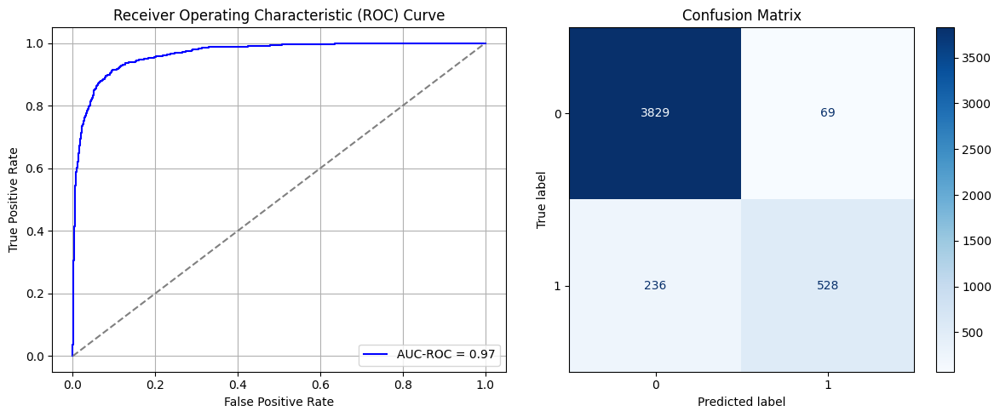

Best threshold based on F1-score: 0.25378477573394775
Time elapsed (performance): 30.048652494999942


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - AUC: 0.6849 - loss: 0.5728 - val_AUC: 0.7320 - val_loss: 0.4766
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.4562 - val_AUC: 0.7522 - val_loss: 0.4587
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4621 - val_AUC: 0.7585 - val_loss: 0.4513
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7520 - loss: 0.4483 - val_AUC: 0.7578 - val_loss: 0.4514
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7682 - loss: 0.4311 - val_AUC: 0.7597 - val_loss: 0.4474
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4499 - val_AUC: 0.7596 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4462 - val_AUC: 0.7622 - val_loss: 0.4417
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.4504 - val_AUC: 0.7614 - val_loss: 0.4437
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.6920 - loss: 0.5508 - val_AUC: 0.7314 - val_loss: 0.4765
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7506 - loss: 0.4580 - val_AUC: 0.7497 - val_loss: 0.4598
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.4510 - val_AUC: 0.7532 - val_loss: 0.4542
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.4527 - val_AUC: 0.7582 - val_loss: 0.4490
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.4507 - val_AUC: 0.7576 - val_loss: 0.4471
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7657 - loss: 0.4463 - val_AUC: 0.7597 - val_loss: 0.4444
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 - loss: 0.4438 - val_AUC: 0.7614 - val_loss: 0.4408
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.4461 - val_AUC: 0.7608 - val_loss: 0.4406
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7492 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7072 - loss: 0.5435 - val_AUC: 0.7262 - val_loss: 0.4828
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7243 - loss: 0.4771 - val_AUC: 0.7518 - val_loss: 0.4592
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7700 - loss: 0.4412 - val_AUC: 0.7580 - val_loss: 0.4515
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7617 - loss: 0.4415 - val_AUC: 0.7610 - val_loss: 0.4480
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7622 - loss: 0.4432 - val_AUC: 0.7602 - val_loss: 0.4456
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7483 - loss: 0.4501 - val_AUC: 0.7627 - val_loss: 0.4431
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7700 - loss: 0.4413 - val_AUC: 0.7619 - val_loss: 0.4411
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7632 - loss: 0.4276 - val_AUC: 0.7604 - val_loss: 0.4417
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7626 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7098 - loss: 0.5280 - val_AUC: 0.7330 - val_loss: 0.4738
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7429 - loss: 0.4619 - val_AUC: 0.7505 - val_loss: 0.4581
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.4485 - val_AUC: 0.7537 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4623 - val_AUC: 0.7566 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.4412 - val_AUC: 0.7584 - val_loss: 0.4457
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7490 - loss: 0.4454 - val_AUC: 0.7592 - val_loss: 0.4466
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7724 - loss: 0.4314 - val_AUC: 0.7624 - val_loss: 0.4424
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7722 - loss: 0.4281 - val_AUC: 0.7621 - val_loss: 0.4413
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7670 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6852 - loss: 0.5631 - val_AUC: 0.7286 - val_loss: 0.4759
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7337 - loss: 0.4569 - val_AUC: 0.7488 - val_loss: 0.4612
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.4596 - val_AUC: 0.7505 - val_loss: 0.4678
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7615 - loss: 0.4534 - val_AUC: 0.7580 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7613 - loss: 0.4416 - val_AUC: 0.7580 - val_loss: 0.4461
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.4381 - val_AUC: 0.7602 - val_loss: 0.4426
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.4350 - val_AUC: 0.7586 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4507 - val_AUC: 0.7619 - val_loss: 0.4399
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6915 - loss: 0.5561 - val_AUC: 0.7320 - val_loss: 0.4751
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.4622 - val_AUC: 0.7532 - val_loss: 0.4577
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 - loss: 0.4423 - val_AUC: 0.7572 - val_loss: 0.4517
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7573 - loss: 0.4368 - val_AUC: 0.7593 - val_loss: 0.4496
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.4382 - val_AUC: 0.7587 - val_loss: 0.4457
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7661 - loss: 0.4393 - val_AUC: 0.7600 - val_loss: 0.4439
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7616 - loss: 0.4437 - val_AUC: 0.7612 - val_loss: 0.4412
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7535 - loss: 0.4402 - val_AUC: 0.7594 - val_loss: 0.4463
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7689 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7064 - loss: 0.5277 - val_AUC: 0.7262 - val_loss: 0.4799
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7582 - loss: 0.4472 - val_AUC: 0.7534 - val_loss: 0.4567
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.4532 - val_AUC: 0.7586 - val_loss: 0.4505
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4564 - val_AUC: 0.7574 - val_loss: 0.4492
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7627 - loss: 0.4446 - val_AUC: 0.7581 - val_loss: 0.4472
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7488 - loss: 0.4547 - val_AUC: 0.7599 - val_loss: 0.4427
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.4440 - val_AUC: 0.7564 - val_loss: 0.4508
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4407 - val_AUC: 0.7605 - val_loss: 0.4403
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7672 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6896 - loss: 0.5356 - val_AUC: 0.7312 - val_loss: 0.4769
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.4668 - val_AUC: 0.7485 - val_loss: 0.4599
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4640 - val_AUC: 0.7567 - val_loss: 0.4511
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7686 - loss: 0.4419 - val_AUC: 0.7551 - val_loss: 0.4523
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.4397 - val_AUC: 0.7611 - val_loss: 0.4459
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.4472 - val_AUC: 0.7593 - val_loss: 0.4432
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7596 - loss: 0.4398 - val_AUC: 0.7608 - val_loss: 0.4422
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7612 - loss: 0.4351 - val_AUC: 0.7628 - val_loss: 0.4412
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7129 - loss: 0.5236 - val_AUC: 0.7349 - val_loss: 0.4747
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7515 - loss: 0.4580 - val_AUC: 0.7555 - val_loss: 0.4568
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.4480 - val_AUC: 0.7594 - val_loss: 0.4512
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.4415 - val_AUC: 0.7610 - val_loss: 0.4478
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7580 - loss: 0.4379 - val_AUC: 0.7611 - val_loss: 0.4452
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.4423 - val_AUC: 0.7616 - val_loss: 0.4434
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.4394 - val_AUC: 0.7629 - val_loss: 0.4409
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.4433 - val_AUC: 0.7595 - val_loss: 0.4462
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7758 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6970 - loss: 0.5646 - val_AUC: 0.7331 - val_loss: 0.4767
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.4531 - val_AUC: 0.7568 - val_loss: 0.4563
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7514 - loss: 0.4518 - val_AUC: 0.7570 - val_loss: 0.4563
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.4473 - val_AUC: 0.7590 - val_loss: 0.4497
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7722 - loss: 0.4412 - val_AUC: 0.7611 - val_loss: 0.4459
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7578 - loss: 0.4415 - val_AUC: 0.7602 - val_loss: 0.4438
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7660 - loss: 0.4439 - val_AUC: 0.7652 - val_loss: 0.4414
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7677 - loss: 0.4392 - val_AUC: 0.7651 - val_loss: 0.4379
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7036 - loss: 0.5534 - val_AUC: 0.7259 - val_loss: 0.4792
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7359 - loss: 0.4800 - val_AUC: 0.7477 - val_loss: 0.4614
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7510 - loss: 0.4616 - val_AUC: 0.7560 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7663 - loss: 0.4424 - val_AUC: 0.7567 - val_loss: 0.4499
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7452 - loss: 0.4440 - val_AUC: 0.7571 - val_loss: 0.4489
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.4294 - val_AUC: 0.7583 - val_loss: 0.4457
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.4433 - val_AUC: 0.7577 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7688 - loss: 0.4372 - val_AUC: 0.7587 - val_loss: 0.4419
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6757 - loss: 0.5707 - val_AUC: 0.7336 - val_loss: 0.4780
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4485 - val_AUC: 0.7577 - val_loss: 0.4573
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.4539 - val_AUC: 0.7587 - val_loss: 0.4514
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.4583 - val_AUC: 0.7601 - val_loss: 0.4476
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.4225 - val_AUC: 0.7594 - val_loss: 0.4458
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7509 - loss: 0.4582 - val_AUC: 0.7619 - val_loss: 0.4439
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4521 - val_AUC: 0.7614 - val_loss: 0.4419
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.4365 - val_AUC: 0.7633 - val_loss: 0.4394
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7865 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6946 - loss: 0.5534 - val_AUC: 0.7310 - val_loss: 0.4750
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7529 - loss: 0.4592 - val_AUC: 0.7524 - val_loss: 0.4612
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.4598 - val_AUC: 0.7565 - val_loss: 0.4535
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4422 - val_AUC: 0.7584 - val_loss: 0.4494
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.4357 - val_AUC: 0.7612 - val_loss: 0.4450
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7721 - loss: 0.4192 - val_AUC: 0.7612 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7615 - loss: 0.4416 - val_AUC: 0.7619 - val_loss: 0.4410
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.4559 - val_AUC: 0.7638 - val_loss: 0.4403
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7752 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6935 - loss: 0.5346 - val_AUC: 0.7302 - val_loss: 0.4775
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.4635 - val_AUC: 0.7537 - val_loss: 0.4566
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.4585 - val_AUC: 0.7577 - val_loss: 0.4515
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7451 - loss: 0.4577 - val_AUC: 0.7551 - val_loss: 0.4546
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7816 - loss: 0.4164 - val_AUC: 0.7575 - val_loss: 0.4503
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7629 - loss: 0.4361 - val_AUC: 0.7588 - val_loss: 0.4461
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7620 - loss: 0.4356 - val_AUC: 0.7610 - val_loss: 0.4429
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.4404 - val_AUC: 0.7604 - val_loss: 0.4410
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6902 - loss: 0.5744 - val_AUC: 0.7269 - val_loss: 0.4787
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4573 - val_AUC: 0.7516 - val_loss: 0.4616
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7675 - loss: 0.4441 - val_AUC: 0.7574 - val_loss: 0.4565
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.4320 - val_AUC: 0.7578 - val_loss: 0.4536
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4439 - val_AUC: 0.7622 - val_loss: 0.4458
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7744 - loss: 0.4342 - val_AUC: 0.7597 - val_loss: 0.4454
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7688 - loss: 0.4395 - val_AUC: 0.7624 - val_loss: 0.4416
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4457 - val_AUC: 0.7623 - val_loss: 0.4409
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7605 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6858 - loss: 0.5742 - val_AUC: 0.7296 - val_loss: 0.4793
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7410 - loss: 0.4466 - val_AUC: 0.7526 - val_loss: 0.4579
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4629 - val_AUC: 0.7535 - val_loss: 0.4597
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7584 - loss: 0.4467 - val_AUC: 0.7600 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7702 - loss: 0.4395 - val_AUC: 0.7594 - val_loss: 0.4477
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.4532 - val_AUC: 0.7617 - val_loss: 0.4423
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7632 - loss: 0.4366 - val_AUC: 0.7614 - val_loss: 0.4419
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.4462 - val_AUC: 0.7609 - val_loss: 0.4402
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7748 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7007 - loss: 0.5422 - val_AUC: 0.7315 - val_loss: 0.4763
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.4506 - val_AUC: 0.7585 - val_loss: 0.4560
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7631 - loss: 0.4496 - val_AUC: 0.7585 - val_loss: 0.4510
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.4496 - val_AUC: 0.7600 - val_loss: 0.4474
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7601 - loss: 0.4448 - val_AUC: 0.7603 - val_loss: 0.4467
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.4555 - val_AUC: 0.7627 - val_loss: 0.4425
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7673 - loss: 0.4346 - val_AUC: 0.7624 - val_loss: 0.4412
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7815 - loss: 0.4300 - val_AUC: 0.7622 - val_loss: 0.4411
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7592 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7053 - loss: 0.5525 - val_AUC: 0.7288 - val_loss: 0.4792
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.4586 - val_AUC: 0.7549 - val_loss: 0.4565
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.4589 - val_AUC: 0.7596 - val_loss: 0.4508
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7519 - loss: 0.4366 - val_AUC: 0.7605 - val_loss: 0.4481
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.4503 - val_AUC: 0.7586 - val_loss: 0.4467
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.4356 - val_AUC: 0.7628 - val_loss: 0.4415
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.4442 - val_AUC: 0.7612 - val_loss: 0.4436
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.4505 - val_AUC: 0.7610 - val_loss: 0.4406
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7619 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6929 - loss: 0.5585 - val_AUC: 0.7251 - val_loss: 0.4830
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.4508 - val_AUC: 0.7479 - val_loss: 0.4614
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.4471 - val_AUC: 0.7601 - val_loss: 0.4554
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.4609 - val_AUC: 0.7541 - val_loss: 0.4558
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4482 - val_AUC: 0.7607 - val_loss: 0.4455
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4558 - val_AUC: 0.7571 - val_loss: 0.4542
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4424 - val_AUC: 0.7605 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4488 - val_AUC: 0.7598 - val_loss: 0.4422
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7706 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.7079 - loss: 0.5250 - val_AUC: 0.7344 - val_loss: 0.4736
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.4644 - val_AUC: 0.7509 - val_loss: 0.4622
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7589 - loss: 0.4530 - val_AUC: 0.7570 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.4431 - val_AUC: 0.7586 - val_loss: 0.4489
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7610 - loss: 0.4511 - val_AUC: 0.7573 - val_loss: 0.4489
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7575 - loss: 0.4525 - val_AUC: 0.7605 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7685 - loss: 0.4326 - val_AUC: 0.7604 - val_loss: 0.4438
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7628 - loss: 0.4325 - val_AUC: 0.7617 - val_loss: 0.4405
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7773 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.5953 - loss: 0.4702 - val_AUC: 0.8575 - val_loss: 0.3142
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8720 - loss: 0.3024 - val_AUC: 0.9078 - val_loss: 0.2904
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.9082 - loss: 0.2630 - val_AUC: 0.9361 - val_loss: 0.2311
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9378 - loss: 0.2185 - val_AUC: 0.9518 - val_loss: 0.2028
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9492 - loss: 0.1995 - val_AUC: 0.9599 - val_loss: 0.1812
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9530 - loss: 0.1917 - val_AUC: 0.9626 - val_loss: 0.1722
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9608 - loss: 0.1749 - val_AUC: 0.9663 - val_loss: 0.1851
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9641 - loss: 0.1699 - val_AUC: 0.9423 - val_loss: 0.2215
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

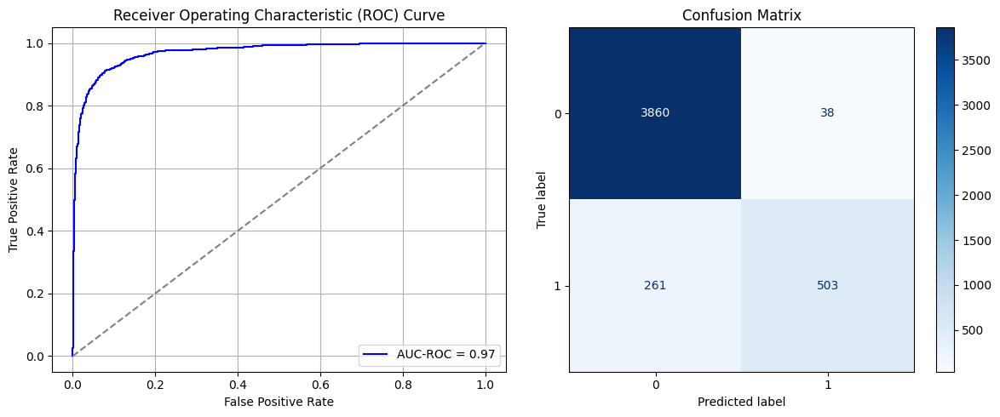

Best threshold based on F1-score: 0.2322874516248703
Time elapsed (performance): 30.036105075000023


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7159 - loss: 0.6374 - val_AUC: 0.7085 - val_loss: 0.5004
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7167 - loss: 0.4752 - val_AUC: 0.7221 - val_loss: 0.4816
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.4677 - val_AUC: 0.7331 - val_loss: 0.4724
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.4766 - val_AUC: 0.7433 - val_loss: 0.4669
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.4670 - val_AUC: 0.7456 - val_loss: 0.4627
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.4687 - val_AUC: 0.7493 - val_loss: 0.4601
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.4582 - val_AUC: 0.7567 - val_loss: 0.4597
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.4613 - val_AUC: 0.7575 - val_loss: 0.4543
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7017 - loss: 0.6682 - val_AUC: 0.7082 - val_loss: 0.4983
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.4966 - val_AUC: 0.7287 - val_loss: 0.4780
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.4712 - val_AUC: 0.7366 - val_loss: 0.4697
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.4552 - val_AUC: 0.7442 - val_loss: 0.4652
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.4677 - val_AUC: 0.7502 - val_loss: 0.4622
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4600 - val_AUC: 0.7525 - val_loss: 0.4589
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7513 - loss: 0.4648 - val_AUC: 0.7499 - val_loss: 0.4637
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.4513 - val_AUC: 0.7577 - val_loss: 0.4552
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7702 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6821 - loss: 0.6727 - val_AUC: 0.7094 - val_loss: 0.5004
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.4807 - val_AUC: 0.7208 - val_loss: 0.4816
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4773 - val_AUC: 0.7320 - val_loss: 0.4764
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7326 - loss: 0.4649 - val_AUC: 0.7407 - val_loss: 0.4670
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.4715 - val_AUC: 0.7497 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7410 - loss: 0.4697 - val_AUC: 0.7509 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7433 - loss: 0.4654 - val_AUC: 0.7544 - val_loss: 0.4576
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 - loss: 0.4574 - val_AUC: 0.7565 - val_loss: 0.4555
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7483 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6772 - loss: 0.6841 - val_AUC: 0.7082 - val_loss: 0.5003
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.4745 - val_AUC: 0.7234 - val_loss: 0.4810
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.4846 - val_AUC: 0.7315 - val_loss: 0.4726
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7344 - loss: 0.4712 - val_AUC: 0.7394 - val_loss: 0.4666
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7415 - loss: 0.4533 - val_AUC: 0.7477 - val_loss: 0.4633
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.4617 - val_AUC: 0.7499 - val_loss: 0.4607
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.4445 - val_AUC: 0.7563 - val_loss: 0.4570
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.4604 - val_AUC: 0.7521 - val_loss: 0.4582
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7559 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6884 - loss: 0.6606 - val_AUC: 0.7074 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.4727 - val_AUC: 0.7208 - val_loss: 0.4826
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.4672 - val_AUC: 0.7321 - val_loss: 0.4719
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.4612 - val_AUC: 0.7421 - val_loss: 0.4667
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.4590 - val_AUC: 0.7495 - val_loss: 0.4622
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.4557 - val_AUC: 0.7534 - val_loss: 0.4581
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.4525 - val_AUC: 0.7552 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.4585 - val_AUC: 0.7553 - val_loss: 0.4560
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7572 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7010 - loss: 0.6530 - val_AUC: 0.7080 - val_loss: 0.4965
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.4728 - val_AUC: 0.7240 - val_loss: 0.4800
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.4782 - val_AUC: 0.7364 - val_loss: 0.4711
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.4692 - val_AUC: 0.7442 - val_loss: 0.4642
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.4602 - val_AUC: 0.7511 - val_loss: 0.4608
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.4569 - val_AUC: 0.7497 - val_loss: 0.4623
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4515 - val_AUC: 0.7578 - val_loss: 0.4562
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4596 - val_AUC: 0.7529 - val_loss: 0.4591
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7655 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6958 - loss: 0.6364 - val_AUC: 0.7078 - val_loss: 0.4963
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.4756 - val_AUC: 0.7217 - val_loss: 0.4797
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4640 - val_AUC: 0.7359 - val_loss: 0.4715
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7052 - loss: 0.4852 - val_AUC: 0.7418 - val_loss: 0.4651
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.4712 - val_AUC: 0.7441 - val_loss: 0.4643
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7393 - loss: 0.4584 - val_AUC: 0.7549 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.4606 - val_AUC: 0.7576 - val_loss: 0.4558
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4563 - val_AUC: 0.7518 - val_loss: 0.4589
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7579 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6774 - loss: 0.6898 - val_AUC: 0.7059 - val_loss: 0.5025
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.4870 - val_AUC: 0.7233 - val_loss: 0.4800
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7211 - loss: 0.4772 - val_AUC: 0.7360 - val_loss: 0.4706
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4577 - val_AUC: 0.7406 - val_loss: 0.4710
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7342 - loss: 0.4533 - val_AUC: 0.7459 - val_loss: 0.4648
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.4643 - val_AUC: 0.7544 - val_loss: 0.4617
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4463 - val_AUC: 0.7569 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7379 - loss: 0.4568 - val_AUC: 0.7563 - val_loss: 0.4559
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - AUC: 0.6848 - loss: 0.6950 - val_AUC: 0.7087 - val_loss: 0.5023
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.4799 - val_AUC: 0.7250 - val_loss: 0.4789
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4863 - val_AUC: 0.7319 - val_loss: 0.4748
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4642 - val_AUC: 0.7425 - val_loss: 0.4661
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.4772 - val_AUC: 0.7442 - val_loss: 0.4640
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.4726 - val_AUC: 0.7475 - val_loss: 0.4636
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4551 - val_AUC: 0.7547 - val_loss: 0.4578
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7661 - loss: 0.4509 - val_AUC: 0.7578 - val_loss: 0.4553
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - AUC: 0.6826 - loss: 0.6635 - val_AUC: 0.7086 - val_loss: 0.4975
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7275 - loss: 0.4641 - val_AUC: 0.7253 - val_loss: 0.4802
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.4666 - val_AUC: 0.7349 - val_loss: 0.4702
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.4849 - val_AUC: 0.7405 - val_loss: 0.4680
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.4553 - val_AUC: 0.7440 - val_loss: 0.4684
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.4653 - val_AUC: 0.7488 - val_loss: 0.4618
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.4636 - val_AUC: 0.7518 - val_loss: 0.4607
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.4574 - val_AUC: 0.7560 - val_loss: 0.4560
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6967 - loss: 0.6597 - val_AUC: 0.7079 - val_loss: 0.5003
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.4817 - val_AUC: 0.7226 - val_loss: 0.4813
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.4816 - val_AUC: 0.7351 - val_loss: 0.4703
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7289 - loss: 0.4685 - val_AUC: 0.7420 - val_loss: 0.4659
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7416 - loss: 0.4688 - val_AUC: 0.7442 - val_loss: 0.4636
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.4772 - val_AUC: 0.7479 - val_loss: 0.4609
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7608 - loss: 0.4507 - val_AUC: 0.7530 - val_loss: 0.4582
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.4424 - val_AUC: 0.7587 - val_loss: 0.4547
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7621 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6846 - loss: 0.6774 - val_AUC: 0.7087 - val_loss: 0.4962
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7022 - loss: 0.4753 - val_AUC: 0.7277 - val_loss: 0.4783
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.4651 - val_AUC: 0.7358 - val_loss: 0.4739
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.4727 - val_AUC: 0.7439 - val_loss: 0.4650
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7368 - loss: 0.4606 - val_AUC: 0.7506 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.4633 - val_AUC: 0.7506 - val_loss: 0.4675
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7557 - loss: 0.4458 - val_AUC: 0.7590 - val_loss: 0.4586
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.4631 - val_AUC: 0.7561 - val_loss: 0.4562
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6941 - loss: 0.6669 - val_AUC: 0.7084 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.4761 - val_AUC: 0.7216 - val_loss: 0.4811
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.4700 - val_AUC: 0.7371 - val_loss: 0.4707
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7309 - loss: 0.4628 - val_AUC: 0.7433 - val_loss: 0.4675
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.4682 - val_AUC: 0.7474 - val_loss: 0.4614
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.4612 - val_AUC: 0.7520 - val_loss: 0.4585
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4508 - val_AUC: 0.7541 - val_loss: 0.4568
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4556 - val_AUC: 0.7528 - val_loss: 0.4581
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6973 - loss: 0.6414 - val_AUC: 0.7084 - val_loss: 0.4980
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7297 - loss: 0.4795 - val_AUC: 0.7292 - val_loss: 0.4756
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.4649 - val_AUC: 0.7373 - val_loss: 0.4691
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.4584 - val_AUC: 0.7462 - val_loss: 0.4640
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.4696 - val_AUC: 0.7474 - val_loss: 0.4623
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 - loss: 0.4612 - val_AUC: 0.7535 - val_loss: 0.4588
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.4494 - val_AUC: 0.7526 - val_loss: 0.4580
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7658 - loss: 0.4485 - val_AUC: 0.7567 - val_loss: 0.4557
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6705 - loss: 0.7060 - val_AUC: 0.7073 - val_loss: 0.5030
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7077 - loss: 0.4876 - val_AUC: 0.7203 - val_loss: 0.4822
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7348 - loss: 0.4676 - val_AUC: 0.7347 - val_loss: 0.4716
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7255 - loss: 0.4756 - val_AUC: 0.7410 - val_loss: 0.4663
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.4734 - val_AUC: 0.7460 - val_loss: 0.4629
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4435 - val_AUC: 0.7523 - val_loss: 0.4597
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.4619 - val_AUC: 0.7522 - val_loss: 0.4594
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.4592 - val_AUC: 0.7575 - val_loss: 0.4551
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7063 - loss: 0.6472 - val_AUC: 0.7084 - val_loss: 0.5002
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4888 - val_AUC: 0.7233 - val_loss: 0.4799
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.4789 - val_AUC: 0.7358 - val_loss: 0.4727
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.4774 - val_AUC: 0.7419 - val_loss: 0.4656
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7348 - loss: 0.4652 - val_AUC: 0.7483 - val_loss: 0.4618
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.4582 - val_AUC: 0.7469 - val_loss: 0.4619
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.4654 - val_AUC: 0.7579 - val_loss: 0.4553
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4605 - val_AUC: 0.7577 - val_loss: 0.4553
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7635 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7078 - loss: 0.6409 - val_AUC: 0.7104 - val_loss: 0.4956
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.4923 - val_AUC: 0.7293 - val_loss: 0.4764
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.4522 - val_AUC: 0.7392 - val_loss: 0.4689
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4706 - val_AUC: 0.7465 - val_loss: 0.4641
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.4564 - val_AUC: 0.7472 - val_loss: 0.4627
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.4605 - val_AUC: 0.7534 - val_loss: 0.4583
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.4588 - val_AUC: 0.7546 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.4511 - val_AUC: 0.7587 - val_loss: 0.4569
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7521 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.7077 - loss: 0.6434 - val_AUC: 0.7080 - val_loss: 0.4988
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.4754 - val_AUC: 0.7234 - val_loss: 0.4797
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.4661 - val_AUC: 0.7353 - val_loss: 0.4733
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.4793 - val_AUC: 0.7397 - val_loss: 0.4663
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.4687 - val_AUC: 0.7465 - val_loss: 0.4638
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7475 - loss: 0.4524 - val_AUC: 0.7564 - val_loss: 0.4607
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7446 - loss: 0.4583 - val_AUC: 0.7511 - val_loss: 0.4600
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7562 - loss: 0.4455 - val_AUC: 0.7565 - val_loss: 0.4566
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7577 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6918 - loss: 0.6777 - val_AUC: 0.7085 - val_loss: 0.4979
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.4870 - val_AUC: 0.7253 - val_loss: 0.4784
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.4880 - val_AUC: 0.7338 - val_loss: 0.4719
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.4616 - val_AUC: 0.7431 - val_loss: 0.4669
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.4624 - val_AUC: 0.7470 - val_loss: 0.4634
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.4612 - val_AUC: 0.7531 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.4717 - val_AUC: 0.7551 - val_loss: 0.4570
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7546 - loss: 0.4450 - val_AUC: 0.7552 - val_loss: 0.4568
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.7052 - loss: 0.6452 - val_AUC: 0.7053 - val_loss: 0.5015
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.4811 - val_AUC: 0.7226 - val_loss: 0.4812
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.4640 - val_AUC: 0.7377 - val_loss: 0.4701
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4707 - val_AUC: 0.7446 - val_loss: 0.4656
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4625 - val_AUC: 0.7468 - val_loss: 0.4636
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7491 - loss: 0.4599 - val_AUC: 0.7504 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.4619 - val_AUC: 0.7540 - val_loss: 0.4568
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.4675 - val_AUC: 0.7560 - val_loss: 0.4559
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 

In [34]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [35]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.7319031141868512
Var: 0.0032930640198273495


In [37]:
print(ParamFit)
ParamFit.to_csv('Imbalanced_Fine_Tuning.csv')

         FPR       FNR
0   0.035272  0.681661
1   0.029552  0.705882
2   0.023832  0.733564
3   0.028599  0.709343
4   0.023832  0.737024
..       ...       ...
95  0.016206  0.771626
96  0.035272  0.702422
97  0.033365  0.705882
98  0.033365  0.705882
99  0.029552  0.730104

[100 rows x 2 columns]


# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [32]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [33]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Y2'])
# print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

T_train['Y'].value_counts()

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRS)

3910
19400
1262
4090
2199    0
4371    0
799     0
643     0
4919    0
       ..
6216    1
6458    1
3468    1
5874    1
5827    1
Name: Y, Length: 2524, dtype: int64


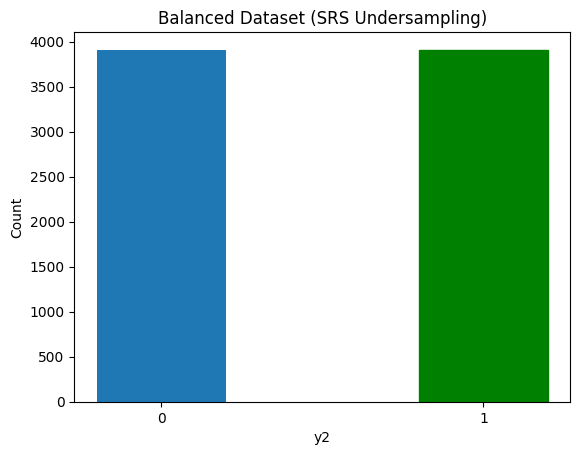

In [34]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Balanced Dataset (SRS Undersampling)")
plt.show()

In [35]:
data_T_y.value_counts()

,count
Y,
0,5139
1,1551


In [36]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.6634 - loss: 0.6574 - val_AUC: 0.8639 - val_loss: 0.4881
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8420 - loss: 0.4948 - val_AUC: 0.9111 - val_loss: 0.4340
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8840 - loss: 0.4283 - val_AUC: 0.9284 - val_loss: 0.3730
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9004 - loss: 0.4007 - val_AUC: 0.9326 - val_loss: 0.3928
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9154 - loss: 0.3719 - val_AUC: 0.9459 - val_loss: 0.3231
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9314 - loss: 0.3348 - val_AUC: 0.9473 - val_loss: 0.3352
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9424 - loss: 0.3086 - val_AUC: 0.9513 - val_loss: 0.2832
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9369 - loss: 0.3222 - val_AUC: 0.9520 - val_loss: 0.3516
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

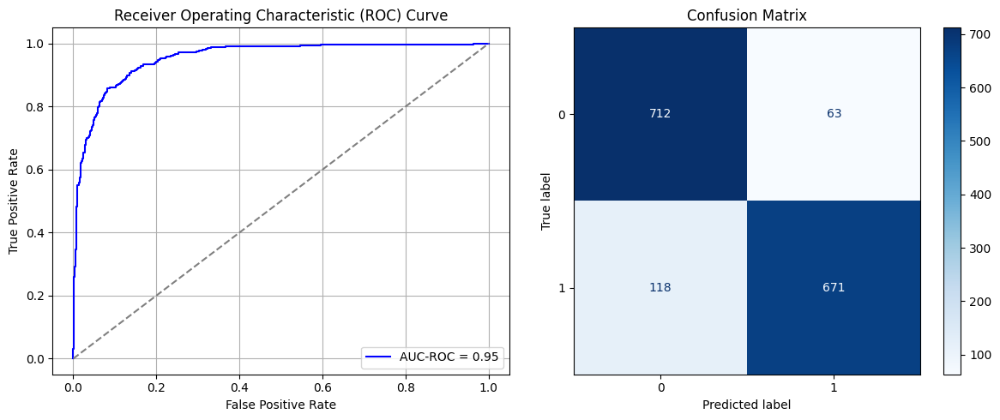

Best threshold based on F1-score: 0.32096171379089355
Time elapsed (performance): 17.58804277299896


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7059 - loss: 0.8318 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7457 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7478 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.9665
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7597 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7732 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7050 - loss: 0.8246 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7371 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7202 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7394 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7513 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7433 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7260
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7773 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7696 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7116 - loss: 0.8192 - val_AUC: 0.0000e+00 - val_loss: 0.9945
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7434 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7642 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7636 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7692 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7892 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7053 - loss: 0.8210 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7380 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7476 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7521 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7324
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7634 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.9759
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.7374
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7115 - loss: 0.7971 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7400 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9722
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7611 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7755 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7597 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7341 - loss: 0.7681 - val_AUC: 0.0000e+00 - val_loss: 0.9857
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7535 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7736 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7671 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7149
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7200 - loss: 0.7657 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7406 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7494 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7455 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7479 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7567 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7575
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7839 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7622 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7158
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7124 - loss: 0.8143 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7168 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7244
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7313 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7553 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.9574
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7722 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - AUC: 0.6907 - loss: 0.8635 - val_AUC: 0.0000e+00 - val_loss: 1.0245
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7208 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7318 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7320 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7491 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7687 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7613
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7796 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7055 - loss: 0.8332 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7124 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7465 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7586 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7510 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7535 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7677 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7132 - loss: 0.7946 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7391 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7353
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7585 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7765 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6985 - loss: 0.8513 - val_AUC: 0.0000e+00 - val_loss: 1.0543
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7286 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7298 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.6671
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7552 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7513 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7474 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7762 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7870 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7219 - loss: 0.7906 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7569 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7256 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7481 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7643 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.9760
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7510 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7469
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7723 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7095 - loss: 0.8110 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7056 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7294 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7400 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7716 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.9328
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7487 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7620 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7001 - loss: 0.8325 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7265 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7400 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.9585
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7691 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7417 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7649 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.7112
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7703 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7016 - loss: 0.8254 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7356 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7359 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7652 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7560 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7602 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7650 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6809 - loss: 0.8908 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7468 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7646 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7637 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7693 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - AUC: 0.6990 - loss: 0.8011 - val_AUC: 0.0000e+00 - val_loss: 0.9656
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7437 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7396 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.7845
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7806 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7327
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7631 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7374
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7694 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7129 - loss: 0.8036 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7055 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.6725
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7434 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7368 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7635 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7688 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7469 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7085 - loss: 0.7890 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7462 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.9728
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7476 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7583 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7639
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7844 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6630 - loss: 0.6658 - val_AUC: 0.8294 - val_loss: 0.5269
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8388 - loss: 0.5011 - val_AUC: 0.9052 - val_loss: 0.4037
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8876 - loss: 0.4240 - val_AUC: 0.9305 - val_loss: 0.3473
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9021 - loss: 0.3958 - val_AUC: 0.9384 - val_loss: 0.3270
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9201 - loss: 0.3617 - val_AUC: 0.9392 - val_loss: 0.3175
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9342 - loss: 0.3278 - val_AUC: 0.9473 - val_loss: 0.3025
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9388 - loss: 0.3155 - val_AUC: 0.9526 - val_loss: 0.2859
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.9424 - loss: 0.3083 - val_AUC: 0.9556 - val_loss: 0.2722
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

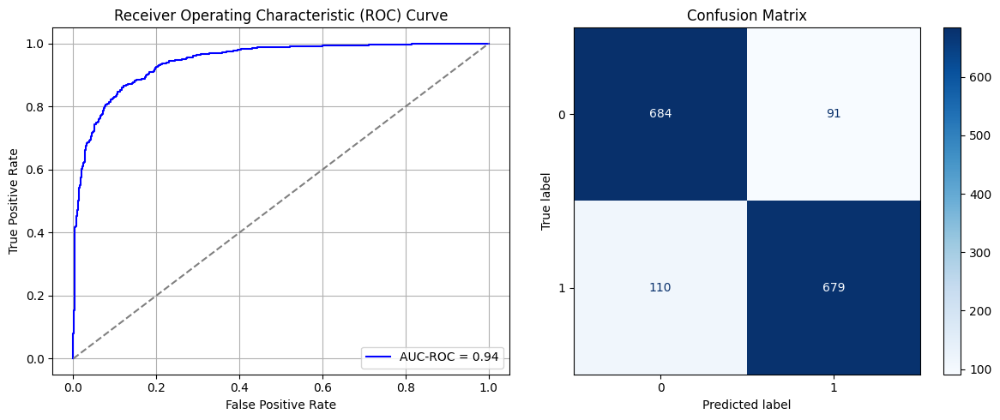

Best threshold based on F1-score: 0.29009732604026794
Time elapsed (performance): 16.370424528999138


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7171 - loss: 0.7962 - val_AUC: 0.0000e+00 - val_loss: 1.0232
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7414 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7371 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9392
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7508 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7564 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.7180 - loss: 0.7816 - val_AUC: 0.0000e+00 - val_loss: 0.9710
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7388 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7367 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - AUC: 0.7264 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7344 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7479 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - AUC: 0.7618 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - AUC: 0.7613 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7090 - loss: 0.7802 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7469 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7321 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7600 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7499 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7501 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/st

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7410 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.7269
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7519 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7682 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7553 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7579 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7039
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7377 - loss: 0.7069 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7420 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7383 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7420 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7512 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7447 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7585 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7057 - loss: 0.7998 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7466 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7555 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7669 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.7063
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7355 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7451 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7230
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7196 - loss: 0.7968 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7403 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7605 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7594 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7275 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7341 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7521 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7126 - loss: 0.7640 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7425 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7372 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7465 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7620 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7465 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7537 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7451 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7085 - loss: 0.8040 - val_AUC: 0.0000e+00 - val_loss: 1.0216
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7541 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7392 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9984
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7552 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7570 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7658 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7637 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - AUC: 0.7499 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7271 - loss: 0.7146 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7231 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7423 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7535
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7481 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7557 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7525 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7485 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7793 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7253 - loss: 0.7272 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7577 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7479 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7520 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7659 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.6987
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7116 - loss: 0.7623 - val_AUC: 0.0000e+00 - val_loss: 0.9279
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7503 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7565 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.9718
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7497 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7277 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7492 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7562 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7193 - loss: 0.7642 - val_AUC: 0.0000e+00 - val_loss: 0.9811
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7326 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7534 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7349 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7412 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7287
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7305 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7220 - loss: 0.7706 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9909
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7342 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7286 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7432 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7617 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7543 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7017 - loss: 0.7938 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7433 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7453 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7525 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.9437
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7476 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7464 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7380 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7063 - loss: 0.8000 - val_AUC: 0.0000e+00 - val_loss: 0.9261
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7627 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7205 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7451 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7687 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7539 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7184 - loss: 0.7562 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7520 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7424 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7386 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7458 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7609 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7476 - loss: 0.7000 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7450 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7584 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7605 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7824
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7585 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7556 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7298
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7192 - loss: 0.7573 - val_AUC: 0.0000e+00 - val_loss: 1.0027
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7437 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7410 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7537 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7486 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7652 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7711 - loss: 0.5314 - val_AUC: 0.0000e+00 - val_loss: 0.7385
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.7117 - loss: 0.8128 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7435 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7439 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7465 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7588 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7605 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7644 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7527 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.6053 - loss: 0.6748 - val_AUC: 0.7933 - val_loss: 0.5680
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8042 - loss: 0.5379 - val_AUC: 0.8914 - val_loss: 0.4395
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8681 - loss: 0.4539 - val_AUC: 0.9173 - val_loss: 0.3748
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8898 - loss: 0.4177 - val_AUC: 0.9219 - val_loss: 0.3765
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9122 - loss: 0.3760 - val_AUC: 0.9393 - val_loss: 0.3332
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.9260 - loss: 0.3469 - val_AUC: 0.9444 - val_loss: 0.3020
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.9329 - loss: 0.3313 - val_AUC: 0.9490 - val_loss: 0.2958
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9428 - loss: 0.3052 - val_AUC: 0.9518 - val_loss: 0.3062
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

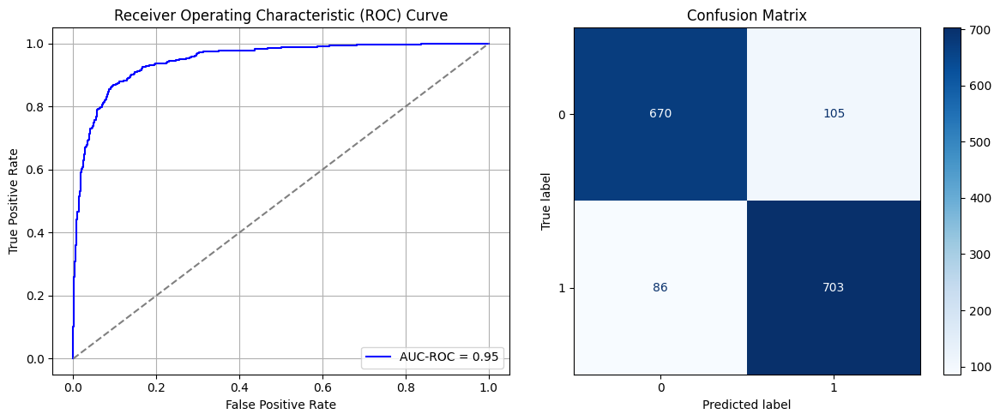

Best threshold based on F1-score: 0.403106689453125
Time elapsed (performance): 19.546080784999504


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7256 - loss: 0.6872 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7568 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7594 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7425 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8823
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7559 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7470 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7398 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7592 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7324 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9465
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7384 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7394 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7503 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7546 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7478 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7517 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7352 - loss: 0.6811 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7433 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7641 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7437 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7622 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7468 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7308 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7444 - loss: 0.6523 - val_AUC: 0.0000e+00 - val_loss: 0.9376
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7242 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7432 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7385 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7366 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7543 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7489 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7438 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7104 - loss: 0.7119 - val_AUC: 0.0000e+00 - val_loss: 0.9605
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7438 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7298 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7278 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7442 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7432 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7413 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7207 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7325 - loss: 0.6812 - val_AUC: 0.0000e+00 - val_loss: 0.9926
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7618 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7424 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7292 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7530 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7401 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7470 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7390 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7460 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7345 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7581 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7278 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9476
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7151 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7363 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7462 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7455 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7462 - loss: 0.6360 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7404 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7461 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7436 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7525 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7316 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7377 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.9676
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7593 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7466 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7432 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7563 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7600 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7510 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7261 - loss: 0.6846 - val_AUC: 0.0000e+00 - val_loss: 0.9532
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7410 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7452 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7441 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7414 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7439 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7561 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.7616
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7566 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7447 - loss: 0.6612 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7210 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7366 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7623 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7593 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7472 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7354 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7389 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7381 - loss: 0.6658 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7250 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7590 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7435 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7412 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7447 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7285 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7484 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7294 - loss: 0.6970 - val_AUC: 0.0000e+00 - val_loss: 0.9858
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7499 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7494 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7412 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7413 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7618 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7419 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7335 - loss: 0.6790 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7229 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7473 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7370 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7432 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7638 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7510 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.7450
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7387 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7380 - loss: 0.6739 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7059 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7506 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7567 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7177 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7534 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7503 - loss: 0.6465 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7315 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7339 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7439 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7371 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7611 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7370 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7377 - loss: 0.6747 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7385 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7440 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7564 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7480 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7440 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7496 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7541 - loss: 0.6399 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7248 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7305 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7492 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7558 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7392 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7519 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7379 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/st

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7292 - loss: 0.6920 - val_AUC: 0.0000e+00 - val_loss: 1.0031
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7382 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7522 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7388 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7681 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7429 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7606 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7258 - loss: 0.7036 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7345 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7474 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7489 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7396 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7559 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7328 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6558 - loss: 0.6621 - val_AUC: 0.8356 - val_loss: 0.5183
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8361 - loss: 0.5028 - val_AUC: 0.9057 - val_loss: 0.4458
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.8888 - loss: 0.4228 - val_AUC: 0.9249 - val_loss: 0.3746
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.9002 - loss: 0.4001 - val_AUC: 0.9435 - val_loss: 0.3204
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9282 - loss: 0.3408 - val_AUC: 0.9508 - val_loss: 0.3095
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9375 - loss: 0.3203 - val_AUC: 0.9542 - val_loss: 0.2762
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9471 - loss: 0.2949 - val_AUC: 0.9585 - val_loss: 0.2683
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9546 - loss: 0.2769 - val_AUC: 0.9530 - val_loss: 0.2923
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

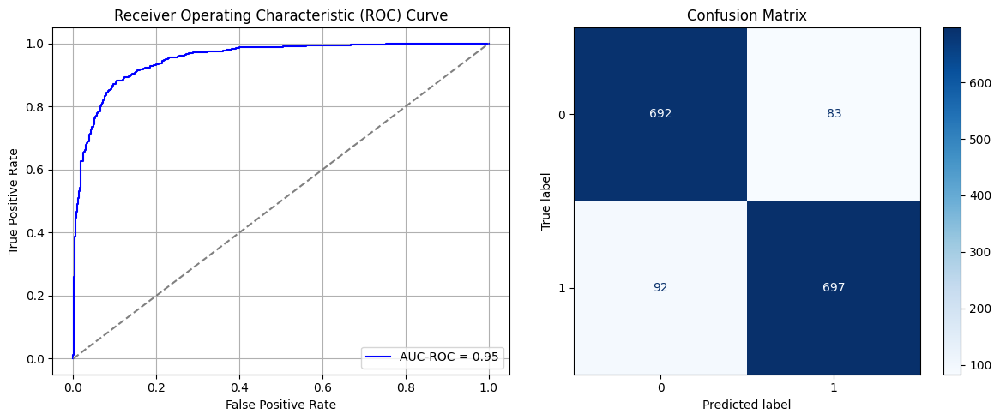

Best threshold based on F1-score: 0.5013766884803772
Time elapsed (performance): 17.74825016199975


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6277 - loss: 0.8552 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6431 - loss: 0.6611 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6397 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6739 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6718 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6997 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6931 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7343 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6229 - loss: 0.8684 - val_AUC: 0.0000e+00 - val_loss: 0.9612
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6113 - loss: 0.6739 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6385 - loss: 0.6440 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6748 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6864 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6887 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 1.0120
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6749 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7080 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6007 - loss: 0.9238 - val_AUC: 0.0000e+00 - val_loss: 1.0197
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6297 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6698 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6846 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.9696
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6765 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6958 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6984 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7039 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6136 - loss: 0.8690 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6330 - loss: 0.6622 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6564 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6618 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6809 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6901 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7064 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7081 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9822
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6182 - loss: 0.8619 - val_AUC: 0.0000e+00 - val_loss: 1.0432
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6467 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6675 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6645 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7038 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6940 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.7444
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7111 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7259 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6090 - loss: 0.8627 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6320 - loss: 0.6722 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6721 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6832 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9355
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6934 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6917 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7033 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6963 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6231 - loss: 0.8487 - val_AUC: 0.0000e+00 - val_loss: 0.9863
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6394 - loss: 0.6564 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6588 - loss: 0.6323 - val_AUC: 0.0000e+00 - val_loss: 0.9925
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6708 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6950 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6877 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7058 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7109 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/st

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6213 - loss: 0.8705 - val_AUC: 0.0000e+00 - val_loss: 0.9672
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6297 - loss: 0.6589 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6661 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6650 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7012 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6921 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7029 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7120 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6263 - loss: 0.8096 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6542 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6245 - loss: 0.6496 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6720 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7026 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7068 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7047 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7009 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9563
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6118 - loss: 0.8528 - val_AUC: 0.0000e+00 - val_loss: 0.9834
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6250 - loss: 0.6732 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6549 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6808 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6742 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7153 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7016 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9544
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7009 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6181 - loss: 0.8872 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6369 - loss: 0.6602 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6235 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6723 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.9504
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6755 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7116 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9748
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7067 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7026 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.5966 - loss: 0.8616 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6322 - loss: 0.6543 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6355 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6650 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6911 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9655
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7059 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6949 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7040 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6175 - loss: 0.8489 - val_AUC: 0.0000e+00 - val_loss: 0.9599
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6436 - loss: 0.6512 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6389 - loss: 0.6360 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6698 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6750 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6940 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.7897
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7126 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7301
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7207 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6147 - loss: 0.8698 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6505 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6563 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6838 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7013 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6982 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6989 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7128 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6220 - loss: 0.8408 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6434 - loss: 0.6498 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6626 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6550 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6791 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6888 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7031 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7088 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.5863 - loss: 0.9435 - val_AUC: 0.0000e+00 - val_loss: 0.9872
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6356 - loss: 0.6588 - val_AUC: 0.0000e+00 - val_loss: 0.9829
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6514 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6716 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6850 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6944 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.7555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7064 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7211 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6412 - loss: 0.8458 - val_AUC: 0.0000e+00 - val_loss: 1.0162
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6376 - loss: 0.6553 - val_AUC: 0.0000e+00 - val_loss: 0.9444
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6512 - loss: 0.6248 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6770 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6808 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6879 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6955 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7253 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9973
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6005 - loss: 0.8894 - val_AUC: 0.0000e+00 - val_loss: 0.9799
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6527 - loss: 0.6487 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6603 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6823 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6911 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6959 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6912 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7020 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6161 - loss: 0.9089 - val_AUC: 0.0000e+00 - val_loss: 1.0905
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6585 - loss: 0.6412 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6545 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6654 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6720 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6829 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6974 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7025 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6259 - loss: 0.8503 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6359 - loss: 0.6514 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6584 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6701 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9876
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6755 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6994 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7140 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6892 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - AUC: 0.6449 - loss: 0.6630 - val_AUC: 0.8309 - val_loss: 0.5728
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.8215 - loss: 0.5240 - val_AUC: 0.9024 - val_loss: 0.4589
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.8535 - loss: 0.4751 - val_AUC: 0.9230 - val_loss: 0.3632
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9046 - loss: 0.3916 - val_AUC: 0.9302 - val_loss: 0.3462
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9204 - loss: 0.3605 - val_AUC: 0.9403 - val_loss: 0.3242
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9370 - loss: 0.3226 - val_AUC: 0.9416 - val_loss: 0.3137
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9404 - loss: 0.3120 - val_AUC: 0.9535 - val_loss: 0.2915
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9503 - loss: 0.2849 - val_AUC: 0.9618 - val_loss: 0.2521
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step

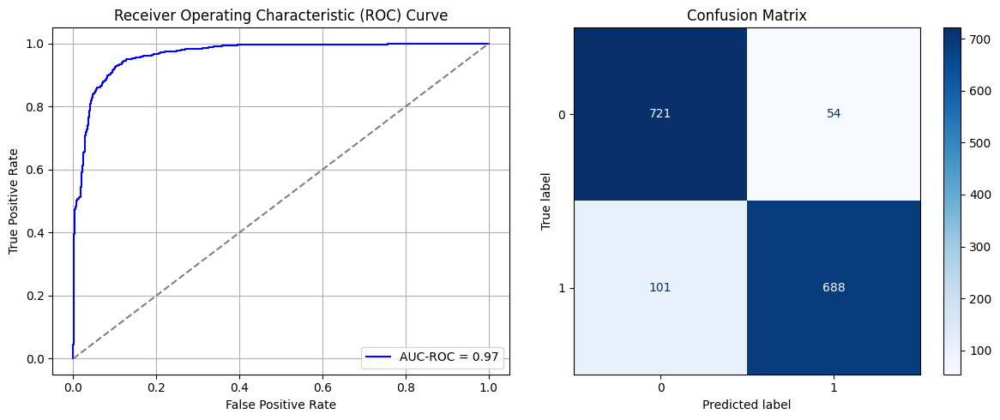

Best threshold based on F1-score: 0.27610912919044495
Time elapsed (performance): 19.511246138999923


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7282 - loss: 0.7654 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7107 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7129 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7294 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7436 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7402 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7368 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7397 - loss: 0.7500 - val_AUC: 0.0000e+00 - val_loss: 1.0079
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7458 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7375 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7291 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7273 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7311 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7521 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7273 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.7258 - loss: 0.7741 - val_AUC: 0.0000e+00 - val_loss: 0.9866
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7203 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7432 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7205 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7463 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9629
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7218 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7395 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7213 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7216 - loss: 0.7689 - val_AUC: 0.0000e+00 - val_loss: 0.9873
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6953 - loss: 0.6516 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7480 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7223 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7440 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7335 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7446 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7207 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7163 - loss: 0.7488 - val_AUC: 0.0000e+00 - val_loss: 1.0187
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7268 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7191 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7057 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7333 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7272 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7412 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7435 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7265 - loss: 0.7602 - val_AUC: 0.0000e+00 - val_loss: 0.9994
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7309 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7214 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 1.0283
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7222 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7271 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7242 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7285 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7639
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7381 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7127 - loss: 0.7966 - val_AUC: 0.0000e+00 - val_loss: 0.9770
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7326 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7237 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7278 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7392 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7273 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7216 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7420 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7111 - loss: 0.8008 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7319 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7447 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7153 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7334 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7505 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7364 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7481 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7208 - loss: 0.8015 - val_AUC: 0.0000e+00 - val_loss: 1.0916
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7561 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7235 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7366 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7213 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 1.0553
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7352 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7296 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7332 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7383 - loss: 0.7147 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7188 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7090 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7434 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7541 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7152 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7488 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7314 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7252 - loss: 0.7682 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7226 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7252 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7436 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7345 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7450 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7321 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7536 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7272 - loss: 0.7854 - val_AUC: 0.0000e+00 - val_loss: 0.9831
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7033 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7339 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7291 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7216 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7439 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7246 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7134 - loss: 0.7671 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7387 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9700
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7060 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7295 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7313 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7224 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7430 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.7554
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7278 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7250 - loss: 0.7918 - val_AUC: 0.0000e+00 - val_loss: 0.9937
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7333 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7226 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7430 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7287 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7496 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7313 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7305 - loss: 0.7446 - val_AUC: 0.0000e+00 - val_loss: 1.0142
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7260 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7456 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7471 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7495 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7100 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7302 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7481 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7248 - loss: 0.7504 - val_AUC: 0.0000e+00 - val_loss: 1.0748
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7325 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7466 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 1.0516
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7126 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7371 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7134 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.7240
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7401 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7351 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7309 - loss: 0.7561 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7331 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7272 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7386 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7304 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7231 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7299 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7300 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7072 - loss: 0.7928 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7232 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7319 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7484 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7145 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7351 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.9669
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7195 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7511 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.9702
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7136 - loss: 0.8181 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7102 - loss: 0.6338 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7300 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9575
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7320 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7386 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7480 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7142 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7361 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7125 - loss: 0.8015 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7518 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 1.0529
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7187 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7471 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7338 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7231 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7300 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7003
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

In [37]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [38]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5385121107266435
Var: 0.0040494636381898244


In [39]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.108675  0.487889
1   0.129647  0.442907
2   0.113441  0.467128
3   0.148713  0.425606
4   0.119161  0.463668
..       ...       ...
95  0.139180  0.456747
96  0.124881  0.470588
97  0.131554  0.463668
98  0.103908  0.501730
99  0.168732  0.425606

[100 rows x 2 columns]


## Simple Random Sampling with Replacement:

In [41]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [42]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y
0,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.35,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0
1,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.15,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.75,0.583333,0.476190,0.454545,0.476190,0.70,0.571429,0.291667,0.727273,0
3,0.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.000000,...,0.35,0.625000,0.523810,0.454545,0.619048,0.45,0.523810,0.833333,0.500000,0
4,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.65,0.416667,0.666667,0.636364,0.619048,0.65,0.333333,0.541667,0.409091,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6685,0.0,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,1.000000,...,0.50,0.500000,0.571429,0.545455,0.619048,0.45,0.571429,0.375000,0.500000,1
6686,0.0,1.0,0.0,1.0,1.0,0.5,0.5,0.0,0.666667,1.000000,...,0.50,0.458333,0.523810,0.500000,0.476190,0.30,0.476190,0.333333,0.681818,1
6687,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.60,0.416667,0.523810,0.500000,0.619048,0.40,0.523810,0.458333,0.363636,1
6688,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1


In [43]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(X_S_SRSwR)

3910
19400
         0    1    2    3    4    5    6    7         8         9        10  \
15725  1.0  0.0  0.0  1.0  1.0  0.5  0.5  0.5  0.666667  0.666667  0.500000   
17730  1.0  0.0  1.0  0.0  0.0  0.5  0.5  0.5  0.333333  0.666667  0.454545   
15377  1.0  1.0  0.0  0.0  1.0  0.5  0.5  0.5  0.666667  0.666667  0.500000   
7763   1.0  0.0  0.0  1.0  1.0  0.5  1.0  0.5  0.666667  0.333333  0.500000   
13435  1.0  1.0  1.0  0.0  0.0  0.5  0.5  0.5  0.666667  1.000000  0.590909   
...    ...  ...  ...  ...  ...  ...  ...  ...       ...       ...       ...   
23305  1.0  1.0  0.0  0.0  1.0  0.5  0.5  0.5  0.333333  0.666667  0.727273   
23306  1.0  1.0  1.0  0.0  0.0  0.5  0.5  0.5  0.666667  0.333333  0.363636   
23307  1.0  1.0  1.0  0.0  1.0  0.5  0.5  0.5  1.000000  0.666667  0.454545   
23308  1.0  1.0  0.0  1.0  1.0  0.5  0.5  0.5  0.666667  0.333333  0.454545   
23309  1.0  0.0  1.0  1.0  0.0  0.5  0.5  0.5  0.666667  0.666667  0.454545   

         11        12        13        1

In [44]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRSwR)

1262
4090
1006    0
5533    0
3134    0
3514    0
423     0
       ..
6216    1
6458    1
3468    1
5874    1
5827    1
Name: Y, Length: 2524, dtype: int64


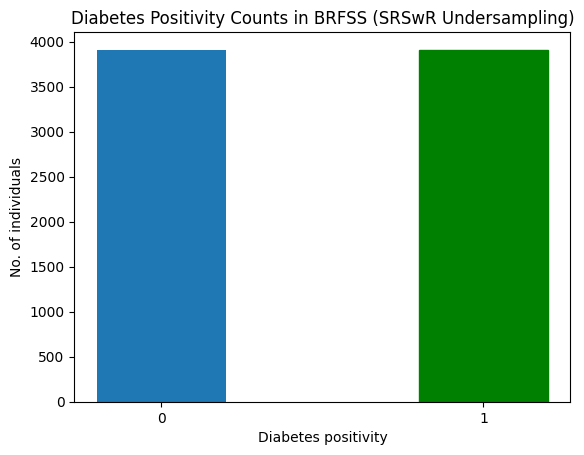

In [45]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [46]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - AUC: 0.6698 - loss: 0.6501 - val_AUC: 0.8136 - val_loss: 0.5463
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8180 - loss: 0.5245 - val_AUC: 0.8763 - val_loss: 0.4659
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8629 - loss: 0.4613 - val_AUC: 0.8959 - val_loss: 0.4189
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9007 - loss: 0.3987 - val_AUC: 0.9172 - val_loss: 0.3879
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9131 - loss: 0.3752 - val_AUC: 0.9315 - val_loss: 0.3465
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9224 - loss: 0.3550 - val_AUC: 0.9357 - val_loss: 0.3320
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9289 - loss: 0.3399 - val_AUC: 0.9416 - val_loss: 0.3117
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9328 - loss: 0.3307 - val_AUC: 0.9448 - val_loss: 0.3100
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

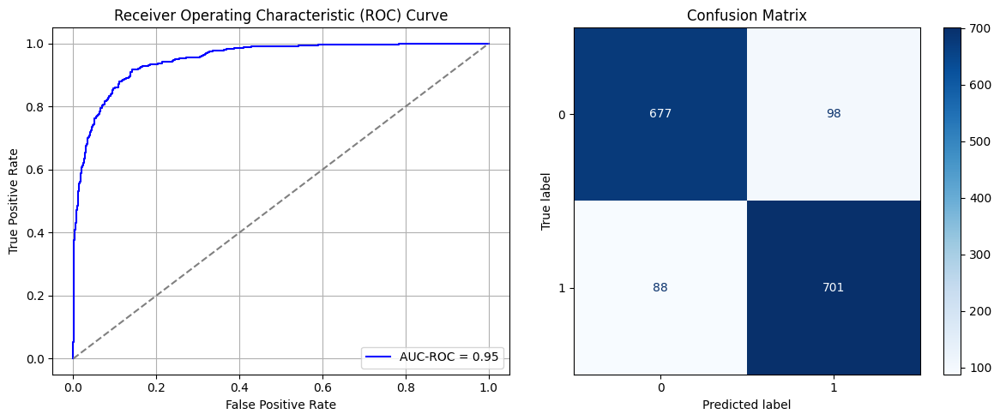

Best threshold based on F1-score: 0.4262133836746216
Time elapsed (performance): 12.649059639000143


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7340 - loss: 0.7960 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7573 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7152
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7138 - loss: 0.8829 - val_AUC: 0.0000e+00 - val_loss: 0.9825
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7313 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7134 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7545 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7349 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7308 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7507 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7207 - loss: 0.8398 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7470 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7493 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.7351 - loss: 0.8331 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7636 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7566 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7252 - loss: 0.8503 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7353 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7328 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7517 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7349 - loss: 0.8285 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7537 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7649 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7629
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7574 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7100 - loss: 0.8948 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7289 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.7651
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7496 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7284 - loss: 0.7910 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7109 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7328 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7510 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7519 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7056 - loss: 0.8728 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7542 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7536 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7493 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7616 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7625 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7146 - loss: 0.8706 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7737
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7429 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.7312 - loss: 0.8115 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7592 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7427 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7395 - loss: 0.7900 - val_AUC: 0.0000e+00 - val_loss: 1.0306
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7108 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7477 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7414 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7453 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7309 - loss: 0.8036 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7469 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7616
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7608 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7289 - loss: 0.8311 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7496 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7460 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7165
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7300 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7626 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7626 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7526 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7971
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7092 - loss: 0.8425 - val_AUC: 0.0000e+00 - val_loss: 0.9925
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7458 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7264 - loss: 0.8068 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7566 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7541 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7512 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7742 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7221 - loss: 0.8375 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7421 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7486 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7521 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7384 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7491 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7384 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7175 - loss: 0.8625 - val_AUC: 0.0000e+00 - val_loss: 1.0044
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7458 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7224 - loss: 0.8451 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7516 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7382 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.6568 - loss: 0.6630 - val_AUC: 0.8674 - val_loss: 0.5005
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8574 - loss: 0.4715 - val_AUC: 0.8983 - val_loss: 0.4352
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8801 - loss: 0.4364 - val_AUC: 0.9113 - val_loss: 0.4001
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8910 - loss: 0.4172 - val_AUC: 0.9293 - val_loss: 0.3864
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9311 - loss: 0.3361 - val_AUC: 0.9368 - val_loss: 0.3295
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9300 - loss: 0.3367 - val_AUC: 0.9383 - val_loss: 0.3248
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9424 - loss: 0.3070 - val_AUC: 0.9449 - val_loss: 0.3002
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9476 - loss: 0.2926 - val_AUC: 0.9499 - val_loss: 0.2987
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

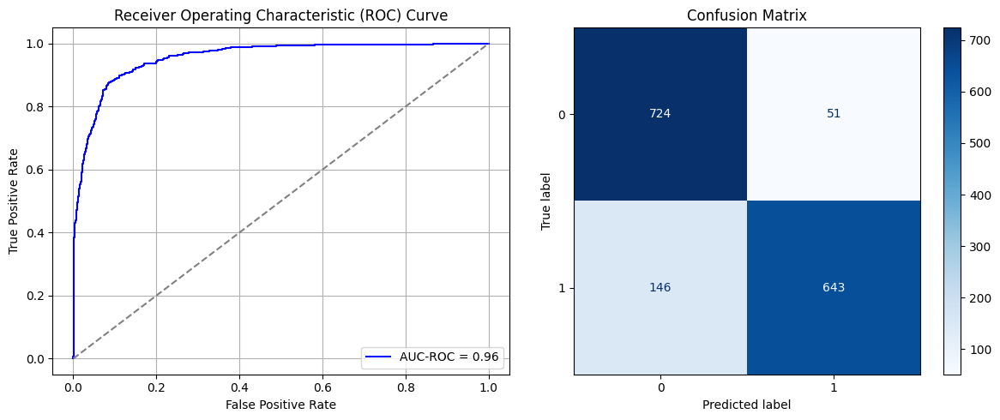

Best threshold based on F1-score: 0.3622521162033081
Time elapsed (performance): 13.790409008000097


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6721 - loss: 0.9331 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7129 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9842
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7210 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6951 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6748 - loss: 0.9148 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7046 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6943 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6933 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7100 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7225 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6936 - loss: 0.9140 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7239 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7204 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7156 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9855
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7155 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9714
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6733 - loss: 0.9674 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7139 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7027 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9495
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7050 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7107 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6705 - loss: 0.9131 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7073 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7158 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6781 - loss: 0.8926 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7044 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7197 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6882 - loss: 0.9286 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7114 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9428
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7203 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9606
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6783 - loss: 0.9056 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7117 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6858 - loss: 0.8808 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6987 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9599
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7081 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7091 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7021 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7108 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6801 - loss: 0.9365 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6959 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9612
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7068 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6849 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6661 - loss: 0.9204 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7212 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6936 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7218 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6835 - loss: 0.9351 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7125 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7005 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6852 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7171 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7808
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6659 - loss: 0.9100 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6850 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7084 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7806
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7178 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6681 - loss: 0.9752 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7052 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7071 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6725 - loss: 0.9235 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7040 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7151 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7009 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6676 - loss: 0.9660 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7081 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7081 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6974 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6667 - loss: 0.9090 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7112 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6908 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7152 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6921 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6969 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9958
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7034 - loss: 0.8363 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7142 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 1.0344
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7122 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6511 - loss: 0.9684 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6989 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9580
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7433 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6747 - loss: 0.9482 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6800 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7269 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9647
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9789
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - AUC: 0.6172 - loss: 0.6707 - val_AUC: 0.7818 - val_loss: 0.5896
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8098 - loss: 0.5324 - val_AUC: 0.8784 - val_loss: 0.4458
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8758 - loss: 0.4419 - val_AUC: 0.9098 - val_loss: 0.3989
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9029 - loss: 0.3956 - val_AUC: 0.9231 - val_loss: 0.3970
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9217 - loss: 0.3601 - val_AUC: 0.9408 - val_loss: 0.3218
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9341 - loss: 0.3291 - val_AUC: 0.9485 - val_loss: 0.3677
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9337 - loss: 0.3289 - val_AUC: 0.9455 - val_loss: 0.2985
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9493 - loss: 0.2886 - val_AUC: 0.9610 - val_loss: 0.2626
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

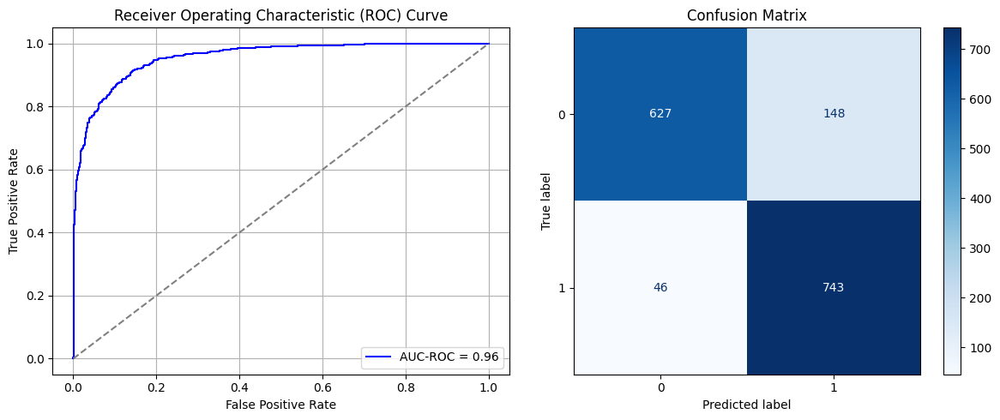

Best threshold based on F1-score: 0.6391157507896423
Time elapsed (performance): 19.14694052599998


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6086 - loss: 1.1843 - val_AUC: 0.0000e+00 - val_loss: 1.1488
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6243 - loss: 0.6914 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6281 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.9371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6547 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6504 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9994
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6587 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6703 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6678 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.6211 - loss: 1.1285 - val_AUC: 0.0000e+00 - val_loss: 1.2575
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6574 - loss: 0.6723 - val_AUC: 0.0000e+00 - val_loss: 1.0013
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6446 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.9948
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6676 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.9818
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6478 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6634 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6654 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6749 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6322 - loss: 1.1349 - val_AUC: 0.0000e+00 - val_loss: 1.2060
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6341 - loss: 0.7070 - val_AUC: 0.0000e+00 - val_loss: 0.9985
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6567 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6482 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6656 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6476 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6769 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6843 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6084 - loss: 1.1688 - val_AUC: 0.0000e+00 - val_loss: 1.2134
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6491 - loss: 0.6765 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6719 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6607 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6629 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9617
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6548 - loss: 0.6405 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6645 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6726 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6128 - loss: 1.1487 - val_AUC: 0.0000e+00 - val_loss: 1.2148
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6138 - loss: 0.7159 - val_AUC: 0.0000e+00 - val_loss: 1.0410
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6530 - loss: 0.6469 - val_AUC: 0.0000e+00 - val_loss: 0.9913
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6420 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6403 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6540 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6581 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6561 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6140 - loss: 1.1960 - val_AUC: 0.0000e+00 - val_loss: 1.1777
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6429 - loss: 0.6953 - val_AUC: 0.0000e+00 - val_loss: 0.9703
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6412 - loss: 0.6524 - val_AUC: 0.0000e+00 - val_loss: 1.0353
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6588 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6625 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6651 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6582 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 1.0165
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6425 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.6145 - loss: 1.1470 - val_AUC: 0.0000e+00 - val_loss: 1.1705
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6440 - loss: 0.6838 - val_AUC: 0.0000e+00 - val_loss: 1.0002
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6490 - loss: 0.6399 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6360 - loss: 0.6381 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6710 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6550 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.9396
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6758 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6832 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6163 - loss: 1.2002 - val_AUC: 0.0000e+00 - val_loss: 1.1523
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6155 - loss: 0.7164 - val_AUC: 0.0000e+00 - val_loss: 1.0034
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6284 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6595 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6357 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6755 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6877 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6796 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6116 - loss: 1.1702 - val_AUC: 0.0000e+00 - val_loss: 1.2251
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6313 - loss: 0.6978 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6497 - loss: 0.6427 - val_AUC: 0.0000e+00 - val_loss: 0.9767
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6447 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 1.0188
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6761 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6773 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 1.0014
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6702 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6708 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 1.0438
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6243 - loss: 1.1342 - val_AUC: 0.0000e+00 - val_loss: 1.1956
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6214 - loss: 0.6983 - val_AUC: 0.0000e+00 - val_loss: 0.9912
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6623 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6581 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6670 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6585 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6650 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6799 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6160 - loss: 1.1468 - val_AUC: 0.0000e+00 - val_loss: 1.2074
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6392 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.9978
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6509 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6407 - loss: 0.6430 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6551 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6728 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6532 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.9454
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6817 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6253 - loss: 1.1087 - val_AUC: 0.0000e+00 - val_loss: 1.2572
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6162 - loss: 0.7084 - val_AUC: 0.0000e+00 - val_loss: 0.9846
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6365 - loss: 0.6619 - val_AUC: 0.0000e+00 - val_loss: 1.0504
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6522 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6490 - loss: 0.6341 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6373 - loss: 0.6289 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6858 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6772 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6398 - loss: 1.0976 - val_AUC: 0.0000e+00 - val_loss: 1.2324
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6433 - loss: 0.6819 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6555 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6728 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6370 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6646 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6419 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6462 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6182 - loss: 1.1425 - val_AUC: 0.0000e+00 - val_loss: 1.1984
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6405 - loss: 0.6879 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6461 - loss: 0.6531 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6564 - loss: 0.6273 - val_AUC: 0.0000e+00 - val_loss: 0.9475
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6357 - loss: 0.6365 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6619 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6604 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6670 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.5997 - loss: 1.1647 - val_AUC: 0.0000e+00 - val_loss: 1.2052
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6403 - loss: 0.6795 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6447 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6368 - loss: 0.6394 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6622 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6659 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6484 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6557 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6234 - loss: 1.1239 - val_AUC: 0.0000e+00 - val_loss: 1.1649
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6294 - loss: 0.6981 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6250 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6423 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6592 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6697 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6712 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6085 - loss: 1.1971 - val_AUC: 0.0000e+00 - val_loss: 1.1579
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6384 - loss: 0.6934 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6476 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6398 - loss: 0.6450 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6408 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6616 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6464 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6748 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.9438
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6138 - loss: 1.1617 - val_AUC: 0.0000e+00 - val_loss: 1.1494
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6390 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6495 - loss: 0.6517 - val_AUC: 0.0000e+00 - val_loss: 1.0097
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6437 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 1.0551
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6587 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6490 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6862 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6934 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6163 - loss: 1.1384 - val_AUC: 0.0000e+00 - val_loss: 1.1665
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6355 - loss: 0.7063 - val_AUC: 0.0000e+00 - val_loss: 0.9727
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6465 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6564 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9816
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6472 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6627 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 1.0167
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6534 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6498 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6129 - loss: 1.1558 - val_AUC: 0.0000e+00 - val_loss: 1.2124
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6443 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6384 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6387 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6595 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6552 - loss: 0.6354 - val_AUC: 0.0000e+00 - val_loss: 0.9664
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6588 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6867 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.6438 - loss: 0.6635 - val_AUC: 0.8178 - val_loss: 0.5333
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8232 - loss: 0.5183 - val_AUC: 0.8993 - val_loss: 0.4195
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8718 - loss: 0.4472 - val_AUC: 0.9164 - val_loss: 0.3766
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8912 - loss: 0.4166 - val_AUC: 0.9346 - val_loss: 0.3319
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9201 - loss: 0.3595 - val_AUC: 0.9370 - val_loss: 0.3257
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9274 - loss: 0.3440 - val_AUC: 0.9456 - val_loss: 0.3360
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9414 - loss: 0.3105 - val_AUC: 0.9507 - val_loss: 0.3236
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9457 - loss: 0.3000 - val_AUC: 0.9489 - val_loss: 0.2952
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

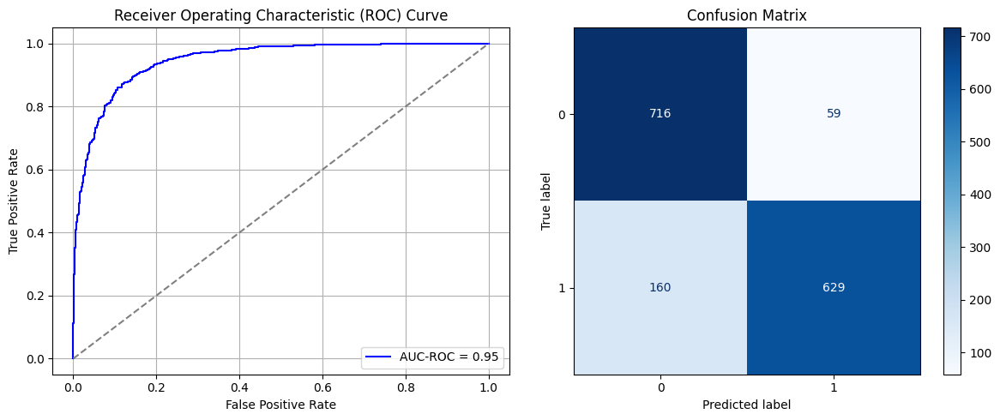

Best threshold based on F1-score: 0.24800395965576172
Time elapsed (performance): 16.79611679499999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7228 - loss: 0.6775 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7504 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7209 - loss: 0.6741 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6889 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7092 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7260 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7220 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7343 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.7587
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7508 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7059 - loss: 0.7195 - val_AUC: 0.0000e+00 - val_loss: 1.0056
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7048 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7090 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7110 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7218 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - AUC: 0.7237 - loss: 0.6941 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7477 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7166 - loss: 0.7030 - val_AUC: 0.0000e+00 - val_loss: 0.9675
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7017 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7606 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7124 - loss: 0.6918 - val_AUC: 0.0000e+00 - val_loss: 1.0208
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7165 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7302 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7319 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7300 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9804
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7253 - loss: 0.6875 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7121 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7323 - loss: 0.6661 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7169 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7137 - loss: 0.7025 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7035 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7536 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7251 - loss: 0.6803 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7290 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7419 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7003
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7362 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7494 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7568 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7448 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7141 - loss: 0.6951 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7177 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7182 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7230 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7467 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7341 - loss: 0.6625 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7157 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - AUC: 0.7176 - loss: 0.6819 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7145 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.9778
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7144 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7115 - loss: 0.6964 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7372 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7348 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7413 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7360 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.9825
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7353 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7162 - loss: 0.7000 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7188 - loss: 0.6909 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7280 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7125 - loss: 0.7310 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6966 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6958 - loss: 0.7047 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7122 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7395 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7745
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7316 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7391 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7481 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7466 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.6176 - loss: 0.6676 - val_AUC: 0.8233 - val_loss: 0.5631
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8260 - loss: 0.5141 - val_AUC: 0.8916 - val_loss: 0.4218
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8818 - loss: 0.4318 - val_AUC: 0.9154 - val_loss: 0.3902
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9093 - loss: 0.3830 - val_AUC: 0.9281 - val_loss: 0.3881
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9166 - loss: 0.3686 - val_AUC: 0.9398 - val_loss: 0.3297
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9302 - loss: 0.3380 - val_AUC: 0.9456 - val_loss: 0.3252
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9399 - loss: 0.3146 - val_AUC: 0.9453 - val_loss: 0.3025
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9423 - loss: 0.3067 - val_AUC: 0.9546 - val_loss: 0.2780
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

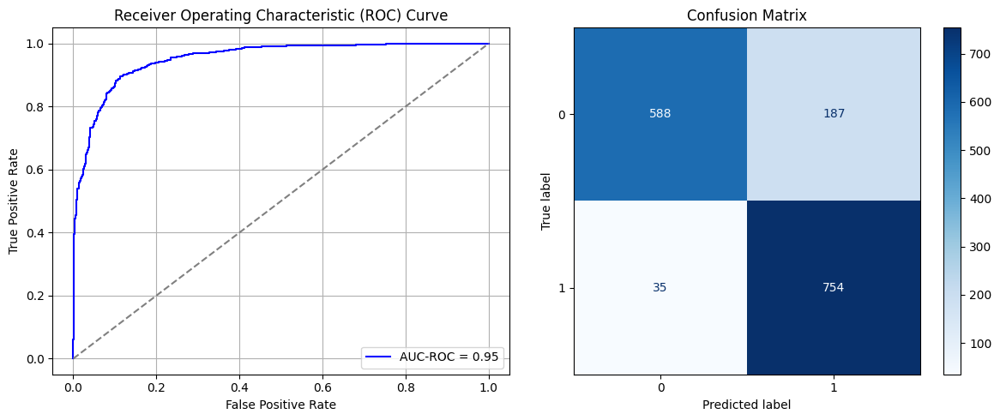

Best threshold based on F1-score: 0.7040166854858398
Time elapsed (performance): 13.751006509000035


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6732 - loss: 0.7910 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6693 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6860 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6817 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6730 - loss: 0.7920 - val_AUC: 0.0000e+00 - val_loss: 1.0802
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6615 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6915 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9525
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7428 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6672 - loss: 0.8019 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6749 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6836 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6806 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6623 - loss: 0.8065 - val_AUC: 0.0000e+00 - val_loss: 0.9379
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6724 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6775 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6947 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7081 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6813 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6732 - loss: 0.7998 - val_AUC: 0.0000e+00 - val_loss: 0.9917
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6873 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7043 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6933 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6983 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7147 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7112 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7099 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6671 - loss: 0.8222 - val_AUC: 0.0000e+00 - val_loss: 0.9744
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6752 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6984 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7100 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7111 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7133 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6727 - loss: 0.8027 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6676 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 1.0477
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7051 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7001 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.6722 - loss: 0.7798 - val_AUC: 0.0000e+00 - val_loss: 0.9731
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6700 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7069 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7159 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6627 - loss: 0.8158 - val_AUC: 0.0000e+00 - val_loss: 1.0035
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6835 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6911 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7039 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7011 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6601 - loss: 0.8080 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.9721
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6837 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7301 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6808 - loss: 0.7849 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6767 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6913 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 1.0535
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6721 - loss: 0.7983 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6637 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6926 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6895 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7440 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6607 - loss: 0.8157 - val_AUC: 0.0000e+00 - val_loss: 0.9322
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6502 - loss: 0.6580 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7272 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6520 - loss: 0.8519 - val_AUC: 0.0000e+00 - val_loss: 1.0090
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6585 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6957 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7011 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - AUC: 0.6637 - loss: 0.8066 - val_AUC: 0.0000e+00 - val_loss: 0.9587
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6772 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6919 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7067 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6553 - loss: 0.8273 - val_AUC: 0.0000e+00 - val_loss: 1.0396
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6819 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6671 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6899 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7030 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7173 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7285 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6796 - loss: 0.7799 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6673 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 1.0001
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6929 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6903 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7041 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7316 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9956
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7214 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - AUC: 0.6500 - loss: 0.8655 - val_AUC: 0.0000e+00 - val_loss: 0.9791
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6731 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6978 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6906 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7053 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7011 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7234 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6699 - loss: 0.7994 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6882 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6893 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6869 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7121 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7303 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6664 - loss: 0.8189 - val_AUC: 0.0000e+00 - val_loss: 1.1028
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6842 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7034 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6865 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7127 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

In [47]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)

In [48]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5688235294117647
Var: 0.009664996851333221


In [49]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.111535  0.546713
1   0.154433  0.480969
2   0.123928  0.519031
3   0.112488  0.564014
4   0.081030  0.615917
..       ...       ...
95  0.086749  0.598616
96  0.146806  0.463668
97  0.069590  0.622837
98  0.119161  0.522491
99  0.142993  0.477509

[100 rows x 2 columns]


## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [40]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)


3910
19400
4.961636828644501
1
[0, 4, 9, 14, 19, 24, 29, 34, 39, 44, 49, 54, 59, 64, 69, 74, 79, 84, 89, 94, 99, 104, 109, 114, 119, 124, 129, 133, 138, 143, 148, 153, 158, 163, 168, 173, 178, 183, 188, 193, 198, 203, 208, 213, 218, 223, 228, 233, 238, 243, 248, 253, 258, 262, 267, 272, 277, 282, 287, 292, 297, 302, 307, 312, 317, 322, 327, 332, 337, 342, 347, 352, 357, 362, 367, 372, 377, 382, 387, 391, 396, 401, 406, 411, 416, 421, 426, 431, 436, 441, 446, 451, 456, 461, 466, 471, 476, 481, 486, 491, 496, 501, 506, 511, 516, 520, 525, 530, 535, 540, 545, 550, 555, 560, 565, 570, 575, 580, 585, 590, 595, 600, 605, 610, 615, 620, 625, 630, 635, 640, 645, 649, 654, 659, 664, 669, 674, 679, 684, 689, 694, 699, 704, 709, 714, 719, 724, 729, 734, 739, 744, 749, 754, 759, 764, 769, 774, 778, 783, 788, 793, 798, 803, 808, 813, 818, 823, 828, 833, 838, 843, 848, 853, 858, 863, 868, 873, 878, 883, 888, 893, 898, 903, 907, 912, 917, 922, 927, 932, 937, 942, 947, 952, 957, 962, 967, 972, 977, 98

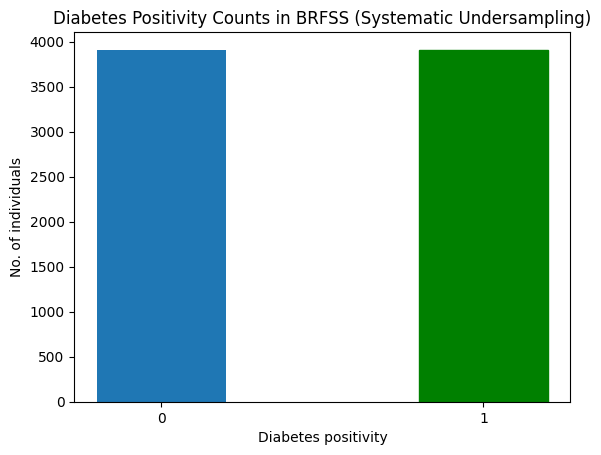

In [41]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Undersampling)")
plt.show()

In [42]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5948 - loss: 0.6823 - val_AUC: 0.7702 - val_loss: 0.5975
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7946 - loss: 0.5517 - val_AUC: 0.8674 - val_loss: 0.4776
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8629 - loss: 0.4631 - val_AUC: 0.8964 - val_loss: 0.5843
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.8986 - loss: 0.4074 - val_AUC: 0.9248 - val_loss: 0.3977
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.9092 - loss: 0.3837 - val_AUC: 0.9347 - val_loss: 0.3299
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9288 - loss: 0.3407 - val_AUC: 0.9499 - val_loss: 0.3361
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9376 - loss: 0.3208 - val_AUC: 0.9537 - val_loss: 0.2986
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9518 - loss: 0.2807 - val_AUC: 0.9541 - val_loss: 0.2873
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

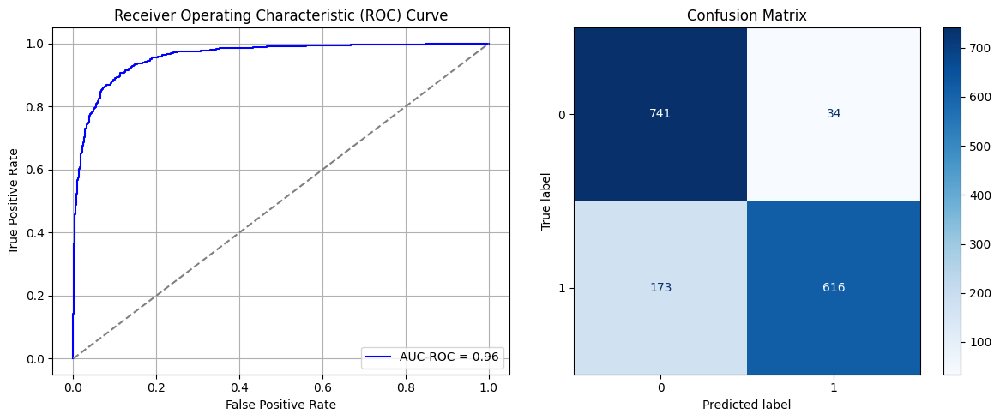

Best threshold based on F1-score: 0.223590686917305
Time elapsed (performance): 15.462203884999326


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7413 - loss: 0.6756 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7452 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7302 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7489 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7195 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7402 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7797
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7465 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7575 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7240 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7517 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7540 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7299 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7282 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7600 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7629
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7578 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7667
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7396 - loss: 0.6763 - val_AUC: 0.0000e+00 - val_loss: 0.9548
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7294 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7616 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7385 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7272 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9476
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7474 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7506 - loss: 0.6484 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7438 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7369 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7430 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7361 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7187 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7432 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7622 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.7381 - loss: 0.6667 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7464 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7471 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7380 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7456 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7372 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7489 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7568 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7312 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7436 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7371 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7567 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7523 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7419 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7469 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7391 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7455 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7452 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7385 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7283 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7467 - loss: 0.6643 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7563 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7393 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7531 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7510 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7503 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7291 - loss: 0.6888 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7576 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7275 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7317 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7364 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7459 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7215 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7781
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7349 - loss: 0.6781 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7187 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7451 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7238 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7251 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7526 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7363 - loss: 0.6882 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7434 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7296 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7231 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7647 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7420 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7288 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7401 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7423 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7537 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7422 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7537
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7433 - loss: 0.6822 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7358 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7287 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7066
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7421 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7262 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7532 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7516 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7549 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7448 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7562 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7500 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7476 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7485 - loss: 0.6534 - val_AUC: 0.0000e+00 - val_loss: 0.9748
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7628 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7322 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7491 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7439 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7230 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7447 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.6897
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7377 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7309 - loss: 0.6923 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7273 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7513 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7388 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7471 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7481 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7342 - loss: 0.6909 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7521 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7402 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7373 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7480 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7222 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7400 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7239 - loss: 0.7077 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7517 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7667
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7492 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7415 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7599 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7736
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7338 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7424 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7252 - loss: 0.7172 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7382 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7446 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7625 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7669
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7649 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7559
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7465 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7400 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7164 - loss: 0.7083 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7456 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7227 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7412 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7520 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7573 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7476 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7561 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6317 - loss: 0.6713 - val_AUC: 0.8138 - val_loss: 0.5367
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7991 - loss: 0.5440 - val_AUC: 0.8644 - val_loss: 0.4639
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8576 - loss: 0.4684 - val_AUC: 0.8958 - val_loss: 0.4197
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8899 - loss: 0.4209 - val_AUC: 0.9096 - val_loss: 0.4102
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8992 - loss: 0.4053 - val_AUC: 0.9161 - val_loss: 0.4063
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9063 - loss: 0.3966 - val_AUC: 0.9338 - val_loss: 0.3402
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9216 - loss: 0.3575 - val_AUC: 0.9291 - val_loss: 0.3407
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9310 - loss: 0.3345 - val_AUC: 0.9328 - val_loss: 0.3300
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

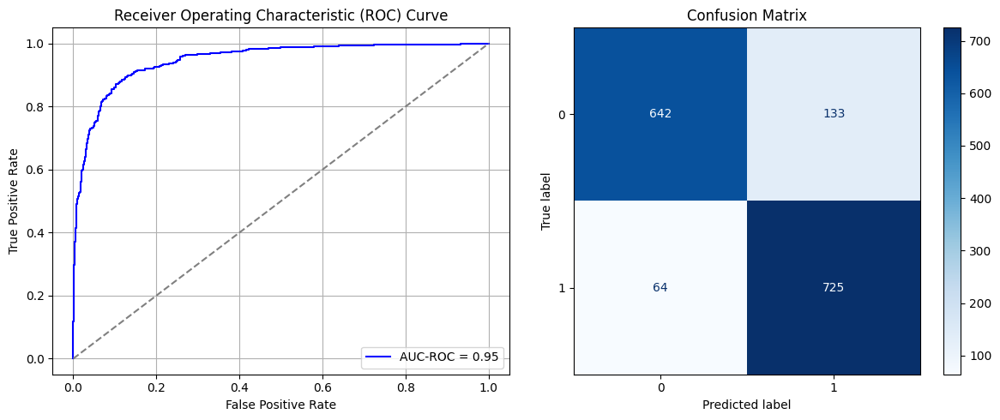

Best threshold based on F1-score: 0.5660980343818665
Time elapsed (performance): 14.121035864000078


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7009 - loss: 0.8014 - val_AUC: 0.0000e+00 - val_loss: 1.0425
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6989 - loss: 0.6405 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6982 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7159 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7279 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7023 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7120 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7133 - loss: 0.7692 - val_AUC: 0.0000e+00 - val_loss: 1.1115
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6969 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7003 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 1.0296
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7136 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7212 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7326 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6829 - loss: 0.8445 - val_AUC: 0.0000e+00 - val_loss: 1.0762
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7167 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6975 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7116 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7177 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7194 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7085 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6833 - loss: 0.8307 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6989 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.9803
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6934 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7185 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7205 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7102 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9553
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7182 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - AUC: 0.7149 - loss: 0.8069 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7168 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7044 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7205 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7079 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7127 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7231 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7236 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6952 - loss: 0.8341 - val_AUC: 0.0000e+00 - val_loss: 0.9994
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6831 - loss: 0.6841 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7035 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7117 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6991 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7077 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7174 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6992 - loss: 0.7894 - val_AUC: 0.0000e+00 - val_loss: 1.0593
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6964 - loss: 0.6495 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7095 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9783
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 1.0055
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7326 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7237 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7243 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7259 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6882 - loss: 0.8418 - val_AUC: 0.0000e+00 - val_loss: 1.0124
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6875 - loss: 0.6813 - val_AUC: 0.0000e+00 - val_loss: 0.9838
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7146 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7340 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7160 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7355 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6969 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7178 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6909 - loss: 0.8581 - val_AUC: 0.0000e+00 - val_loss: 1.0746
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.9672
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6855 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 1.0412
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7041 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9600
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7221 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6965 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7346 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7227 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7088 - loss: 0.7939 - val_AUC: 0.0000e+00 - val_loss: 1.0208
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7131 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7080 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7150 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7377 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7147 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7097 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7345 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7140 - loss: 0.7791 - val_AUC: 0.0000e+00 - val_loss: 1.0462
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7011 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7047 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7347 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7070 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7103 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7287 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7382 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7217 - loss: 0.7614 - val_AUC: 0.0000e+00 - val_loss: 1.1322
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7106 - loss: 0.6372 - val_AUC: 0.0000e+00 - val_loss: 1.0086
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7121 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7047 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.7539
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7246 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7661
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7147 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7143 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9999
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7199 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6967 - loss: 0.8244 - val_AUC: 0.0000e+00 - val_loss: 0.9997
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7053 - loss: 0.6462 - val_AUC: 0.0000e+00 - val_loss: 1.0162
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7221 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7099 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7028 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6998 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7249 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7271 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6955 - loss: 0.8238 - val_AUC: 0.0000e+00 - val_loss: 1.0073
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7038 - loss: 0.6445 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6923 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7081 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7303 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7344 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6988 - loss: 0.7979 - val_AUC: 0.0000e+00 - val_loss: 1.0231
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7133 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9873
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7196 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7126 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7001 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7336 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7072 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7106 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7008 - loss: 0.7886 - val_AUC: 0.0000e+00 - val_loss: 1.0164
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6976 - loss: 0.6501 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6893 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7117 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7207 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7108 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6956 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7048 - loss: 0.8200 - val_AUC: 0.0000e+00 - val_loss: 1.0460
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6925 - loss: 0.6618 - val_AUC: 0.0000e+00 - val_loss: 1.0532
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7074 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6957 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7084 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7116 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7370 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7076 - loss: 0.7902 - val_AUC: 0.0000e+00 - val_loss: 1.0120
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7218 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7240 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7105 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7098 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7075 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7214 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9606
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7115 - loss: 0.7923 - val_AUC: 0.0000e+00 - val_loss: 0.9805
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6961 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7300 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7103 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7192 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7178 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7235 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9506
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6926 - loss: 0.8142 - val_AUC: 0.0000e+00 - val_loss: 1.1016
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6983 - loss: 0.6582 - val_AUC: 0.0000e+00 - val_loss: 0.9500
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7033 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7222 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7190 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7206 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7192 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.5813 - loss: 0.6780 - val_AUC: 0.7748 - val_loss: 0.5862
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7722 - loss: 0.5747 - val_AUC: 0.8713 - val_loss: 0.4753
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8737 - loss: 0.4455 - val_AUC: 0.9192 - val_loss: 0.3830
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9066 - loss: 0.3899 - val_AUC: 0.9364 - val_loss: 0.3313
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9189 - loss: 0.3637 - val_AUC: 0.9320 - val_loss: 0.3478
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9279 - loss: 0.3432 - val_AUC: 0.9458 - val_loss: 0.3213
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9427 - loss: 0.3062 - val_AUC: 0.9467 - val_loss: 0.2968
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9488 - loss: 0.2886 - val_AUC: 0.9565 - val_loss: 0.2962
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

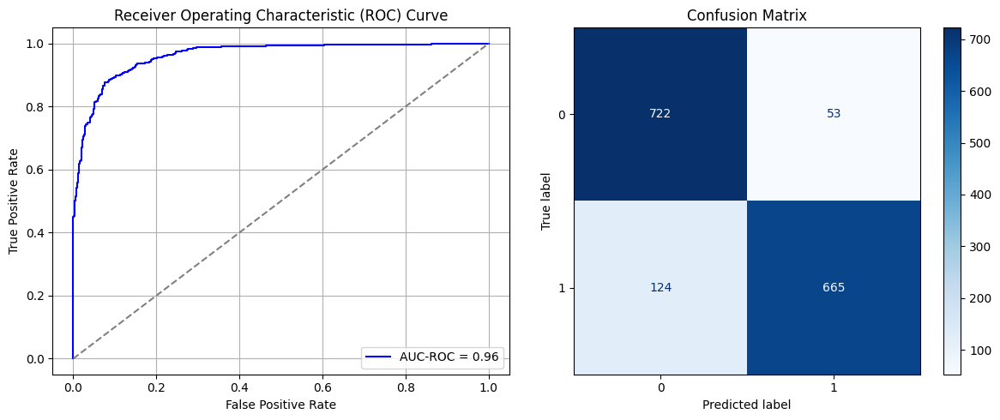

Best threshold based on F1-score: 0.42631712555885315
Time elapsed (performance): 15.66559871500067


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6990 - loss: 0.7246 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7409 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7238 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7227
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7489 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7474 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7036 - loss: 0.7280 - val_AUC: 0.0000e+00 - val_loss: 1.0387
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7102 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7347 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7228 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7291 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7591 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7306 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7790
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7324 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7192 - loss: 0.6901 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7060 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7134 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7475 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7433 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7541
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7033 - loss: 0.7386 - val_AUC: 0.0000e+00 - val_loss: 0.9876
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7018 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7458 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7532 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7424 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7462 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7174 - loss: 0.7085 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7282 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7352 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7139 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7743
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7446 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7241 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7550 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7536 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7306 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6993 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7482 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7337 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7466 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7453 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7419 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7528
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7476 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7387 - loss: 0.6727 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7358 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7313 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7589 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7445 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7491 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7552 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7400 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7242 - loss: 0.6910 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7306 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7240 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7396 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7351 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7537 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7563 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7530 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7059 - loss: 0.7200 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9323
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7109 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7167 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7148 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7510 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7387 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7551 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7186 - loss: 0.6837 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7493 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7513 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7453 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7679 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7435 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7545 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - AUC: 0.7347 - loss: 0.6723 - val_AUC: 0.0000e+00 - val_loss: 0.9695
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7281 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7378 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7406 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7468 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.7478
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7468 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7481 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7573 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7087 - loss: 0.6895 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7226 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7391 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7338 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7241 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7233 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7484 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7560 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7215 - loss: 0.6801 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7313 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7293 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7248 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7483 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7591 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7359 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7867
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7417 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.7798
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7102 - loss: 0.7214 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7234 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7179 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7308 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7517 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7535 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.7542
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7471 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7558 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - AUC: 0.7110 - loss: 0.7082 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7228 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7173 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7444 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7233 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7427 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7645
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7425 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7615 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7095 - loss: 0.7200 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7049 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7373 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7244 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7237 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7375 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7670
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7298 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7442 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7376 - loss: 0.6584 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7339 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7321 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7397 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7199 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7275 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7545 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7716 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7251 - loss: 0.6958 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7235 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7205 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7259 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8007
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7243 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7194
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7653 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7228 - loss: 0.7005 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7113 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7411 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7424 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7437 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7406 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7476
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7450 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7658 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7249 - loss: 0.6740 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7291 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7354 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7626 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7790
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7262 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7340 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7484 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7604 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5959 - loss: 0.6788 - val_AUC: 0.7640 - val_loss: 0.5905
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8046 - loss: 0.5414 - val_AUC: 0.8783 - val_loss: 0.4648
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8660 - loss: 0.4579 - val_AUC: 0.9085 - val_loss: 0.4030
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8997 - loss: 0.4018 - val_AUC: 0.9259 - val_loss: 0.3572
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.9139 - loss: 0.3747 - val_AUC: 0.9436 - val_loss: 0.3233
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.9351 - loss: 0.3287 - val_AUC: 0.9489 - val_loss: 0.3403
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9332 - loss: 0.3319 - val_AUC: 0.9596 - val_loss: 0.2697
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9438 - loss: 0.3022 - val_AUC: 0.9545 - val_loss: 0.2806
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

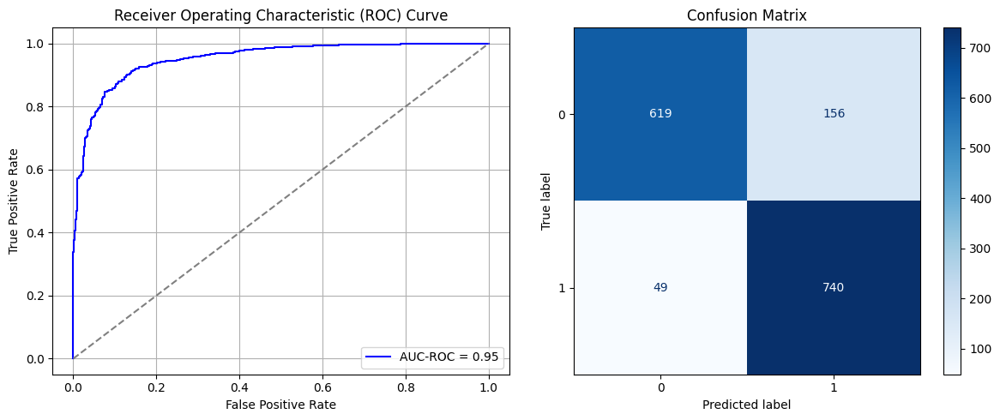

Best threshold based on F1-score: 0.5842490196228027
Time elapsed (performance): 18.235038483999233


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6499 - loss: 1.5285 - val_AUC: 0.0000e+00 - val_loss: 1.1272
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6787 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6808 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6595 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7105 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7050 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9401
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6949 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7040 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6367 - loss: 1.5589 - val_AUC: 0.0000e+00 - val_loss: 1.1158
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6937 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.9891
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6876 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.9628
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6910 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6871 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7226 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6926 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7107 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6539 - loss: 1.4737 - val_AUC: 0.0000e+00 - val_loss: 1.2242
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6835 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6757 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6762 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7055 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7004 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6844 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6994 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6352 - loss: 1.5058 - val_AUC: 0.0000e+00 - val_loss: 1.2048
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6703 - loss: 0.6487 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6800 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7066 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6794 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7105 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7193 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7159 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6412 - loss: 1.4782 - val_AUC: 0.0000e+00 - val_loss: 1.1712
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6914 - loss: 0.6404 - val_AUC: 0.0000e+00 - val_loss: 1.0645
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6700 - loss: 0.6382 - val_AUC: 0.0000e+00 - val_loss: 0.9805
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6872 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6924 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7236 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7286 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7227 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9748
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6595 - loss: 1.4685 - val_AUC: 0.0000e+00 - val_loss: 1.1758
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6756 - loss: 0.6518 - val_AUC: 0.0000e+00 - val_loss: 0.9764
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6641 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6804 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.9466
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6969 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6888 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7212 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6969 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6412 - loss: 1.4406 - val_AUC: 0.0000e+00 - val_loss: 1.2688
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6790 - loss: 0.6440 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6673 - loss: 0.6358 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6915 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6865 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7167 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6975 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.7630
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7007 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6462 - loss: 1.5200 - val_AUC: 0.0000e+00 - val_loss: 1.1644
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6710 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 0.9669
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6740 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 1.0262
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6950 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6827 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7032 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7039 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7093 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6410 - loss: 1.5463 - val_AUC: 0.0000e+00 - val_loss: 1.2638
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6828 - loss: 0.6686 - val_AUC: 0.0000e+00 - val_loss: 1.0541
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6662 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6907 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9583
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7046 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6859 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7013 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6383 - loss: 1.5308 - val_AUC: 0.0000e+00 - val_loss: 1.1286
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6537 - loss: 0.6773 - val_AUC: 0.0000e+00 - val_loss: 1.0012
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6849 - loss: 0.6391 - val_AUC: 0.0000e+00 - val_loss: 1.0083
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7048 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7004 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7083 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7284 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7068 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6443 - loss: 1.5244 - val_AUC: 0.0000e+00 - val_loss: 1.1836
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6568 - loss: 0.6692 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6776 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6904 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.6932 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6993 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7285 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7045 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6622 - loss: 1.4753 - val_AUC: 0.0000e+00 - val_loss: 1.1613
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6695 - loss: 0.6657 - val_AUC: 0.0000e+00 - val_loss: 1.0031
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6532 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6844 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6868 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7051 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7065 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7054 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6246 - loss: 1.4823 - val_AUC: 0.0000e+00 - val_loss: 1.2103
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6692 - loss: 0.6644 - val_AUC: 0.0000e+00 - val_loss: 0.9971
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6808 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6917 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6959 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6809 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9764
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7114 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7096 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6463 - loss: 1.5081 - val_AUC: 0.0000e+00 - val_loss: 1.1678
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6775 - loss: 0.6514 - val_AUC: 0.0000e+00 - val_loss: 1.0339
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6718 - loss: 0.6366 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6959 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9559
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7013 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6946 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7165 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7220 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6560 - loss: 1.4583 - val_AUC: 0.0000e+00 - val_loss: 1.2074
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6591 - loss: 0.6733 - val_AUC: 0.0000e+00 - val_loss: 1.0122
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6835 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9971
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6881 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6918 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6957 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6958 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6381 - loss: 1.4713 - val_AUC: 0.0000e+00 - val_loss: 1.2820
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6591 - loss: 0.6535 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6510 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7061 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6962 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7179 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9481
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7089 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7132 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6500 - loss: 1.4899 - val_AUC: 0.0000e+00 - val_loss: 1.2104
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6441 - loss: 0.6840 - val_AUC: 0.0000e+00 - val_loss: 1.0524
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6795 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6972 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 1.0045
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6719 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7063 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7123 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6968 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9546
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6496 - loss: 1.4726 - val_AUC: 0.0000e+00 - val_loss: 1.2310
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6885 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6909 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6933 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6851 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7048 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6814 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.9640
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6550 - loss: 1.3782 - val_AUC: 0.0000e+00 - val_loss: 1.3618
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6670 - loss: 0.6646 - val_AUC: 0.0000e+00 - val_loss: 0.9835
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6798 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6913 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6937 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 1.0232
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7023 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7051 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7212 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6577 - loss: 1.4430 - val_AUC: 0.0000e+00 - val_loss: 1.1699
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.6548 - loss: 0.6572 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6800 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 0.9813
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7055 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6980 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 1.0025
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7059 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7146 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9789
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7224 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - AUC: 0.6216 - loss: 0.6681 - val_AUC: 0.7952 - val_loss: 0.5810
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.8092 - loss: 0.5372 - val_AUC: 0.8649 - val_loss: 0.4690
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.8734 - loss: 0.4496 - val_AUC: 0.9036 - val_loss: 0.3972
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.8834 - loss: 0.4285 - val_AUC: 0.9245 - val_loss: 0.3994
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9104 - loss: 0.3839 - val_AUC: 0.9431 - val_loss: 0.3181
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9342 - loss: 0.3283 - val_AUC: 0.9439 - val_loss: 0.3053
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9360 - loss: 0.3247 - val_AUC: 0.9480 - val_loss: 0.3230
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.9420 - loss: 0.3076 - val_AUC: 0.9623 - val_loss: 0.2876
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step

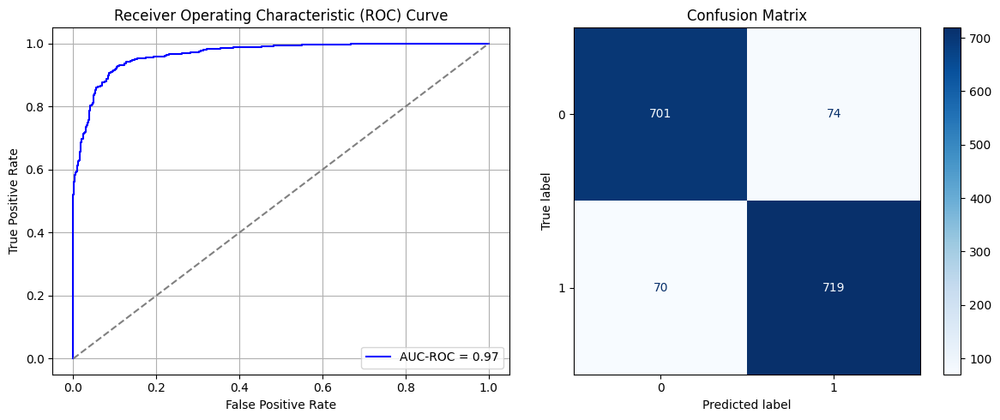

Best threshold based on F1-score: 0.46408161520957947
Time elapsed (performance): 26.658109291000073


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7083 - loss: 0.6833 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7163 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7149 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7213 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7168 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7386 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7261 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7567 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6934 - loss: 0.6952 - val_AUC: 0.0000e+00 - val_loss: 0.9323
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7198 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7178 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7302 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7321 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7327 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7619 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7374 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.6991 - loss: 0.6971 - val_AUC: 0.0000e+00 - val_loss: 0.9988
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7125 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7263 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7231 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7135 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7304 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7347 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7515 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - AUC: 0.7099 - loss: 0.6701 - val_AUC: 0.0000e+00 - val_loss: 0.9851
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7443 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7178 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7303 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7121 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7477 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7365 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7486 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6937 - loss: 0.6875 - val_AUC: 0.0000e+00 - val_loss: 0.9871
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7144 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6979 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7032 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7267 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7328 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7247 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7346 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6975 - loss: 0.6915 - val_AUC: 0.0000e+00 - val_loss: 0.9744
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7191 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7144 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7238 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7213 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7387 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7280 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7324 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7150 - loss: 0.6644 - val_AUC: 0.0000e+00 - val_loss: 1.0221
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6997 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7043 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7161 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7246 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7490 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7480 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7358 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7569
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6931 - loss: 0.6869 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7151 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.7729
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7363 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7170 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7411 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7143 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7383 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7285 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6946 - loss: 0.6951 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7029 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7250 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7204 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7396 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7087 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7358 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7515 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6802 - loss: 0.7179 - val_AUC: 0.0000e+00 - val_loss: 0.9753
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7052 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7429 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7250 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7462 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7381 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7385 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7537 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.7277 - loss: 0.6491 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6954 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 0.9435
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7083 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - AUC: 0.7257 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7328 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7316 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7270 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7450 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6990 - loss: 0.6930 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7024 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8149
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7171 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7163 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7412 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7276 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7475 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7221 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7109 - loss: 0.6696 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6890 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7027 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7227 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7358 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7220 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7599 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7262 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.6843 - loss: 0.6945 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6863 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7066 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7163 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7250 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7388 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7321 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7398 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7202 - loss: 0.6571 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7125 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7132 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7449 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7288 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7354 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7382
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7532 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7341 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6838 - loss: 0.7086 - val_AUC: 0.0000e+00 - val_loss: 1.0051
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7163 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7011 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7085 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7212 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7053 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7219 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7467 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7120 - loss: 0.6727 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6912 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7199 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7453 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7125 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7355 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7404 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6946 - loss: 0.6899 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7117 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7075 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7223 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7259 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7391 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7281 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7191 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7586
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7149 - loss: 0.6550 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7240 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6944 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7204 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7545 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7452 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7437 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7143 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7101 - loss: 0.6941 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7180 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7075 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7074 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7243 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7338 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7455 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7646 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━

In [43]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [44]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5623875432525951
Var: 0.007099274252565039


In [45]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.110582  0.463668
1   0.144900  0.432526
2   0.126787  0.446367
3   0.107722  0.470588
4   0.150620  0.422145
..       ...       ...
95  0.111535  0.543253
96  0.087703  0.591696
97  0.099142  0.570934
98  0.110582  0.532872
99  0.105815  0.543253

[100 rows x 2 columns]


## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

In [46]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full.iloc[:,-1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train.iloc[:,-1], 10)
print(y_T_train_Sy)

3910
19400
4.961636828644501
[3, 7, 12, 17, 22, 27, 32, 37, 42, 47, 52, 57, 62, 67, 72, 77, 82, 87, 92, 97, 102, 107, 112, 117, 122, 127, 132, 136, 141, 146, 151, 156, 161, 166, 171, 176, 181, 186, 191, 196, 201, 206, 211, 216, 221, 226, 231, 236, 241, 246, 251, 256, 261, 265, 270, 275, 280, 285, 290, 295, 300, 305, 310, 315, 320, 325, 330, 335, 340, 345, 350, 355, 360, 365, 370, 375, 380, 385, 390, 394, 399, 404, 409, 414, 419, 424, 429, 434, 439, 444, 449, 454, 459, 464, 469, 474, 479, 484, 489, 494, 499, 504, 509, 514, 519, 523, 528, 533, 538, 543, 548, 553, 558, 563, 568, 573, 578, 583, 588, 593, 598, 603, 608, 613, 618, 623, 628, 633, 638, 643, 648, 652, 657, 662, 667, 672, 677, 682, 687, 692, 697, 702, 707, 712, 717, 722, 727, 732, 737, 742, 747, 752, 757, 762, 767, 772, 777, 781, 786, 791, 796, 801, 806, 811, 816, 821, 826, 831, 836, 841, 846, 851, 856, 861, 866, 871, 876, 881, 886, 891, 896, 901, 906, 910, 915, 920, 925, 930, 935, 940, 945, 950, 955, 960, 965, 970, 975, 980, 98

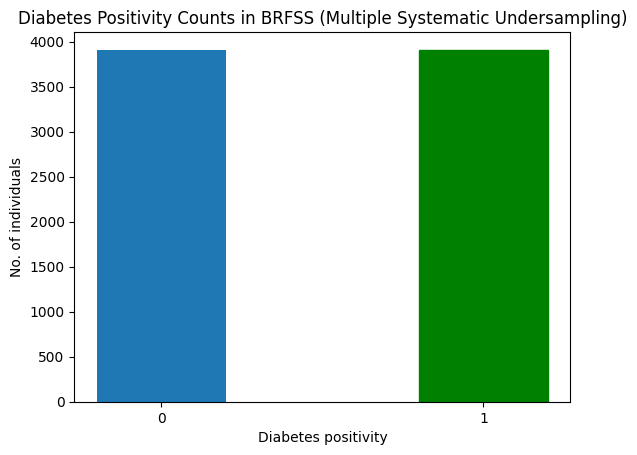

In [47]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [48]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - AUC: 0.6874 - loss: 0.6490 - val_AUC: 0.8497 - val_loss: 0.4982
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8328 - loss: 0.5017 - val_AUC: 0.9011 - val_loss: 0.4070
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8972 - loss: 0.4061 - val_AUC: 0.9311 - val_loss: 0.3406
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9229 - loss: 0.3537 - val_AUC: 0.9418 - val_loss: 0.3180
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9434 - loss: 0.3046 - val_AUC: 0.9540 - val_loss: 0.2757
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.9513 - loss: 0.2828 - val_AUC: 0.9581 - val_loss: 0.3069
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.9513 - loss: 0.2832 - val_AUC: 0.9658 - val_loss: 0.2441
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.9609 - loss: 0.2537 - val_AUC: 0.9611 - val_loss: 0.2816
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/st

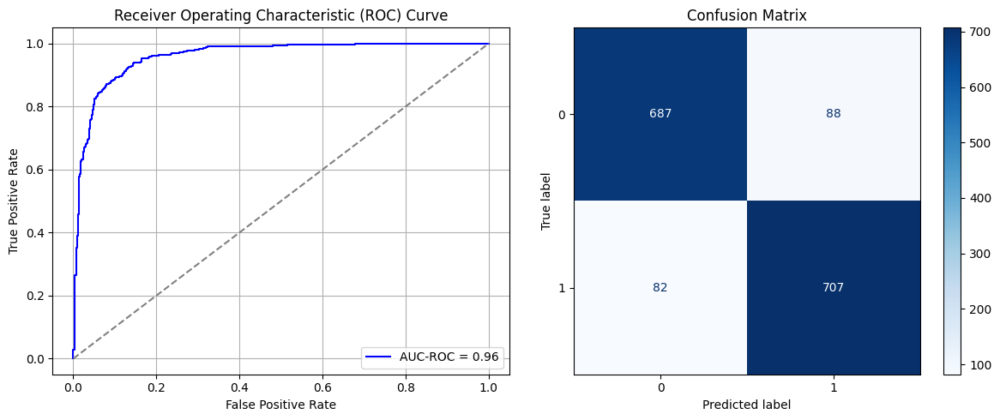

Best threshold based on F1-score: 0.32607874274253845
Time elapsed (performance): 26.821687711999402


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7447 - loss: 0.8371 - val_AUC: 0.0000e+00 - val_loss: 1.0304
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7395 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7246 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7629 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7502 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7535 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7574 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7499 - loss: 0.8166 - val_AUC: 0.0000e+00 - val_loss: 1.1218
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7484 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7684 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7466 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7648 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7553 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7542 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7307 - loss: 0.8424 - val_AUC: 0.0000e+00 - val_loss: 1.1118
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7422 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.7665
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7542 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7489 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.7515
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7555 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7411 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7635 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7592 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7434 - loss: 0.8127 - val_AUC: 0.0000e+00 - val_loss: 0.9928
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7513 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7437 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7600 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7591 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7573 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7457 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7458 - loss: 0.8448 - val_AUC: 0.0000e+00 - val_loss: 1.1156
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7118 - loss: 0.6498 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7475 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7505 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7439 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7443 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7547 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7537 - loss: 0.7795 - val_AUC: 0.0000e+00 - val_loss: 0.9990
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7552 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7541 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7473 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7299 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7597 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7653 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7522
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7312 - loss: 0.8500 - val_AUC: 0.0000e+00 - val_loss: 1.0452
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7445 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7516 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7653 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7751 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7480 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7562 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7614 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.7337 - loss: 0.8320 - val_AUC: 0.0000e+00 - val_loss: 0.9819
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7527 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7485 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7456 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7568 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7519 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7405 - loss: 0.8059 - val_AUC: 0.0000e+00 - val_loss: 1.0840
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7372 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7447 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7234 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7709 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7499 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7576 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7258 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7247 - loss: 0.8840 - val_AUC: 0.0000e+00 - val_loss: 1.1081
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7423 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7479 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7585 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7490 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7545 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7485 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7573 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7362 - loss: 0.8519 - val_AUC: 0.0000e+00 - val_loss: 1.0254
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7373 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7566 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7659 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7521 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7551 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7553 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7518
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7461 - loss: 0.8061 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7500 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7479 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7466 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7306 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7603 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7453 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7590 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7427 - loss: 0.8408 - val_AUC: 0.0000e+00 - val_loss: 1.0668
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7561 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7509 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7652 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7767 - loss: 0.5287 - val_AUC: 0.0000e+00 - val_loss: 0.7251
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7384 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7637 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7708 - loss: 0.5303 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7472 - loss: 0.8047 - val_AUC: 0.0000e+00 - val_loss: 1.1021
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7558 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7610 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7464 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7440
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7681 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7790
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7539 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7419 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7675 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7422 - loss: 0.8501 - val_AUC: 0.0000e+00 - val_loss: 1.0806
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7208 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7222 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7287 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7618
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7540 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7635 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7516 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7578 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1582 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1583 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1588 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7496 - loss: 0.7917 - val_AUC: 0.0000e+00 - val_loss: 1.0994
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7326 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7547 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7460 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7423 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7454 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7436 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7629 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1590 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1595 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7302 - loss: 0.8742 - val_AUC: 0.0000e+00 - val_loss: 1.0038
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7541 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7490 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7286 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7539 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7573 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7553 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7649 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1596 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1597 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1602 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7592 - loss: 0.7748 - val_AUC: 0.0000e+00 - val_loss: 1.0644
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7514 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7472 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7464 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7573 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7534 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7813 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7616 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1603 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1604 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1609 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7397 - loss: 0.8598 - val_AUC: 0.0000e+00 - val_loss: 1.1325
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7373 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7471 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7472 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7581 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7477 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7648 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7853 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1610 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1611 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1616 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.7478 - loss: 0.8359 - val_AUC: 0.0000e+00 - val_loss: 1.0705
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7224 - loss: 0.6371 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7400 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7384 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7489 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7717 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7713 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7461 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1617 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1618 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1623 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.6361 - loss: 0.6596 - val_AUC: 0.8549 - val_loss: 0.4996
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.8063 - loss: 0.5375 - val_AUC: 0.8870 - val_loss: 0.4615
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.8572 - loss: 0.4709 - val_AUC: 0.8944 - val_loss: 0.4220
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8822 - loss: 0.4321 - val_AUC: 0.9130 - val_loss: 0.3767
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8958 - loss: 0.4061 - val_AUC: 0.9260 - val_loss: 0.4289
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9077 - loss: 0.3874 - val_AUC: 0.9331 - val_loss: 0.3764
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9302 - loss: 0.3404 - val_AUC: 0.9479 - val_loss: 0.3714
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9411 - loss: 0.3147 - val_AUC: 0.9394 - val_loss: 0.3269
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

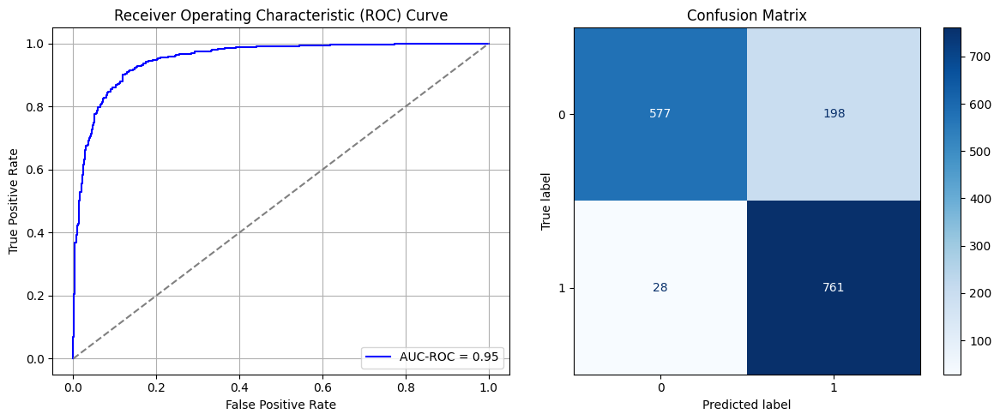

Best threshold based on F1-score: 0.7841030359268188
Time elapsed (performance): 19.290713028000027


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1625 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1630 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6702 - loss: 0.9102 - val_AUC: 0.0000e+00 - val_loss: 1.0470
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6798 - loss: 0.6590 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6898 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6892 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6818 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6895 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6833 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7094 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1631 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1632 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1637 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - AUC: 0.6602 - loss: 0.9441 - val_AUC: 0.0000e+00 - val_loss: 1.1709
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6682 - loss: 0.6653 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6780 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6816 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6788 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6690 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7142 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6864 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6707 - loss: 0.8971 - val_AUC: 0.0000e+00 - val_loss: 1.0889
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6861 - loss: 0.6509 - val_AUC: 0.0000e+00 - val_loss: 0.9511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6797 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6833 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6740 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6758 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6854 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6933 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6536 - loss: 0.9513 - val_AUC: 0.0000e+00 - val_loss: 1.0880
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6570 - loss: 0.6679 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6667 - loss: 0.6324 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6715 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6377 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6786 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6771 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6866 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6533 - loss: 0.9767 - val_AUC: 0.0000e+00 - val_loss: 1.1459
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6505 - loss: 0.6987 - val_AUC: 0.0000e+00 - val_loss: 0.9646
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6681 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6793 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6998 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6794 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6781 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6890 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6649 - loss: 0.9237 - val_AUC: 0.0000e+00 - val_loss: 1.0283
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6691 - loss: 0.6770 - val_AUC: 0.0000e+00 - val_loss: 1.0013
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6860 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6684 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6648 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6887 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7053 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6945 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6513 - loss: 0.9673 - val_AUC: 0.0000e+00 - val_loss: 1.0783
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6696 - loss: 0.6731 - val_AUC: 0.0000e+00 - val_loss: 0.9307
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6814 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.9494
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6902 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6837 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6798 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6825 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7065 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6556 - loss: 0.9358 - val_AUC: 0.0000e+00 - val_loss: 1.1020
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6749 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6622 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6821 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6977 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6738 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6909 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6722 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6716 - loss: 0.9260 - val_AUC: 0.0000e+00 - val_loss: 1.1211
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6795 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6616 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6789 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6580 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6829 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6844 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6976 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6332 - loss: 0.9793 - val_AUC: 0.0000e+00 - val_loss: 1.1483
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6708 - loss: 0.6665 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6668 - loss: 0.6253 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6531 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6986 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 1.0035
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6749 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6675 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6743 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6663 - loss: 0.9238 - val_AUC: 0.0000e+00 - val_loss: 1.0992
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6760 - loss: 0.6671 - val_AUC: 0.0000e+00 - val_loss: 1.0104
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6927 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6820 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6696 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6825 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6795 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6732 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6886 - loss: 0.8840 - val_AUC: 0.0000e+00 - val_loss: 1.0405
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6773 - loss: 0.6534 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6672 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6885 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6838 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6581 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6681 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6826 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6560 - loss: 0.9747 - val_AUC: 0.0000e+00 - val_loss: 1.0179
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6640 - loss: 0.6764 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6820 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6737 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6502 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6840 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6910 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6952 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6407 - loss: 0.9606 - val_AUC: 0.0000e+00 - val_loss: 1.0728
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6662 - loss: 0.6696 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6792 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6712 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9775
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6836 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6862 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6613 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6902 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6711 - loss: 0.9258 - val_AUC: 0.0000e+00 - val_loss: 1.0546
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6866 - loss: 0.6427 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6695 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6879 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6896 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6638 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6707 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7029 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.7574
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6488 - loss: 0.9472 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6564 - loss: 0.6890 - val_AUC: 0.0000e+00 - val_loss: 0.9763
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6814 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6805 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6910 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6909 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.9859
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7054 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6951 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6607 - loss: 0.9514 - val_AUC: 0.0000e+00 - val_loss: 1.1041
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6909 - loss: 0.6450 - val_AUC: 0.0000e+00 - val_loss: 0.9909
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6821 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6566 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6669 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6824 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6819 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6934 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6653 - loss: 0.9405 - val_AUC: 0.0000e+00 - val_loss: 1.0213
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6662 - loss: 0.6656 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6777 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6744 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6792 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6904 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6779 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6934 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6568 - loss: 0.9329 - val_AUC: 0.0000e+00 - val_loss: 1.1090
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6494 - loss: 0.6850 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6590 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6946 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6748 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6877 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6667 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6898 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6582 - loss: 0.9701 - val_AUC: 0.0000e+00 - val_loss: 1.0938
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6594 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6779 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6928 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6691 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6844 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6954 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6750 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.6616 - loss: 0.6561 - val_AUC: 0.8455 - val_loss: 0.5337
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8217 - loss: 0.5199 - val_AUC: 0.8845 - val_loss: 0.4358
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8747 - loss: 0.4442 - val_AUC: 0.8965 - val_loss: 0.4184
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8763 - loss: 0.4405 - val_AUC: 0.9169 - val_loss: 0.3740
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9123 - loss: 0.3763 - val_AUC: 0.9279 - val_loss: 0.4668
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9088 - loss: 0.3856 - val_AUC: 0.9333 - val_loss: 0.3487
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9260 - loss: 0.3469 - val_AUC: 0.9421 - val_loss: 0.3101
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.9340 - loss: 0.3276 - val_AUC: 0.9479 - val_loss: 0.2983
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step -

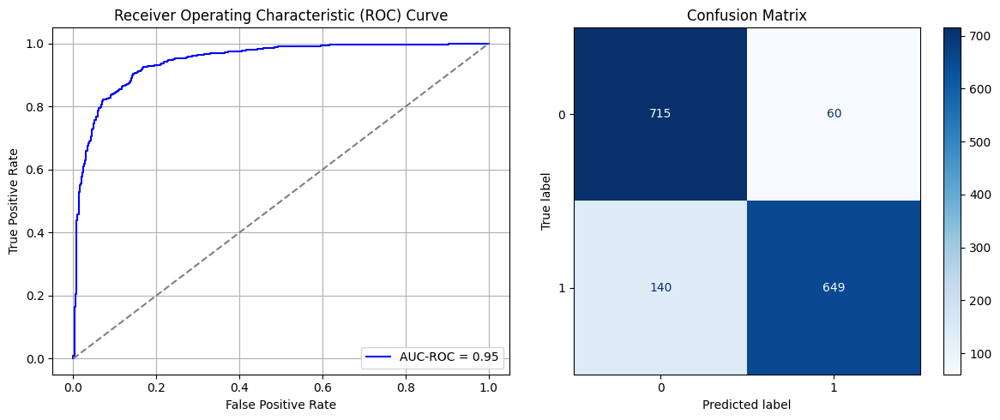

Best threshold based on F1-score: 0.22726798057556152
Time elapsed (performance): 18.975232646000222


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6857 - loss: 0.8762 - val_AUC: 0.0000e+00 - val_loss: 1.0986
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7150 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7287 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7306 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7170 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7340 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7241 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7139 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6663 - loss: 0.8942 - val_AUC: 0.0000e+00 - val_loss: 1.0646
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7135 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7075 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6919 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7108 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7353 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6810 - loss: 0.9045 - val_AUC: 0.0000e+00 - val_loss: 1.0473
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7120 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7103 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6980 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7279 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7237 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7346 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.6651 - loss: 0.9647 - val_AUC: 0.0000e+00 - val_loss: 1.0321
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7036 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7126 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7138 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7182 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6807 - loss: 0.9306 - val_AUC: 0.0000e+00 - val_loss: 1.0851
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6904 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7176 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7134 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7370 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7291 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7323 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6557 - loss: 0.9480 - val_AUC: 0.0000e+00 - val_loss: 1.0544
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7149 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7330 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7315 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7136 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7082 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7307 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6891 - loss: 0.9026 - val_AUC: 0.0000e+00 - val_loss: 1.0519
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6989 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.9892
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7107 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6954 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7314 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7300 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7169 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7405 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7077 - loss: 0.8484 - val_AUC: 0.0000e+00 - val_loss: 1.0632
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7172 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7160 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7090 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7092 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7601 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7067 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7448 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6897 - loss: 0.9038 - val_AUC: 0.0000e+00 - val_loss: 1.0547
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7353 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6917 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7253 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7242 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7254 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7287 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7497 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6764 - loss: 0.9041 - val_AUC: 0.0000e+00 - val_loss: 1.0784
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7127 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6996 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7064 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7115 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7411 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7186 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6853 - loss: 0.9082 - val_AUC: 0.0000e+00 - val_loss: 1.0180
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6958 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.9567
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6992 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7131 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7102 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7234 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7509 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7370 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6784 - loss: 0.8944 - val_AUC: 0.0000e+00 - val_loss: 1.0192
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6993 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7151 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9450
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7256 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7170 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7177 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7432 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7355 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6864 - loss: 0.8369 - val_AUC: 0.0000e+00 - val_loss: 1.1086
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7154 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6788 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7227 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7214 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7287 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7346 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7256 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - AUC: 0.6847 - loss: 0.8792 - val_AUC: 0.0000e+00 - val_loss: 1.0453
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7154 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7227 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7237 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7023 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7153 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7197 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7317 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6899 - loss: 0.8801 - val_AUC: 0.0000e+00 - val_loss: 1.0635
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7300 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7104 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6920 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7273 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7315 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7308 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7376 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.6726 - loss: 0.9102 - val_AUC: 0.0000e+00 - val_loss: 1.0230
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7215 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6965 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7240 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7097 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7286 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7396 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6935 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6600 - loss: 0.9608 - val_AUC: 0.0000e+00 - val_loss: 1.0712
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6959 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9304
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7225 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7253 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7421 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7419 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7315 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7310 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6644 - loss: 0.9038 - val_AUC: 0.0000e+00 - val_loss: 1.0537
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7223 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6948 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7448 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7187 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7145 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7388 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7360 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6641 - loss: 0.9050 - val_AUC: 0.0000e+00 - val_loss: 1.0660
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6901 - loss: 0.6398 - val_AUC: 0.0000e+00 - val_loss: 0.9520
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7152 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7094 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7302 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7215 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7295 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7258 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7096 - loss: 0.8619 - val_AUC: 0.0000e+00 - val_loss: 1.0932
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6801 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7142 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7297 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7375 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7217 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7274 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7347 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - AUC: 0.6383 - loss: 0.6663 - val_AUC: 0.8492 - val_loss: 0.5003
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8227 - loss: 0.5169 - val_AUC: 0.8842 - val_loss: 0.4423
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8521 - loss: 0.4792 - val_AUC: 0.9103 - val_loss: 0.4173
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8823 - loss: 0.4313 - val_AUC: 0.9272 - val_loss: 0.3670
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9067 - loss: 0.3871 - val_AUC: 0.9403 - val_loss: 0.3270
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9180 - loss: 0.3640 - val_AUC: 0.9484 - val_loss: 0.2996
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9358 - loss: 0.3236 - val_AUC: 0.9558 - val_loss: 0.2841
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9407 - loss: 0.3115 - val_AUC: 0.9505 - val_loss: 0.2977
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step -

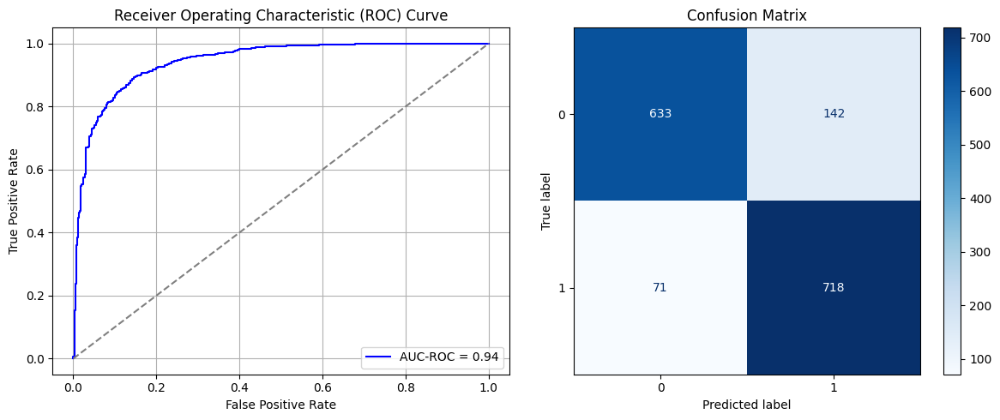

Best threshold based on F1-score: 0.5790119171142578
Time elapsed (performance): 19.451894894998986


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6517 - loss: 1.5510 - val_AUC: 0.0000e+00 - val_loss: 1.0431
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6791 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6895 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7244 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7390 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7198 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7149 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6676 - loss: 1.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9979
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6746 - loss: 0.6355 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7033 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7046 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9769
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7109 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 1.0474
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7149 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9719
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7119 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7060 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6626 - loss: 1.5522 - val_AUC: 0.0000e+00 - val_loss: 1.0766
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6575 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7156 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7010 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6953 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7125 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9560
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7141 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7132 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6550 - loss: 1.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9829
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7044 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6804 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 1.0171
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6917 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6941 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7053 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7115 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7453 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9793
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6559 - loss: 1.5812 - val_AUC: 0.0000e+00 - val_loss: 1.0500
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6832 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7014 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7059 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7110 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7078 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7280 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7118 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.6746 - loss: 1.5521 - val_AUC: 0.0000e+00 - val_loss: 1.0206
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.6776 - loss: 0.6473 - val_AUC: 0.0000e+00 - val_loss: 0.9843
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.6985 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6883 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6970 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7014 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7146 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7202 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6454 - loss: 1.5331 - val_AUC: 0.0000e+00 - val_loss: 1.0423
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6899 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6852 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7021 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9716
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7010 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7186 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7200 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7182 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6776 - loss: 1.4598 - val_AUC: 0.0000e+00 - val_loss: 1.0636
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6768 - loss: 0.6355 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7180 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7053 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7192 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7268 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7218 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7424 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6534 - loss: 1.5549 - val_AUC: 0.0000e+00 - val_loss: 1.0300
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6776 - loss: 0.6427 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6925 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7070 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7364 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9588
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6996 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 1.0340
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6982 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7009 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6548 - loss: 1.5411 - val_AUC: 0.0000e+00 - val_loss: 1.0002
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6734 - loss: 0.6376 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6843 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.9938
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7181 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9904
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6992 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 1.0025
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7077 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 0.9691
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6902 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7369 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6489 - loss: 1.6027 - val_AUC: 0.0000e+00 - val_loss: 1.0207
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6847 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.9569
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7025 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7215 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7098 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7208 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6996 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6612 - loss: 1.5386 - val_AUC: 0.0000e+00 - val_loss: 1.1030
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6857 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7045 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6997 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6980 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7301 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7051 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9889
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6558 - loss: 1.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9880
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6988 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9768
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7127 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7015 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.9384
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7123 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7281 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7394 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6545 - loss: 1.5754 - val_AUC: 0.0000e+00 - val_loss: 1.0182
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6802 - loss: 0.6401 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7025 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7055 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9779
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7024 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7127 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7266 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7279 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6493 - loss: 1.5669 - val_AUC: 0.0000e+00 - val_loss: 1.0339
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6656 - loss: 0.6709 - val_AUC: 0.0000e+00 - val_loss: 1.0015
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6896 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6858 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7042 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7189 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7237 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7011 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6423 - loss: 1.5806 - val_AUC: 0.0000e+00 - val_loss: 1.0342
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7045 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6905 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7175 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9796
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7048 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7154 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7129 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6676 - loss: 1.4936 - val_AUC: 0.0000e+00 - val_loss: 1.0296
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7018 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7136 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7179 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7054 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9958
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7274 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7339 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7219 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6527 - loss: 1.5435 - val_AUC: 0.0000e+00 - val_loss: 1.0332
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7001 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6778 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6996 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7325 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7203 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7234 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7220 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6688 - loss: 1.5285 - val_AUC: 0.0000e+00 - val_loss: 1.0682
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6955 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 1.0957
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6868 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9617
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7278 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6974 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7181 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7193 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6623 - loss: 1.5378 - val_AUC: 0.0000e+00 - val_loss: 1.0475
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6712 - loss: 0.6491 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6909 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6931 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7053 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7228 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9252
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7031 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7205 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.6389 - loss: 0.6631 - val_AUC: 0.8308 - val_loss: 0.5180
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.8323 - loss: 0.5052 - val_AUC: 0.9040 - val_loss: 0.4876
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.8635 - loss: 0.4617 - val_AUC: 0.9142 - val_loss: 0.3976
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8945 - loss: 0.4093 - val_AUC: 0.9295 - val_loss: 0.3471
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9187 - loss: 0.3639 - val_AUC: 0.9414 - val_loss: 0.3571
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9261 - loss: 0.3467 - val_AUC: 0.9453 - val_loss: 0.3294
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9305 - loss: 0.3382 - val_AUC: 0.9499 - val_loss: 0.3139
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9396 - loss: 0.3136 - val_AUC: 0.9412 - val_loss: 0.3383
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

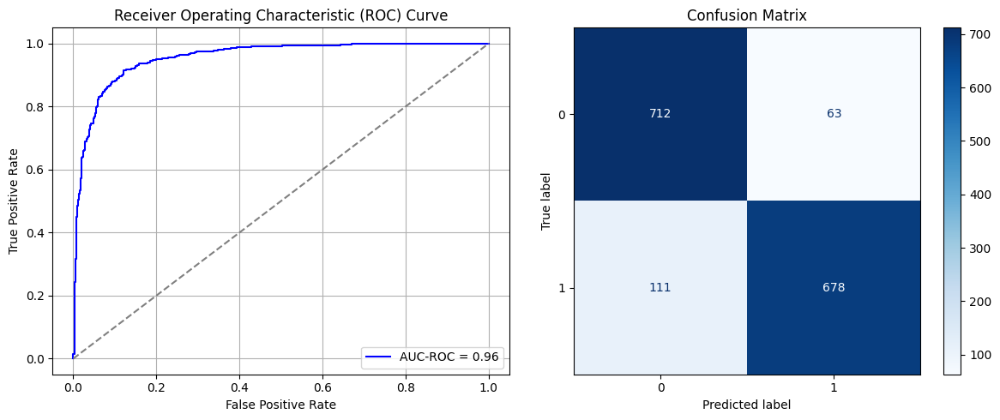

Best threshold based on F1-score: 0.36973103880882263
Time elapsed (performance): 19.885354822999943


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6705 - loss: 0.9764 - val_AUC: 0.0000e+00 - val_loss: 1.0220
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6931 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6997 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7013 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6661 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6823 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6817 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7072 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6713 - loss: 0.9625 - val_AUC: 0.0000e+00 - val_loss: 1.0096
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6795 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 1.0256
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.6799 - loss: 0.6248 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6939 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.9465
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6799 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6865 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7031 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7048 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7741
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6865 - loss: 0.9216 - val_AUC: 0.0000e+00 - val_loss: 0.9984
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6908 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6748 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 1.0292
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6868 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6958 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7030 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7018 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6690 - loss: 0.9254 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6989 - loss: 0.6367 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7105 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7127 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6931 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7001 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7076 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6909 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6648 - loss: 0.9506 - val_AUC: 0.0000e+00 - val_loss: 0.9627
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6849 - loss: 0.6512 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7117 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6766 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6935 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7040 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9476
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7344 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6568 - loss: 0.9587 - val_AUC: 0.0000e+00 - val_loss: 1.0188
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7004 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6907 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6716 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6928 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7187 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7107 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6975 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7698
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6824 - loss: 0.9142 - val_AUC: 0.0000e+00 - val_loss: 1.0134
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6710 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.9587
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7000 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6968 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6851 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6954 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7143 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7071 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.7498
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6660 - loss: 0.9495 - val_AUC: 0.0000e+00 - val_loss: 0.9995
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6780 - loss: 0.6642 - val_AUC: 0.0000e+00 - val_loss: 0.9639
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6966 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6910 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6938 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7080 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7021 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7023 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6625 - loss: 0.9569 - val_AUC: 0.0000e+00 - val_loss: 1.0142
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6879 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6972 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6753 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7106 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6854 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7017 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7204 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7153 - loss: 0.8311 - val_AUC: 0.0000e+00 - val_loss: 1.0274
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7020 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6762 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7085 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7067 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6757 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7052 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7071 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6836 - loss: 0.8808 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6900 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 0.9764
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6825 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6983 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7017 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6932 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6914 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6785 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6676 - loss: 0.9544 - val_AUC: 0.0000e+00 - val_loss: 1.0343
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6823 - loss: 0.6395 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6902 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7143 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7042 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7008 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7018 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7110 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.6683 - loss: 0.9124 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7124 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7047 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.6955 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6948 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7137 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6714 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7070 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6698 - loss: 0.9043 - val_AUC: 0.0000e+00 - val_loss: 1.0107
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6903 - loss: 0.6439 - val_AUC: 0.0000e+00 - val_loss: 0.9824
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6736 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6761 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6783 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6946 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7101 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6698 - loss: 0.9466 - val_AUC: 0.0000e+00 - val_loss: 0.9918
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6670 - loss: 0.6541 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6699 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7112 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6876 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7032 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7211 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7117 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6712 - loss: 0.9376 - val_AUC: 0.0000e+00 - val_loss: 0.9692
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6838 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6841 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6890 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6972 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6851 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6931 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7023 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - AUC: 0.6594 - loss: 0.9401 - val_AUC: 0.0000e+00 - val_loss: 1.0149
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6624 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7005 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7052 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6764 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6872 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7080 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7119 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6708 - loss: 0.9248 - val_AUC: 0.0000e+00 - val_loss: 1.0101
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6693 - loss: 0.6652 - val_AUC: 0.0000e+00 - val_loss: 0.9511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6828 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7106 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6826 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7082 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6941 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7183 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - AUC: 0.6704 - loss: 0.8928 - val_AUC: 0.0000e+00 - val_loss: 0.9974
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6911 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6873 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6816 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9333
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6875 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7039 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6911 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9285
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6828 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - AUC: 0.6542 - loss: 0.9500 - val_AUC: 0.0000e+00 - val_loss: 1.0469
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6630 - loss: 0.6631 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6793 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6934 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7003 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6933 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6849 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6942 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 

In [49]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [50]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5647058823529413
Var: 0.005550651448090416


In [51]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.118208  0.522491
1   0.114395  0.532872
2   0.130601  0.494810
3   0.090562  0.588235
4   0.106768  0.564014
..       ...       ...
95  0.125834  0.608997
96  0.136320  0.595156
97  0.147760  0.577855
98  0.073403  0.712803
99  0.127741  0.619377

[100 rows x 2 columns]


# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [52]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full.iloc[:, -1])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train.iloc[:, -1])
print(y_T_train_SRS)

3910
19400
0        0
1        0
2        0
3        0
4        0
        ..
20394    1
22775    1
19479    1
21130    1
21102    1
Name: Y2, Length: 38800, dtype: int64
1262
4090
601     0
172     0
5113    0
3875    0
3981    0
       ..
5653    1
6346    1
6382    1
5365    1
5686    1
Name: Y, Length: 8180, dtype: int64


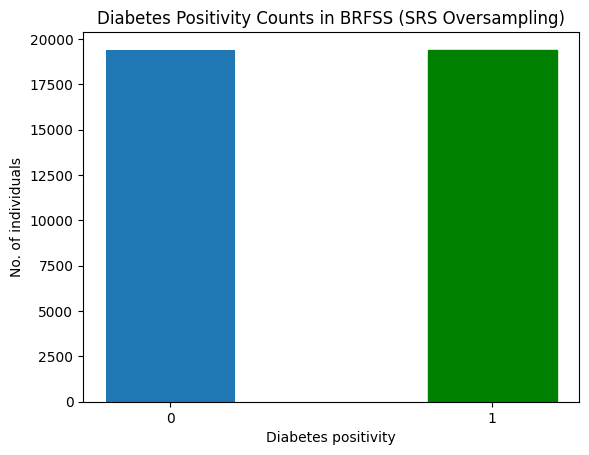

In [53]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2205 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2206 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2211 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - AUC: 0.7706 - loss: 0.5596 - val_AUC: 0.9385 - val_loss: 0.3781
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9349 - loss: 0.3262 - val_AUC: 0.9609 - val_loss: 0.2564
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9611 - loss: 0.2521 - val_AUC: 0.9690 - val_loss: 0.2270
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.9673 - loss: 0.2315 - val_AUC: 0.9723 - val_loss: 0.2404
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9686 - loss: 0.2259 - val_AUC: 0.9745 - val_loss: 0.2121
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.9745 - loss: 0.2040 - val_AUC: 0.9775 - val_loss: 0.1932
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9750 - loss: 0.2001 - val_AUC: 0.9745 - val_loss: 0.2604
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.9785 - loss: 0.1859 - val_AUC: 0.9774 - val_loss: 0.1948
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step -

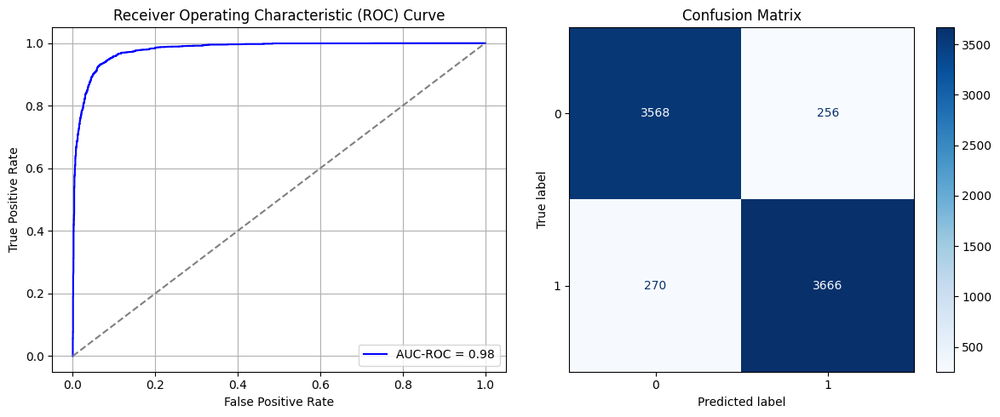

Best threshold based on F1-score: 0.504302978515625
Time elapsed (performance): 65.7566602730003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2212 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2213 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2218 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7068 - loss: 0.8211 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7525 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7469 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2220 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2225 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7174 - loss: 0.7596 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7198 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7480 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7380 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7446 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.7224
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.6687
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2226 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2227 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2232 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7097 - loss: 0.8233 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7240 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7369 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7314
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7641
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2233 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2234 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2239 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7068 - loss: 0.8069 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7506 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7520 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2240 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2241 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2246 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7062 - loss: 0.8288 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7351 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7220 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7260 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7441 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7634 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.6656
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2247 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2248 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2253 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.7051 - loss: 0.8118 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7254 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7398 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7569
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7390 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7593
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7576 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7544 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7540 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.6840
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2255 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2260 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7128 - loss: 0.7813 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.7578
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7493 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7476 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7397 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2261 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2262 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2267 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7117 - loss: 0.7945 - val_AUC: 0.0000e+00 - val_loss: 0.7624
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7242 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7387 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7518 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.7110
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7502 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.6705
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2268 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2269 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2274 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7051 - loss: 0.8191 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7323 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7303 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7441 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.6985
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.7399
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2275 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2276 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2281 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7185 - loss: 0.7801 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7232 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7198 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7425 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7457 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7386 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7748
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7650 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7556 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2282 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2283 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2288 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7087 - loss: 0.8083 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7363 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.7415
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7250 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7424 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7507 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7560 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7513 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2290 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2295 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6998 - loss: 0.8100 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7298 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7312 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7574 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7059
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7626 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2296 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2297 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2302 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7074 - loss: 0.8087 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7166 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7428 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7376 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7454 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7504 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7522 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7566
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7406 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2303 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2304 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2309 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6997 - loss: 0.8397 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7312 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7332 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7506 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7426 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7736
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2310 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2311 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2316 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7149 - loss: 0.7751 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7315 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7322 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7453 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7514 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7524
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2317 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2318 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2323 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7040 - loss: 0.8191 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7502 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7519 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7454
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2325 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2330 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7130 - loss: 0.8069 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7496 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7092
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7580 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7309
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7549 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7547
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2331 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2332 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2337 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7160 - loss: 0.7708 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7593
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7328 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7333 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7516 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7429 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2338 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2339 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2344 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7217 - loss: 0.7809 - val_AUC: 0.0000e+00 - val_loss: 0.7897
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7242 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7293 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7444 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7568 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7640 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2345 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2346 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2351 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7052 - loss: 0.8444 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7146 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7484
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7506 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7502 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2352 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2353 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2358 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - AUC: 0.7672 - loss: 0.5608 - val_AUC: 0.9325 - val_loss: 0.3621
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9295 - loss: 0.3388 - val_AUC: 0.9541 - val_loss: 0.3010
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.9488 - loss: 0.2892 - val_AUC: 0.9611 - val_loss: 0.2556
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9615 - loss: 0.2508 - val_AUC: 0.9694 - val_loss: 0.2344
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9677 - loss: 0.2299 - val_AUC: 0.9731 - val_loss: 0.2129
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.9728 - loss: 0.2095 - val_AUC: 0.9774 - val_loss: 0.2091
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9757 - loss: 0.1987 - val_AUC: 0.9753 - val_loss: 0.2025
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9772 - loss: 0.1913 - val_AUC: 0.9793 - val_loss: 0.1891
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

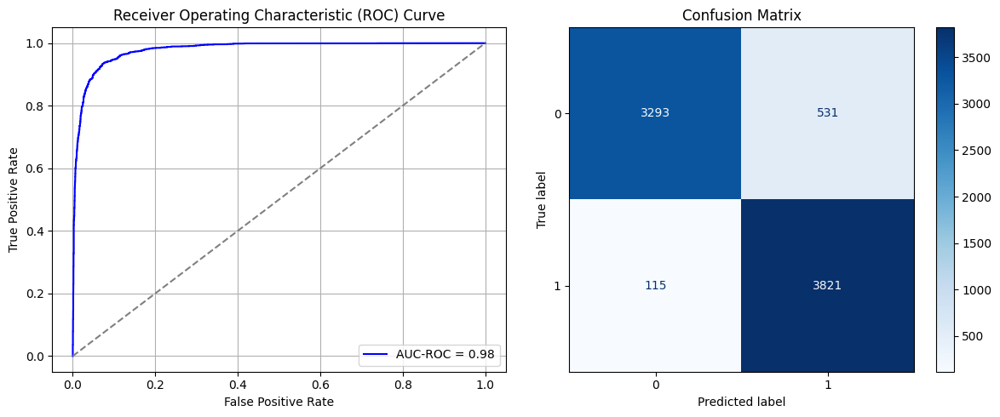

Best threshold based on F1-score: 0.7597680687904358
Time elapsed (performance): 48.67538234099993


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2360 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2365 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7081 - loss: 0.8146 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7230 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7412 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7444 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7546 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7535
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7629 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7441
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7620 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7140
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2366 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2367 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2372 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6973 - loss: 0.8260 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7142 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7022
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7651 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7137
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2373 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2374 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2379 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7213 - loss: 0.7682 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2380 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2381 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2386 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6994 - loss: 0.8220 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7447
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7476 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7476 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7518 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2387 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2388 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2393 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7206 - loss: 0.7737 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7215 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7555
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7515 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7555 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7582 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2394 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2395 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2400 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7153 - loss: 0.7741 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7649
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7405 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7400 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7401
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7492 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7589 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7097
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7588 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2401 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2402 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2407 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6913 - loss: 0.8301 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7508
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7392 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7450 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7493 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7620 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7444 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2408 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2409 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2414 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7040 - loss: 0.8220 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7154 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7304 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7438 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7431 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.9557
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7601 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7616 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2415 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2416 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2421 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7124 - loss: 0.7743 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7126 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7429 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7478 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2422 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2423 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2428 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6986 - loss: 0.8381 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7271 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7471 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7620
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7555 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2430 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7197 - loss: 0.7607 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7308 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7556 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7467 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7450 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7034
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7547 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7545 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2436 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2437 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2442 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7015 - loss: 0.8022 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7213 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7200 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7470 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7558 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7477 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7335
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7610 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2443 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2444 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2449 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7048 - loss: 0.8081 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7550 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2450 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2451 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2456 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7125 - loss: 0.7850 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7138 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7514
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7531 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2457 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2458 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2463 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7034 - loss: 0.8292 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7047 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7265 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7481 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7403 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7536 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7646 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2465 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2470 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7015 - loss: 0.7999 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7178 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7437 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8319
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7580 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7430 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2471 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2472 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2477 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7074 - loss: 0.8095 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7228 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7418 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7434 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7111
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2478 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2479 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2484 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7026 - loss: 0.8209 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7530
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7289 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7412 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7471 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7148
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7516 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2485 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2486 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2491 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7035 - loss: 0.8229 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7152 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7215 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.7096
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7377 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.6712
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7563 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7521 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7619 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2492 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2493 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2498 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7143 - loss: 0.8152 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7084 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7373 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7072
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7562 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7527
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7598 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7625 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.7068
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2500 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2505 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.7617 - loss: 0.5694 - val_AUC: 0.9143 - val_loss: 0.3799
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9179 - loss: 0.3646 - val_AUC: 0.9442 - val_loss: 0.3042
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9427 - loss: 0.3066 - val_AUC: 0.9582 - val_loss: 0.2940
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9515 - loss: 0.2819 - val_AUC: 0.9675 - val_loss: 0.2770
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9586 - loss: 0.2607 - val_AUC: 0.9710 - val_loss: 0.2233
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9669 - loss: 0.2328 - val_AUC: 0.9696 - val_loss: 0.2347
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - AUC: 0.9693 - loss: 0.2245 - val_AUC: 0.9780 - val_loss: 0.1880
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9749 - loss: 0.2024 - val_AUC: 0.9765 - val_loss: 0.2071
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - 

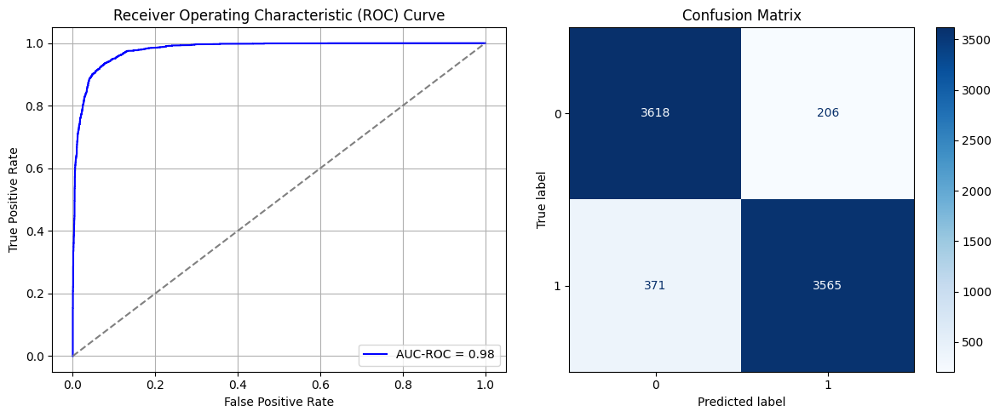

Best threshold based on F1-score: 0.3759593367576599
Time elapsed (performance): 56.31281314200169


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2506 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2507 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2512 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6632 - loss: 0.9336 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7014 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7331 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7661 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7041
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2513 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2514 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2519 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6607 - loss: 0.9474 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7023 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7252 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7354 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7464 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7600 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2520 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2521 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2526 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6566 - loss: 0.9045 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6936 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7340 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7442 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7564 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7552
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2527 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2528 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2533 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6488 - loss: 0.9447 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6927 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7481 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7398 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7454 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8066
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7590 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2535 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2540 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6616 - loss: 0.9042 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6986 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7133 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7357 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 1.0123
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7334 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7441
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7459 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2541 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2542 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2547 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - AUC: 0.6558 - loss: 0.9379 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6933 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7276 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7310 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7563 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7540 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7529 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2548 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2549 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6459 - loss: 0.9654 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6992 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7216 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7364 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7904
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7474 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8028
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7473 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7474 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2555 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2556 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2561 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.6655 - loss: 0.9056 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6990 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7158 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.6883
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7332 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7434
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7484 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7452
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2562 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2563 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2568 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6581 - loss: 0.9177 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7056 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7177 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7266 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7391 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7498 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.6870
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2570 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2575 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6667 - loss: 0.8984 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6983 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7184 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7430 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7488 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7641
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7450 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7467 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7328
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7415 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2576 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2577 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2582 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6597 - loss: 0.9228 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6940 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7282 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7340 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7398 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7518 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.6775
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2583 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2584 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2589 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6694 - loss: 0.8885 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7076 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.9543
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7107 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7408 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7291 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7447 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7404 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.6868
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7489 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2590 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2591 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2596 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6631 - loss: 0.9363 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7019 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7173 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7292 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7316 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7395 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7538 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7082
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7605 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2597 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2598 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2603 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6777 - loss: 0.8800 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6875 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7363 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7360 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7476 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7526 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2605 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2610 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6553 - loss: 0.9140 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7097 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7145 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7338 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7394 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7359 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.6874
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7501 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.7404
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7551 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2611 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2612 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2617 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6580 - loss: 0.9068 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7098 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7737
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7396 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7391 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7407 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7607 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2618 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2619 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2624 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6687 - loss: 0.8890 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7041 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7271 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7312 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7373 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7445 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7610 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7513 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2625 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2626 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2631 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6607 - loss: 0.9079 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6960 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7423 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7517 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7556 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2632 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2633 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2638 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6693 - loss: 0.8997 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7057 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7165 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7175 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7359 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7365 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7017
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7504 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2640 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2645 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6623 - loss: 0.9126 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7039 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9508
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7183 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7441 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7377 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7400 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7620 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2646 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2647 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2652 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - AUC: 0.7831 - loss: 0.5481 - val_AUC: 0.9432 - val_loss: 0.3119
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.9355 - loss: 0.3244 - val_AUC: 0.9556 - val_loss: 0.2727
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.9550 - loss: 0.2710 - val_AUC: 0.9647 - val_loss: 0.2433
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9642 - loss: 0.2420 - val_AUC: 0.9722 - val_loss: 0.2139
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9688 - loss: 0.2259 - val_AUC: 0.9676 - val_loss: 0.2309
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9719 - loss: 0.2140 - val_AUC: 0.9730 - val_loss: 0.2107
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9743 - loss: 0.2040 - val_AUC: 0.9801 - val_loss: 0.1856
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9774 - loss: 0.1894 - val_AUC: 0.9818 - val_loss: 0.1856
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step 

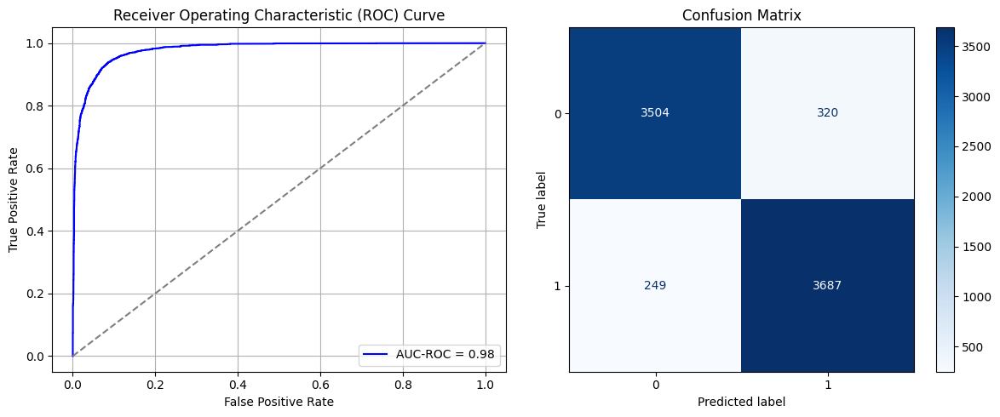

Best threshold based on F1-score: 0.45116540789604187
Time elapsed (performance): 69.56129801499992


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2653 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2654 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2659 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7206 - loss: 0.8142 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7388 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7473 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7721 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7573 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.7383
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7663 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7678 - loss: 0.5294 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2660 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2661 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2666 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7190 - loss: 0.8112 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7545 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7547 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7589 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7814 - loss: 0.5180 - val_AUC: 0.0000e+00 - val_loss: 0.7430
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7698 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2667 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2668 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2673 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7102 - loss: 0.8468 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7492 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7651 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7703 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7267
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7750 - loss: 0.5207 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7682 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7717 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2675 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2680 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7182 - loss: 0.8039 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7391 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7563 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7645
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7537 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7552 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7701 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7744 - loss: 0.5174 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2681 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2682 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2687 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7140 - loss: 0.8063 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7404 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7378 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7679
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7538 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7651 - loss: 0.5312 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7748 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2688 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2689 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2694 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7318 - loss: 0.7984 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7438 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7532 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7622 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7686 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7791 - loss: 0.5139 - val_AUC: 0.0000e+00 - val_loss: 0.7264
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7686 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2695 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2696 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2701 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7257 - loss: 0.7956 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7341 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7597 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7575 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7709 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.7432
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7713 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.7288
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7768 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2702 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2703 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2708 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7238 - loss: 0.8130 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7403 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7460 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7642 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7553
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.5236 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2710 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2715 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7413 - loss: 0.7468 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7323 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7435 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7610 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7732 - loss: 0.5236 - val_AUC: 0.0000e+00 - val_loss: 0.7306
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2716 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2717 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2722 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7334 - loss: 0.7691 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7302 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7483 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7597 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7503 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7636 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7341
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7662 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7700 - loss: 0.5224 - val_AUC: 0.0000e+00 - val_loss: 0.7225
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2723 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2724 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2729 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7067 - loss: 0.8615 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7387 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7623 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7521 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7628 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7600 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7725 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.6879
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7709 - loss: 0.5242 - val_AUC: 0.0000e+00 - val_loss: 0.7861
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2730 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2731 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2736 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7356 - loss: 0.7756 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7471 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7451 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7640 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7731 - loss: 0.5235 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7701 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.7310
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7681 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2737 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2738 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2743 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7194 - loss: 0.8174 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7308 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7550 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7462 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7508 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7729 - loss: 0.5219 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7748 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2745 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2750 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7337 - loss: 0.7994 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7357 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7387 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7420
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7550 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7408
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7470 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7644
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7598 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7550 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7692 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2751 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2752 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2757 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7156 - loss: 0.8412 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7540 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7645 - loss: 0.5354 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7696 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7382
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7668 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7714 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2758 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2759 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2764 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7218 - loss: 0.8296 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7393 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7374 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7604 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7793 - loss: 0.5180 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7583 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7365
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7648 - loss: 0.5327 - val_AUC: 0.0000e+00 - val_loss: 0.7200
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2765 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2766 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2771 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7239 - loss: 0.8129 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7330 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7568 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7619 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.7407
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7687 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7758 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7683 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2772 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2773 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2778 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7320 - loss: 0.7795 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7368 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7507 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7694 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7646 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7685 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7719 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7592 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7512
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2780 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2785 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7180 - loss: 0.8228 - val_AUC: 0.0000e+00 - val_loss: 0.7242
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7247 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7513 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7606 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7601 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7714
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7494 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7681 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7699 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2786 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2787 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2792 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7227 - loss: 0.8171 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7443 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7394 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7721 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7680 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7760 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.7451
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7739 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2793 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2794 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2799 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7717 - loss: 0.5560 - val_AUC: 0.9351 - val_loss: 0.3264
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9285 - loss: 0.3410 - val_AUC: 0.9625 - val_loss: 0.2605
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.9534 - loss: 0.2769 - val_AUC: 0.9693 - val_loss: 0.2384
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9666 - loss: 0.2337 - val_AUC: 0.9715 - val_loss: 0.2180
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.9698 - loss: 0.2219 - val_AUC: 0.9763 - val_loss: 0.2100
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9722 - loss: 0.2116 - val_AUC: 0.9781 - val_loss: 0.1940
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.9776 - loss: 0.1901 - val_AUC: 0.9798 - val_loss: 0.2013
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9794 - loss: 0.1822 - val_AUC: 0.9822 - val_loss: 0.1815
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - 

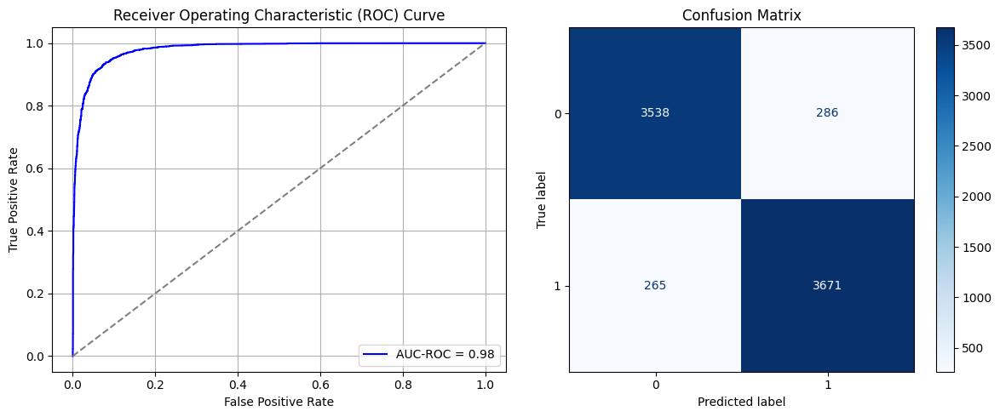

Best threshold based on F1-score: 0.47250956296920776
Time elapsed (performance): 77.11509485499846


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2800 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2801 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2806 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6891 - loss: 0.8849 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7220
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7367 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7441 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7591
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7584 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7699 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7576 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2807 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2808 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2813 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6882 - loss: 0.8618 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7368 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7541 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7579 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7520 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7493 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7625 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7563 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2815 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2820 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6959 - loss: 0.8594 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7294 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7673 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7134
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7499 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7560 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7422 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7653 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7553 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2821 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2822 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2827 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6859 - loss: 0.8722 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7484 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7513 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7449 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7658 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.6889
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7553 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7651 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2828 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2829 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2834 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.6921 - loss: 0.8766 - val_AUC: 0.0000e+00 - val_loss: 0.7897
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7511 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7451 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7580 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7677 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.7020
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7591 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7561 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2835 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2836 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2841 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6912 - loss: 0.8723 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7268 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7345 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7532 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7482 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7568 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.7174
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7492 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2842 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2843 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2848 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6885 - loss: 0.8790 - val_AUC: 0.0000e+00 - val_loss: 0.8072
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7377 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7563 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7581 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7696 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.7247
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7568 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7659 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7768 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7255
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2850 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2855 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6752 - loss: 0.9159 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7338 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7534 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.7559
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7399 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7705 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7594 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7475 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7568 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.7172
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2856 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2857 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2862 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6897 - loss: 0.8671 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7357 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7530 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7531 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7181
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7649 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7634 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2863 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2864 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2869 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6899 - loss: 0.8662 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7318 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7504 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7435 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.6951
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7560 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7589 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7646 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7615 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2870 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2871 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2876 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6975 - loss: 0.8556 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7380 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7479 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7509 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7397 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7515 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7651 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.7081
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2877 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2878 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2883 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.6878 - loss: 0.8763 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7480 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7472 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7537 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7637 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7617 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7618 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2885 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2890 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6840 - loss: 0.8868 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7394 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7417 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7499 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7721 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7658 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7635 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7674 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.7301
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2891 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2892 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2897 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6914 - loss: 0.8652 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7372 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7524 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7570 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7546
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7606 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7669 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7610 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2898 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2899 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2904 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6730 - loss: 0.9083 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7363 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7423 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7548 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7138
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7612 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7585 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.7005
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7464 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7684 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2905 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2906 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2911 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6920 - loss: 0.8618 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7298 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7534 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7524 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7505 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7528 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.6822
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7460 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7571 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2912 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2913 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2918 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6998 - loss: 0.8301 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7444 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7460 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7556 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7588 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7638 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7688 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7658 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7136
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2920 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2925 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6883 - loss: 0.8870 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7370 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7501 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7484
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7587 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7639 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7476 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7590 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7569 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 9/10
205/205 ━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2926 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2927 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2932 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6984 - loss: 0.8570 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7313 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7508 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7590 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7506 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7556 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7598 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2933 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2934 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2939 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6879 - loss: 0.8772 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7401 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7506 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7452 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7547 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7484 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7663 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7552 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 9/10
205/205 ━━━━

In [54]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [58]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5320761245674741
Var: 0.0015840339676261189


In [57]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.101049  0.519031
1   0.088656  0.536332
2   0.055291  0.602076
3   0.111535  0.498270
4   0.133460  0.480969
..       ...       ...
95  0.074357  0.546713
96  0.058151  0.584775
97  0.093422  0.508651
98  0.107722  0.494810
99  0.087703  0.525952

[100 rows x 2 columns]


## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, we take $k=10$ for the source data sampling, and take $k=20$ for the target training data resampling.

In [95]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full.iloc[:, -1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train.iloc[:, -1], 20)
print(y_T_train_Sy)

3910
19400
Nsamples= 39.61636828644501
0        0
1        0
2        0
3        0
4        0
        ..
23260    1
23270    1
23280    1
23290    1
23300    1
Name: Y2, Length: 38559, dtype: int64
1262
4090
Nsamples= 44.817749603803485
601     0
172     0
5113    0
3875    0
3981    0
       ..
5840    1
6107    1
5661    1
2646    1
5795    1
Name: Y, Length: 8124, dtype: int64


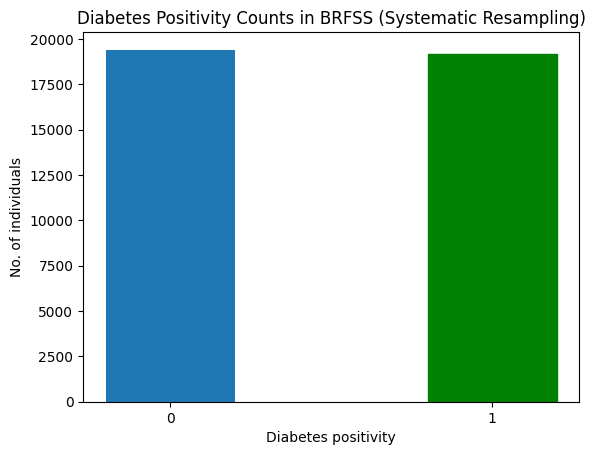

In [96]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_525"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3675 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3676 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3680 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3681 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - AUC: 0.7799 - loss: 0.5546 - val_AUC: 0.9383 - val_loss: 0.3223
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - AUC: 0.9327 - loss: 0.3312 - val_AUC: 0.9545 - val_loss: 0.2773
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9542 - loss: 0.2741 - val_AUC: 0.9653 - val_loss: 0.2635
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9634 - loss: 0.2451 - val_AUC: 0.9720 - val_loss: 0.2629
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - AUC: 0.9676 - loss: 0.2301 - val_AUC: 0.9752 - val_loss: 0.2010
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9710 - loss: 0.2177 - val_AUC: 0.9758 - val_loss: 0.1967
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9755 - loss: 0.1993 - val_AUC: 0.9760 - val_loss: 0.2035
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9775 - loss: 0.1903 - val_AUC: 0.9785 - val_loss: 0.1906
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/ste

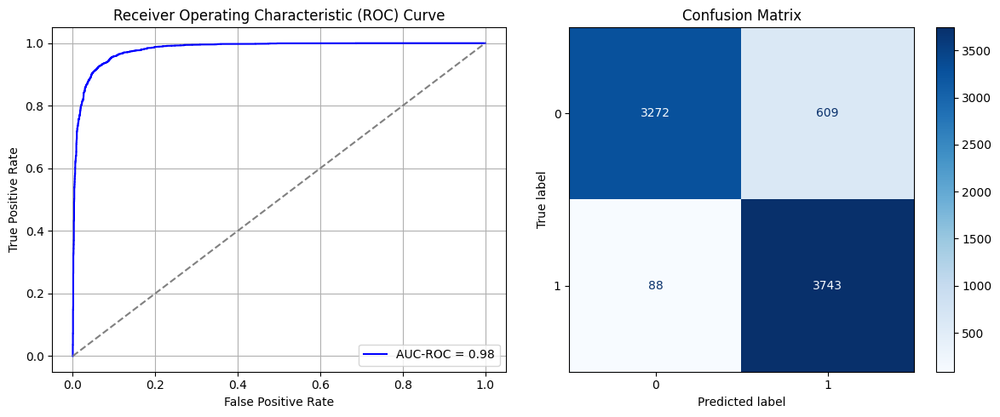

Best threshold based on F1-score: 0.7037515640258789
Time elapsed (performance): 79.28516714600119


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_526"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3682 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3683 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3687 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3688 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6866 - loss: 0.7681 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7557 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7698 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7560 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_527"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3689 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3690 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3694 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3695 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6970 - loss: 0.7428 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.8452
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7409 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7571 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7659 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_528"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3696 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3697 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3701 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3702 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6743 - loss: 0.7854 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7507 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7669 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7638 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7560 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_529"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3703 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3704 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3708 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3709 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6818 - loss: 0.7640 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7568 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7578 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7571 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_530"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3710 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3711 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3715 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3716 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6935 - loss: 0.7398 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7456 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7541 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7478 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7521 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7704
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7667 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7149
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_531"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3717 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3718 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3722 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3723 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6919 - loss: 0.7528 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7352 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7403 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7659 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7751 - loss: 0.5208 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_532"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3724 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3725 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3729 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3730 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6712 - loss: 0.7887 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.6911
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7558 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_533"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3731 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3732 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3736 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3737 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6759 - loss: 0.7828 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7622 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7629 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7588 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7619 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_534"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3738 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3739 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3743 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3744 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.6899 - loss: 0.7279 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7474 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7529 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7602 - loss: 0.5308 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7646 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.6737
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7571 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_535"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3745 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3746 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3750 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3751 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6796 - loss: 0.7742 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7424 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7517 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7678
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7649 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.7244
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.6255
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_536"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3752 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3753 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3757 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3758 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6811 - loss: 0.7548 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.7161
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7645 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7518
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.9580
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7685 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7765 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_537"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3759 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3760 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3764 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3765 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6729 - loss: 0.7781 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7250 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7504 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7584 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7616 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7653 - loss: 0.5312 - val_AUC: 0.0000e+00 - val_loss: 0.7204
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7684 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_538"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3766 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3767 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3771 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3772 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6664 - loss: 0.8032 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7559 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7602 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7666 - loss: 0.5303 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_539"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3773 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3774 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3778 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3779 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6772 - loss: 0.7711 - val_AUC: 0.0000e+00 - val_loss: 0.9617
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7195
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7483 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.7539
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7628 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7635 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.7138
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7595 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_540"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3780 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3781 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3785 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3786 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6816 - loss: 0.7603 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7565 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7676 - loss: 0.5252 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_541"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3787 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3788 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3792 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3793 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6710 - loss: 0.7925 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7502 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7485 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.7360
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7708 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7642 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_542"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3794 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3795 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3799 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3800 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6818 - loss: 0.7564 - val_AUC: 0.0000e+00 - val_loss: 0.9892
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7255 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7569 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7455 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7608 - loss: 0.5327 - val_AUC: 0.0000e+00 - val_loss: 0.7353
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7588 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7692 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_543"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3801 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3802 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3806 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3807 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6768 - loss: 0.7779 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7305 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.7578
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7586 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_544"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3808 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3809 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3813 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3814 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6768 - loss: 0.7610 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7056
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7409 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7620 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7389
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_545"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3815 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3816 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3820 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3821 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6756 - loss: 0.7544 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7342 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7573 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.9351
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7678 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.7736
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7718 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7304
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_546"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3822 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3823 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3827 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3828 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.7799 - loss: 0.5513 - val_AUC: 0.9338 - val_loss: 0.3860
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9275 - loss: 0.3435 - val_AUC: 0.9562 - val_loss: 0.3306
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9480 - loss: 0.2919 - val_AUC: 0.9662 - val_loss: 0.2546
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9596 - loss: 0.2571 - val_AUC: 0.9737 - val_loss: 0.2107
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9699 - loss: 0.2219 - val_AUC: 0.9747 - val_loss: 0.2147
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9729 - loss: 0.2097 - val_AUC: 0.9756 - val_loss: 0.1997
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9739 - loss: 0.2056 - val_AUC: 0.9766 - val_loss: 0.1974
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9780 - loss: 0.1889 - val_AUC: 0.9752 - val_loss: 0.2014
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - 

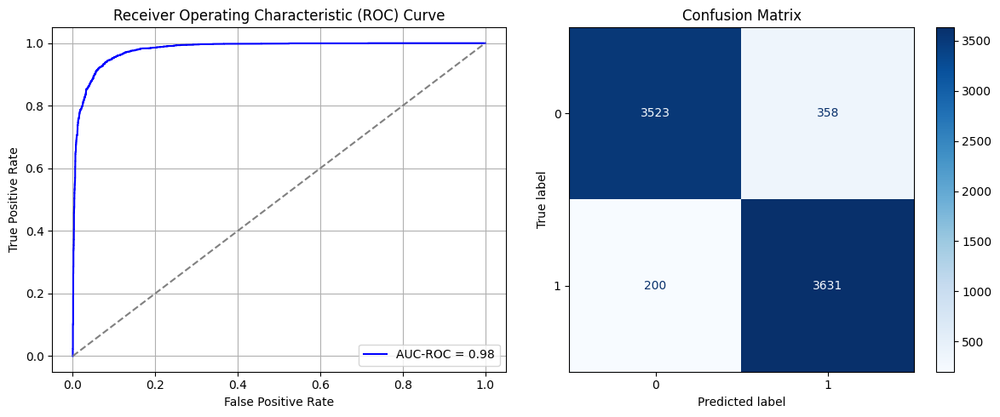

Best threshold based on F1-score: 0.5275794863700867
Time elapsed (performance): 55.09391213500203


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_547"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3829 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3830 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3834 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3835 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7398 - loss: 0.6569 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7351 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7412 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_548"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3836 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3837 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3841 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3842 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7343 - loss: 0.6817 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7443 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7462 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7601 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7595 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_549"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3843 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3844 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3848 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3849 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7471 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7458 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7438 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7490 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7556 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.6556
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_550"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3850 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3851 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3855 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3856 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7362 - loss: 0.6778 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7446 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7494 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7405 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7549 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_551"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3857 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3858 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3862 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3863 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7259 - loss: 0.6756 - val_AUC: 0.0000e+00 - val_loss: 0.7378
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7485 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7471 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7606 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_552"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3864 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3865 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3869 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3870 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7380 - loss: 0.6521 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7451 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.9697
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7435 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7460 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7596 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_553"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3871 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3872 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3876 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3877 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7313 - loss: 0.6687 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7499 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7452 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7566 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7562 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_554"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3878 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3879 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3883 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3884 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7347 - loss: 0.6653 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7426 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7467 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7476 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7638 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7553 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7502 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_555"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3885 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3886 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3890 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3891 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7378 - loss: 0.6591 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7331 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7546 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7574 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_556"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3892 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3893 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3897 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3898 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7207 - loss: 0.6908 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7505 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7626 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_557"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3899 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3900 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3904 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3905 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7405 - loss: 0.6547 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7657
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7493 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7522 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_558"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3906 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3907 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3911 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3912 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7491 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7575 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7495 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7737
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7579 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_559"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3913 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3914 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3918 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3919 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7443 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7425 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7424 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7476 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7596 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_560"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3920 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3921 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3925 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3926 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7247 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7371 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7506 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7451
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7492 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_561"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3927 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3928 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3932 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3933 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7387 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7232
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7412 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7637 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_562"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3934 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3935 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3939 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3940 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7378 - loss: 0.6499 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.6879
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7493 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7445 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7507 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7510 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7629 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.7863
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_563"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3941 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3942 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3946 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3947 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7399 - loss: 0.6564 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7426 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7466 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7470 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7628
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7448 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7496 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7646 - loss: 0.5323 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_564"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3948 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3949 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3953 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3954 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7441 - loss: 0.6422 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7362 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7545 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7409 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_565"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3955 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3956 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3960 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3961 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7232 - loss: 0.6916 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7462 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7449 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7458 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7519 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7561 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7738
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7508 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_566"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3962 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3963 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3967 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3968 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7384 - loss: 0.6518 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7445 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7555 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7569 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.6671
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_567"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3969 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3970 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3974 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3975 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - AUC: 0.7680 - loss: 0.5630 - val_AUC: 0.9283 - val_loss: 0.3507
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9243 - loss: 0.3499 - val_AUC: 0.9594 - val_loss: 0.2620
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9525 - loss: 0.2786 - val_AUC: 0.9644 - val_loss: 0.3172
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - AUC: 0.9635 - loss: 0.2450 - val_AUC: 0.9705 - val_loss: 0.2290
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.9666 - loss: 0.2341 - val_AUC: 0.9723 - val_loss: 0.2221
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9735 - loss: 0.2074 - val_AUC: 0.9781 - val_loss: 0.2372
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.9765 - loss: 0.1957 - val_AUC: 0.9797 - val_loss: 0.1888
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9757 - loss: 0.1970 - val_AUC: 0.9805 - val_loss: 0.2001
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - 

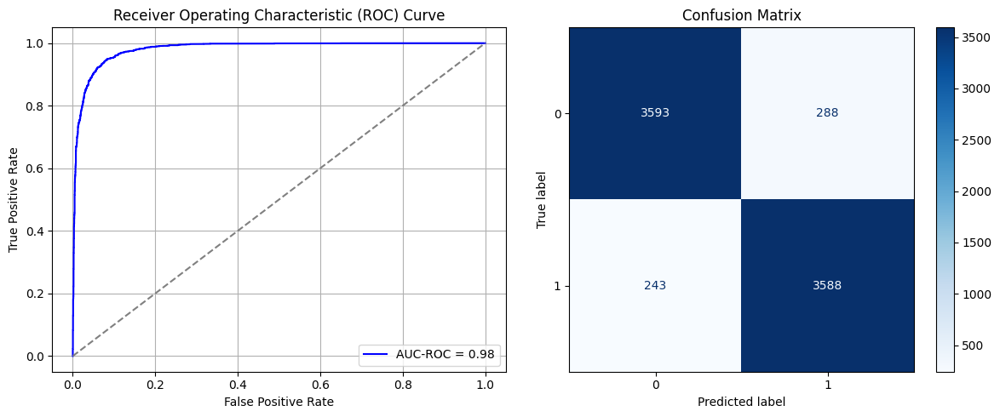

Best threshold based on F1-score: 0.4479008615016937
Time elapsed (performance): 62.97828009799923


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_568"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3976 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3977 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3981 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3982 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6896 - loss: 0.7995 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7514 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7513 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7648 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.6365
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7707 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_569"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3983 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3984 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3988 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3989 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6810 - loss: 0.8281 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7269 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7691 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7749 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7722 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7743 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7716 - loss: 0.5164 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7697 - loss: 0.5250 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_570"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3990 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3991 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3995 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3996 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6904 - loss: 0.7959 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7306 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7651 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7378
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7728 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7620 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7642 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7647 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7668 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_571"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3997 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3998 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4002 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4003 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - AUC: 0.6865 - loss: 0.8190 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7457 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7725 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7582 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7618 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7460
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7586 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7628 - loss: 0.5294 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_572"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4004 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4005 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4009 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4010 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - AUC: 0.6880 - loss: 0.8147 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7437 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7523 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7661
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7731 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7595 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7561 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.7225
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7795 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7681 - loss: 0.5287 - val_AUC: 0.0000e+00 - val_loss: 0.7093
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_573"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4011 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4012 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4016 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4017 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6919 - loss: 0.8178 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7331 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7729
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7534 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7081
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7722 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7752 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7728 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7708 - loss: 0.5269 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7677 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_574"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4018 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4019 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4023 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4024 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6888 - loss: 0.8028 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7484 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7287
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7466 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7678 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7587 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7724 - loss: 0.5209 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7702 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_575"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4025 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4026 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4030 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4031 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6780 - loss: 0.8429 - val_AUC: 0.0000e+00 - val_loss: 0.9579
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7415 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7516 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7447 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7592 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7657 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7569 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7800 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_576"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4032 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4033 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4037 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4038 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7023 - loss: 0.7939 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7341 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7553 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7592 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7946
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7616 - loss: 0.5294 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7778 - loss: 0.5121 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7638 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7583 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_577"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4039 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4040 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4044 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4045 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7028 - loss: 0.7905 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7325 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7535 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7572 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7709 - loss: 0.5219 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7650 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7674 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7675 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_578"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4046 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4047 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4051 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4052 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.6759 - loss: 0.8271 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7507 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7509 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7569 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7627 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7685 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7751 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7690 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_579"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4053 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4054 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4058 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4059 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6838 - loss: 0.8336 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7286 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7624 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7356
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7625 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7689 - loss: 0.5265 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7674 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7698 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7637 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_580"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4060 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4061 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4065 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4066 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6888 - loss: 0.8033 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7324 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7442 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7622 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7641 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7651 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.7368
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7480 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7649 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_581"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4067 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4068 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4072 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4073 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6923 - loss: 0.8043 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7378 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7555 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7615 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7645 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7736 - loss: 0.5211 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7737 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7708 - loss: 0.5185 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_582"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4074 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4075 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4079 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4080 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6785 - loss: 0.8316 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7411 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7598 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.7359
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7635 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7615 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.6655
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7658 - loss: 0.5261 - val_AUC: 0.0000e+00 - val_loss: 0.7430
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7737 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_583"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4081 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4082 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4086 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4087 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6806 - loss: 0.8340 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7309 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7609 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7687 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7610 - loss: 0.5314 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7554 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7422
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7645 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7655 - loss: 0.5259 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_584"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4088 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4089 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4093 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4094 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6948 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7511 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7648 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7629
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7744 - loss: 0.5229 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7549 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7692 - loss: 0.5261 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7688 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_585"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4095 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4096 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4100 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4101 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6879 - loss: 0.8063 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7327 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7616 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7647 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7583 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7568 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7659 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7734 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_586"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4102 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4103 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4107 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4108 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6834 - loss: 0.8317 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7603 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7607 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7705 - loss: 0.5247 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7809 - loss: 0.5133 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7709 - loss: 0.5208 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_587"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4109 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4110 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4114 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4115 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6828 - loss: 0.8167 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7386 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7574 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7449
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7536 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7603 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7693 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7698 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7657 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_588"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4116 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4117 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4121 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4122 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.7940 - loss: 0.5330 - val_AUC: 0.9476 - val_loss: 0.3473
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - AUC: 0.9384 - loss: 0.3167 - val_AUC: 0.9596 - val_loss: 0.2774
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9552 - loss: 0.2706 - val_AUC: 0.9689 - val_loss: 0.2332
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.9631 - loss: 0.2457 - val_AUC: 0.9734 - val_loss: 0.2317
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9715 - loss: 0.2156 - val_AUC: 0.9687 - val_loss: 0.2297
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9730 - loss: 0.2090 - val_AUC: 0.9774 - val_loss: 0.1923
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9762 - loss: 0.1957 - val_AUC: 0.9756 - val_loss: 0.2224
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9758 - loss: 0.1978 - val_AUC: 0.9736 - val_loss: 0.2093
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step

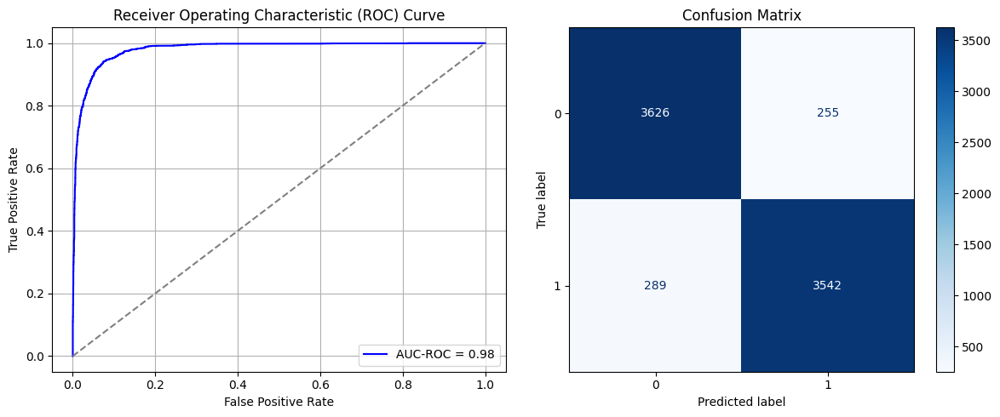

Best threshold based on F1-score: 0.43064820766448975
Time elapsed (performance): 72.42784946400207


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_589"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4123 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4124 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4128 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4129 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5715 - loss: 1.0709 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6091 - loss: 0.6381 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6549 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6776 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9631
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6844 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 1.1068
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7016 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6884 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_590"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4130 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4131 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4135 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4136 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5763 - loss: 1.0549 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6098 - loss: 0.6407 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6416 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6624 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 1.0383
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6873 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6919 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6962 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7088 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_591"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4137 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4138 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4142 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4143 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5836 - loss: 1.0418 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6186 - loss: 0.6353 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6545 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6702 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6787 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6917 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7038 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_592"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4144 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4145 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4149 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4150 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.5718 - loss: 1.0558 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6071 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 1.0237
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6409 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6791 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6715 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6961 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6955 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9706
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6868 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_593"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4151 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4152 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4156 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4157 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.5810 - loss: 1.0268 - val_AUC: 0.0000e+00 - val_loss: 1.0218
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5991 - loss: 0.6397 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6526 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6736 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.7331
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6825 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9479
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6813 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9675
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6881 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6996 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_594"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4158 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4159 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4163 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4164 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5883 - loss: 1.0329 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6082 - loss: 0.6398 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6525 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6682 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6831 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6772 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6965 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_595"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4165 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4166 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4169 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4170 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4171 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5581 - loss: 1.1019 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6071 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6616 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9593
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6792 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9899
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6744 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6859 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6889 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7004 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_596"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4172 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4173 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4176 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4177 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4178 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5814 - loss: 1.0803 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6162 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 1.0106
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6565 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6686 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6832 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7004 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6909 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 1.0333
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6952 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9630
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_597"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4179 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4180 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4183 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4184 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4185 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5631 - loss: 1.0987 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6193 - loss: 0.6392 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6576 - loss: 0.6272 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6653 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6842 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6931 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6884 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7020 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_598"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4186 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4187 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4190 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4191 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4192 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5806 - loss: 1.0470 - val_AUC: 0.0000e+00 - val_loss: 1.0018
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6091 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6512 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.9629
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6656 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6832 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6839 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6871 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6948 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_599"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4193 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4194 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4197 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4198 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4199 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5792 - loss: 1.0395 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6198 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6420 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6801 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6708 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6823 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6983 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6967 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_600"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4200 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4201 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4204 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4205 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4206 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5731 - loss: 1.0418 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6147 - loss: 0.6413 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6409 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9623
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6718 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 1.0415
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6792 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.9707
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6840 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6873 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 1.0170
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6904 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.9910
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_601"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4207 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4208 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4211 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4212 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4213 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5639 - loss: 1.0922 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6147 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6420 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6655 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.9646
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6859 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6845 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6843 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_602"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4214 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4215 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4218 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4219 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4220 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5757 - loss: 1.0689 - val_AUC: 0.0000e+00 - val_loss: 1.0289
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6113 - loss: 0.6428 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6566 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6738 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6822 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6964 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6891 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9925
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_603"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4221 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4222 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4225 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4226 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4227 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5764 - loss: 1.1075 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6234 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6453 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 1.0642
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6677 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6706 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9650
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6785 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7046 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6944 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_604"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4228 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4229 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4232 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4233 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4234 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5659 - loss: 1.0739 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6118 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6414 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6706 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9548
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6785 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.9650
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6854 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8192
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6898 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6938 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_605"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4235 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4236 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4239 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4240 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4241 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5692 - loss: 1.0666 - val_AUC: 0.0000e+00 - val_loss: 0.9800
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6193 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6577 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.9876
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6650 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6906 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9568
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6968 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 1.0134
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7028 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7069 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 1.1004
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_606"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4242 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4243 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4246 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4247 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4248 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.5672 - loss: 1.0639 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6022 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.9591
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6469 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6744 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6847 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6845 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6950 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7068 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_607"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4249 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4250 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4253 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4254 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4255 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5784 - loss: 0.9956 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6165 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6659 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6701 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6824 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.9466
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7027 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6946 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7114 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_608"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4256 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4257 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4260 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4261 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4262 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5842 - loss: 0.9810 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6139 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6380 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6733 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 1.0497
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6769 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6746 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7064 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6973 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9410
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_609"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4263 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4264 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4267 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4268 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4269 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - AUC: 0.7671 - loss: 0.5632 - val_AUC: 0.9344 - val_loss: 0.3425
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9347 - loss: 0.3254 - val_AUC: 0.9661 - val_loss: 0.2372
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - AUC: 0.9595 - loss: 0.2578 - val_AUC: 0.9678 - val_loss: 0.2336
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - AUC: 0.9662 - loss: 0.2349 - val_AUC: 0.9733 - val_loss: 0.2084
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9717 - loss: 0.2147 - val_AUC: 0.9739 - val_loss: 0.2162
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9750 - loss: 0.2022 - val_AUC: 0.9774 - val_loss: 0.2021
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9778 - loss: 0.1886 - val_AUC: 0.9750 - val_loss: 0.2319
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - AUC: 0.9752 - loss: 0.1998 - val_AUC: 0.9793 - val_loss: 0.2003
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/ste

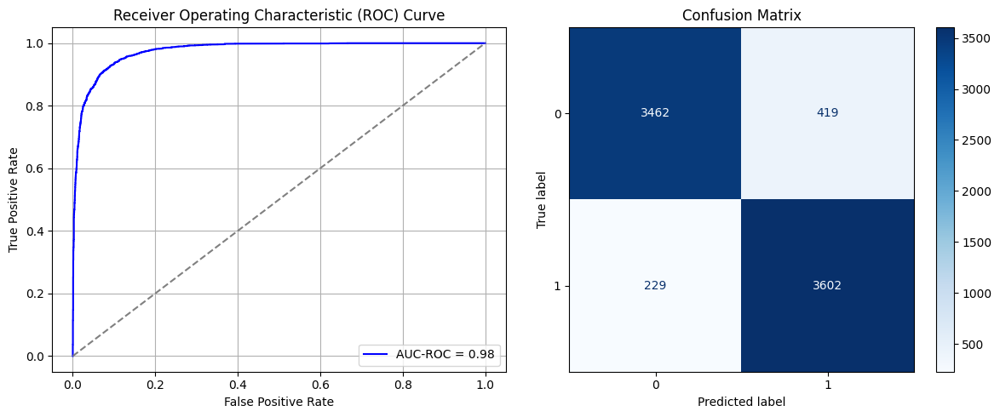

Best threshold based on F1-score: 0.5245373845100403
Time elapsed (performance): 86.05849694299832


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_610"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4270 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4271 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4274 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4275 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4276 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5118 - loss: 1.1768 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5855 - loss: 0.6490 - val_AUC: 0.0000e+00 - val_loss: 1.0081
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6635 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.9959
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6974 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 1.0148
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7124 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7239 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.7408
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_611"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4277 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4278 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4281 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4282 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4283 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5231 - loss: 1.1834 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5826 - loss: 0.6510 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6658 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6829 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7130 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 1.0111
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7283 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_612"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4284 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4285 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4288 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4289 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4290 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5111 - loss: 1.2154 - val_AUC: 0.0000e+00 - val_loss: 0.9833
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5795 - loss: 0.6523 - val_AUC: 0.0000e+00 - val_loss: 1.0124
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6729 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7014 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9583
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7145 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 1.0178
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7300 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7395 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_613"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4291 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4292 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4295 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4296 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4297 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.5058 - loss: 1.2039 - val_AUC: 0.0000e+00 - val_loss: 1.0659
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6104 - loss: 0.6466 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6746 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 1.0106
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6950 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7586
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7137 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7224 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9819
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_614"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4298 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4299 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4302 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4303 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4304 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5059 - loss: 1.2343 - val_AUC: 0.0000e+00 - val_loss: 1.0037
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5874 - loss: 0.6492 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6740 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6988 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 1.0071
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7105 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7272 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7432 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7376 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_615"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4305 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4306 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4309 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4310 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4311 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5172 - loss: 1.1920 - val_AUC: 0.0000e+00 - val_loss: 0.9885
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5965 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6626 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6848 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 1.0018
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7093 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9698
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9721
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_616"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4312 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4313 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4316 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4317 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4318 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.5174 - loss: 1.1917 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.5821 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 0.9690
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6741 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7046 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7220 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7305 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7346 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_617"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4319 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4320 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4323 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4324 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4325 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5126 - loss: 1.2250 - val_AUC: 0.0000e+00 - val_loss: 1.0703
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5835 - loss: 0.6488 - val_AUC: 0.0000e+00 - val_loss: 0.9591
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6672 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6924 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7174 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7198 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9956
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7319 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7326 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_618"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4326 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4327 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4330 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4331 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4332 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5291 - loss: 1.1488 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6062 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6724 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9863
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6945 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.6922
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7090 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7379 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7418 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_619"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4333 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4334 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4337 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4338 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4339 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5249 - loss: 1.2022 - val_AUC: 0.0000e+00 - val_loss: 0.9996
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5923 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6634 - loss: 0.6314 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7005 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9495
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7117 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7360 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7233 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7419 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_620"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4340 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4341 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4344 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4345 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4346 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.5225 - loss: 1.1902 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.5933 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6729 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6830 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7108 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7280 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7261 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7173 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_621"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4347 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4348 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4351 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4352 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4353 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5059 - loss: 1.1990 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5858 - loss: 0.6492 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6638 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6991 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.9412
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7136 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7235 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7326 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9773
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7364 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_622"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4354 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4355 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4358 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4359 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4360 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5263 - loss: 1.1629 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5945 - loss: 0.6498 - val_AUC: 0.0000e+00 - val_loss: 1.1185
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6564 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9883
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6916 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7185 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 1.0074
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_623"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4361 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4362 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4365 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4366 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4367 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5199 - loss: 1.1905 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5819 - loss: 0.6510 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6677 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6865 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7000 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7224 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7195 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7264 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_624"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4368 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4369 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4372 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4373 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4374 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5260 - loss: 1.1622 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6063 - loss: 0.6490 - val_AUC: 0.0000e+00 - val_loss: 1.0722
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6782 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9770
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7150 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9818
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7285 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7391 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7412 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_625"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4375 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4376 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4379 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4380 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4381 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5169 - loss: 1.1909 - val_AUC: 0.0000e+00 - val_loss: 1.0450
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5754 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6773 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6944 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7142 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9849
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7145 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7363 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_626"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4382 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4383 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4386 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4387 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4388 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - AUC: 0.5144 - loss: 1.2081 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6030 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6741 - loss: 0.6323 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6880 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7105 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7143 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7215 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7342 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_627"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4389 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4390 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4393 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4394 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4395 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5241 - loss: 1.1974 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5740 - loss: 0.6526 - val_AUC: 0.0000e+00 - val_loss: 0.9584
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6710 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6942 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.7641
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7046 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7263 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7424 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 1.0530
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_628"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4396 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4397 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4400 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4401 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4402 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.5088 - loss: 1.1986 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5892 - loss: 0.6465 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6740 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6944 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 1.1130
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7104 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7118 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7242 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7248 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 1.0371
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_629"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4403 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4404 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4407 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4408 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4409 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5103 - loss: 1.2031 - val_AUC: 0.0000e+00 - val_loss: 0.9442
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6151 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 1.0878
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6757 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7130 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7397
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7167 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7253 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7301 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 9/10
204/204 ━━━━━

In [97]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [99]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.563044982698962
Var: 0.007699044781455192


In [103]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.064824  0.550173
1   0.095329  0.494810
2   0.081030  0.532872
3   0.113441  0.442907
4   0.073403  0.536332
..       ...       ...
95  0.080076  0.574394
96  0.122021  0.508651
97  0.056244  0.626298
98  0.115348  0.522491
99  0.085796  0.574394

[100 rows x 2 columns]
